In [133]:
import sys
!{sys.executable} -m pip install XGBoost

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/72.0 MB ? eta -:--:--
   ---------------------------------------- 0.5/72.0 MB 6.6 MB/s eta 0:00:11
   - -------------------------------------- 2.1/72.0 MB 5.8 MB/s eta 0:00:13
   - -------------------------------------- 3.1/72.0 MB 6.2 MB/s eta 0:00:12
   -- ------------------------------------- 5.2/72.0 MB 6.8 MB/s eta 0:00:10
   --- ------------------------------------ 6.0/72.0 MB 6.6 MB/s eta 0:00:10
   ---- ----------------------------------- 7.6/72.0 MB 6.3 MB/s eta 0:00:11
   ---- ----------------------------------- 8.4/72.0 MB 5.9 MB/s eta 0:00:11
   ---- ----------------------------------- 8.9/72.0 MB 5.7 MB/s eta 0:00:12
   ----- ---------------------------------- 10.0/72.0 MB 5.5 MB/s eta 0:00:12
   ------ --------------------------------- 11.5/72.0 MB 5.7 MB/s eta 0:00:11
   ------- -------------------------------- 12.8/72.0 MB 5.8 MB/s eta 0:00:11
  


[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [3]:
df=pd.read_csv("housepricesdata/train.csv")
pd.set_option('display.max_columns',200)
pd.set_option('display.max_rows',200)

#Data Ourview

In [4]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
df.shape

(1460, 81)

In [6]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [7]:
df.dtypes.unique()

array([dtype('int64'), dtype('O'), dtype('float64')], dtype=object)

In [8]:
df.select_dtypes(include=['object']).columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [9]:
categorized_cols={'continuous_area_cols' :['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea'],
'discrete_num_cols' : ['OverallQual','OverallCond','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','FullBath','HalfBath','BsmtFullBath','BsmtHalfBath','YearBuilt','YearRemodAdd','GarageYrBlt','YrSold','MoSold']}

In [10]:
numerical_features=df.select_dtypes(include=['number']).columns

In [11]:
numerical_features

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [12]:
categorical_features=df.select_dtypes(include=['object']).columns

In [13]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [14]:
categorical_features

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [15]:
transformations={'Binary':[],'Skew':[],'Ordinal':[]}

In [16]:
feat_eng={}

#Identifying null values

In [17]:
null_percent=(df.isnull().sum() * 100 / len(df)).sort_values(ascending=False)

In [18]:
null_percent[:20]

PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
MasVnrType      59.726027
FireplaceQu     47.260274
LotFrontage     17.739726
GarageQual       5.547945
GarageFinish     5.547945
GarageType       5.547945
GarageYrBlt      5.547945
GarageCond       5.547945
BsmtFinType2     2.602740
BsmtExposure     2.602740
BsmtCond         2.534247
BsmtQual         2.534247
BsmtFinType1     2.534247
MasVnrArea       0.547945
Electrical       0.068493
Condition2       0.000000
dtype: float64

In [19]:
#column drop due to missing values
hard_threshold=60
decision_threshold=30
cols_to_drop = null_percent[null_percent > hard_threshold].index
for col in null_percent[(null_percent > decision_threshold) & (null_percent <= hard_threshold)].index:
    if df[col].dropna().nunique() < 2:
        cols_to_drop.append(col)

In [20]:
cols_to_drop

Index(['PoolQC', 'MiscFeature', 'Alley', 'Fence'], dtype='object')

In [21]:
df=df.drop(columns=cols_to_drop)

In [22]:
df.shape

(1460, 77)

#Dropping Near Unique Cols

In [23]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodD

In [24]:
unique_cols=['Id']

In [25]:
df=df.drop(columns=unique_cols)

In [26]:
df.shape

(1460, 76)

#Droping low info columns

In [27]:
hard_threshold = 0.90
to_be_checked_threshold = 0.65

low_info_cols = []

# Only categorical + discrete numerical (e.g., ratings, counts)
candidate_cols = df.select_dtypes(include=['object']).columns.tolist()

candidate_cols = list(set(candidate_cols + categorized_cols['discrete_num_cols']))

for col in candidate_cols:
    if df[col].nunique() == 1:
        df.drop(col,axis=1)
    
    top_freq = df[col].value_counts(normalize=True, dropna=False).iloc[0]
    
    if top_freq > hard_threshold:
        low_info_cols.append(col)
    elif df[col].nunique() !=2 and top_freq > to_be_checked_threshold:
        transformations['Binary'].append(col)

In [28]:
low_info_cols

['Heating',
 'Condition2',
 'Functional',
 'RoofMatl',
 'LandSlope',
 'KitchenAbvGr',
 'BsmtHalfBath',
 'PavedDrive',
 'CentralAir',
 'Electrical',
 'Utilities',
 'Street',
 'GarageCond']

In [29]:
if 'BsmtHalfBath' in df.columns:
    low_info_cols.remove('BsmtHalfBath')

In [30]:
transformations['Binary']

['BsmtFinType2',
 'BsmtExposure',
 'SaleType',
 'Condition1',
 'BsmtCond',
 'BldgType',
 'LotConfig',
 'LandContour',
 'ExterCond',
 'GarageQual',
 'SaleCondition',
 'MSZoning',
 'RoofStyle']

In [31]:
#imp cols not binary
transformations['Binary'].remove('LandContour')
transformations['Binary'].remove('MSZoning')
transformations['Binary'].remove('LotConfig')

In [32]:
df['SalePrice'].mean()

np.float64(180921.19589041095)

In [33]:
overall_mean=df['SalePrice'].mean()
spread_threshold=30000/overall_mean
potential_cols=[]
for feat in transformations['Binary']:
    if df[feat].nunique()<20:
        means=df.groupby(feat)["SalePrice"].mean()
        spread=(means.max()-means.min())/overall_mean
        if spread<=spread_threshold:
            potential_cols.append(feat)

In [34]:
potential_cols

[]

In [35]:
low_info_cols+=potential_cols

In [36]:
df = df.drop(columns=low_info_cols)

In [37]:
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [38]:
statistically_weak_cols = []
ordinal_cols = []

target = 'SalePrice'
p_thresh = 0.05
pairwise_dom_thresh = 0.60

# Safety check
assert df.columns.is_unique, "Duplicate column names detected"

for col in df.columns:
    if col=="SalePrice" or col in transformations['Binary']:
        continue

    tmp = df[[col, target]].dropna()

    s_clean = tmp.loc[:, col]
    if isinstance(s_clean, pd.DataFrame):
        s_clean = s_clean.iloc[:, 0]

    y_clean = tmp[target]

    if s_clean.nunique(dropna=True) < 2:
        continue

    groups = [
        y_clean[s_clean == v].values
        for v in s_clean.unique()
        if (s_clean == v).sum() > 1
    ]

    if len(groups) < 2:
        statistically_weak_cols.append(col)
        continue

    try:
        _, p_val = stats.kruskal(*groups)
        p_val = float(p_val)
    except Exception:
        p_val = 1.0

    if p_val > p_thresh:
        statistically_weak_cols.append(col)
        continue

    # ---------------- Pairwise domination ----------------
    if s_clean.nunique(dropna=True) <= 10:
        tukey = pairwise_tukeyhsd(y_clean, s_clean, alpha=p_thresh)
        sig_frac = tukey.reject.mean()

        if sig_frac > pairwise_dom_thresh:
            ordinal_cols.append(col)


In [39]:
statistically_weak_cols  #could be feature_engineered

['BsmtFinSF2',
 'LowQualFinSF',
 'BsmtHalfBath',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold']

In [40]:
feat_eng['weak_cols']=statistically_weak_cols

In [41]:
ordinal_cols

['LandContour',
 'OverallQual',
 'MasVnrType',
 'ExterQual',
 'BsmtQual',
 'FullBath',
 'KitchenQual',
 'Fireplaces',
 'FireplaceQu',
 'GarageFinish',
 'GarageCars']

In [42]:
#again imp cols shd be left alone
ordinal_cols.pop(0)

'LandContour'

In [43]:
transformations['Ordinal']=ordinal_cols

In [44]:
df.shape

(1460, 64)

#Univariate Analysis

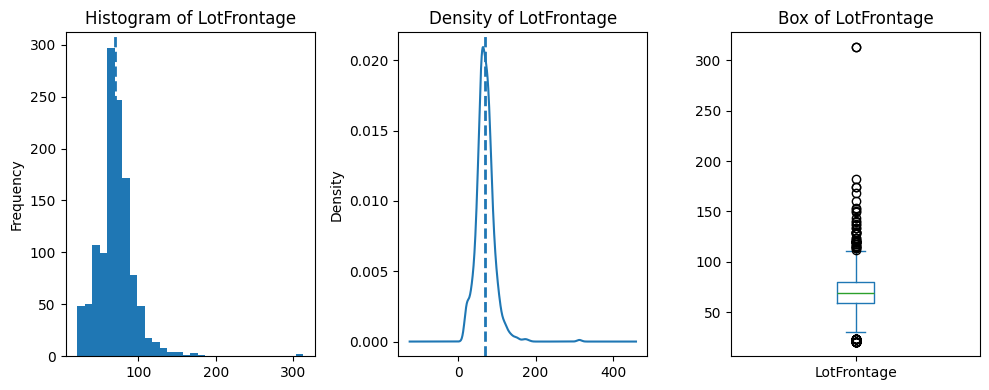

mean: 70.04995836802665
median: 69.0
skewness: 2.1635691423248837


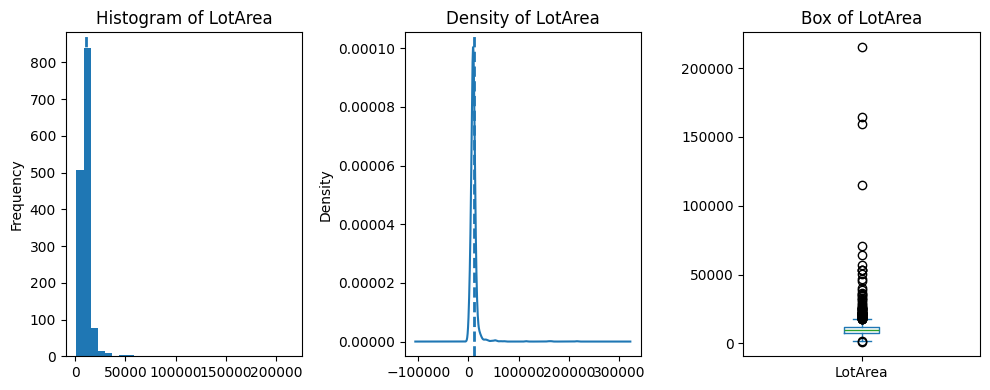

mean: 10516.828082191782
median: 9478.5
skewness: 12.207687851233496


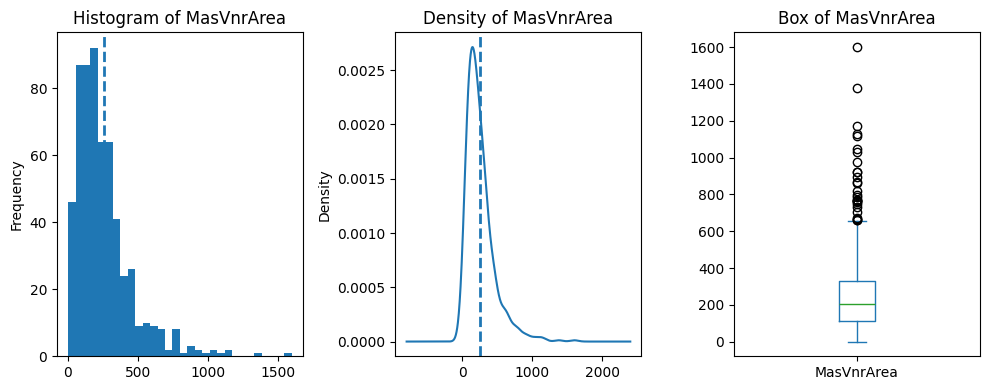

mean: 254.7394247038917
median: 203.0
skewness: 2.0938768726866663


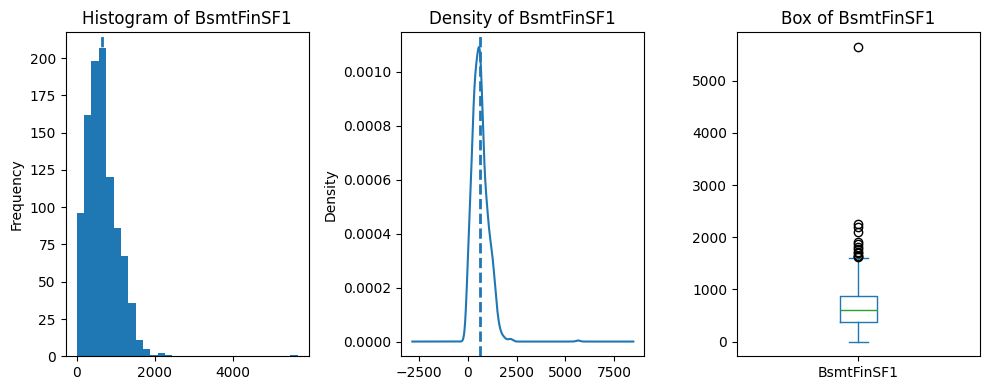

mean: 652.2799597180261
median: 604.0
skewness: 2.3022746068878592


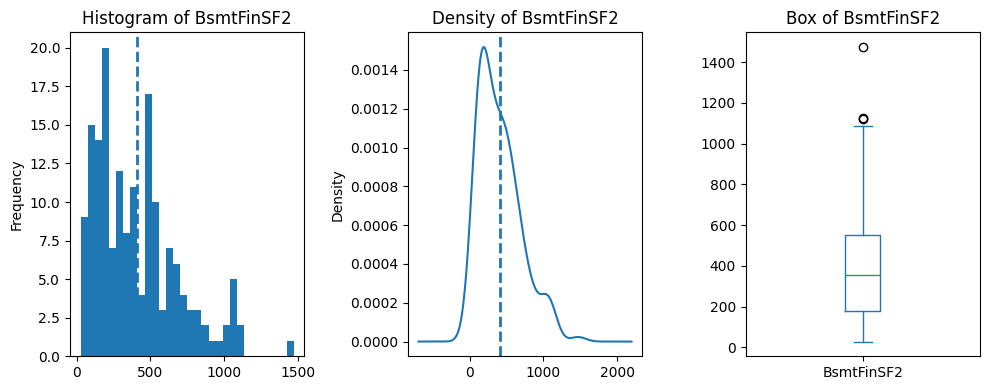

mean: 406.9580838323353
median: 354.0
skewness: 0.9942372017307054


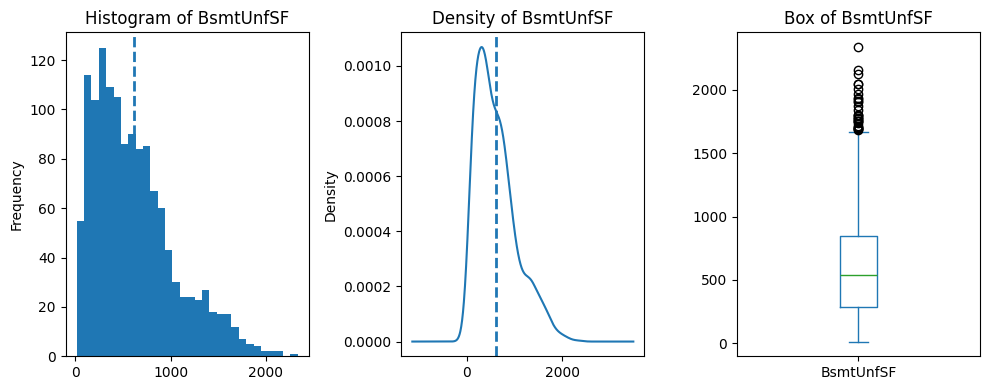

mean: 617.1169895678092
median: 536.0
skewness: 0.9706776979600801


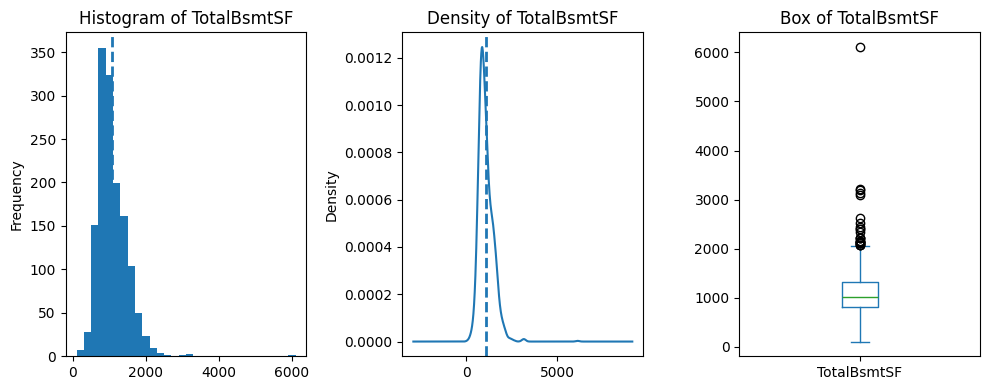

mean: 1084.924104005622
median: 1004.0
skewness: 2.1711204176822894


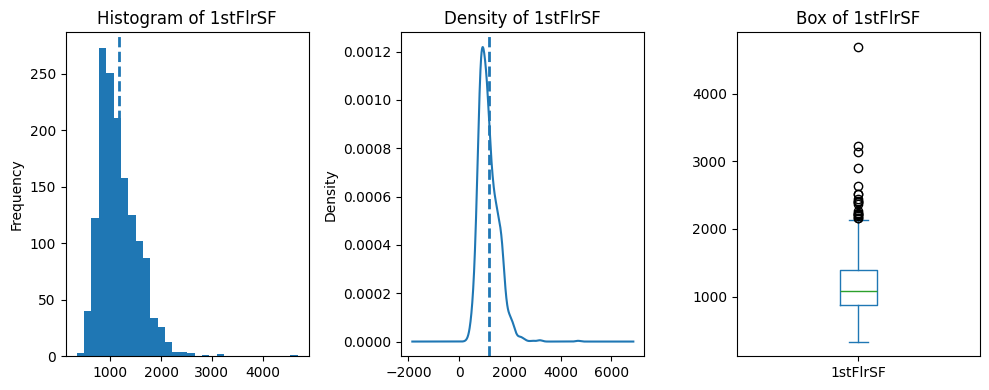

mean: 1162.626712328767
median: 1087.0
skewness: 1.3767566220336365


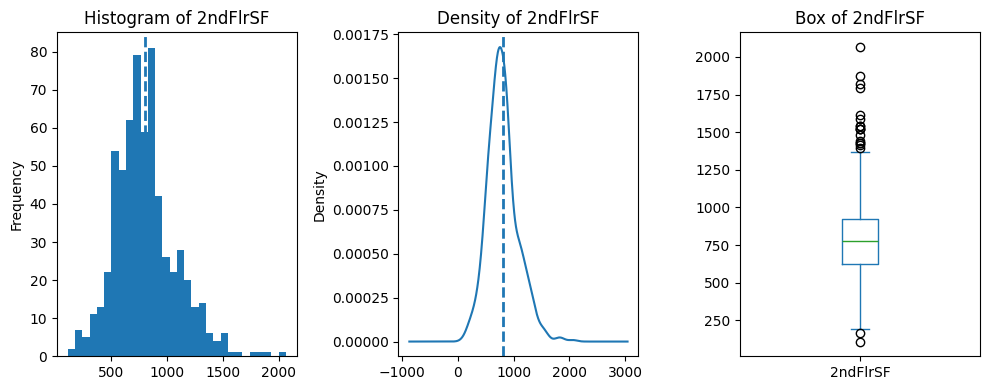

mean: 802.8668779714739
median: 776.0
skewness: 0.7027748433178629


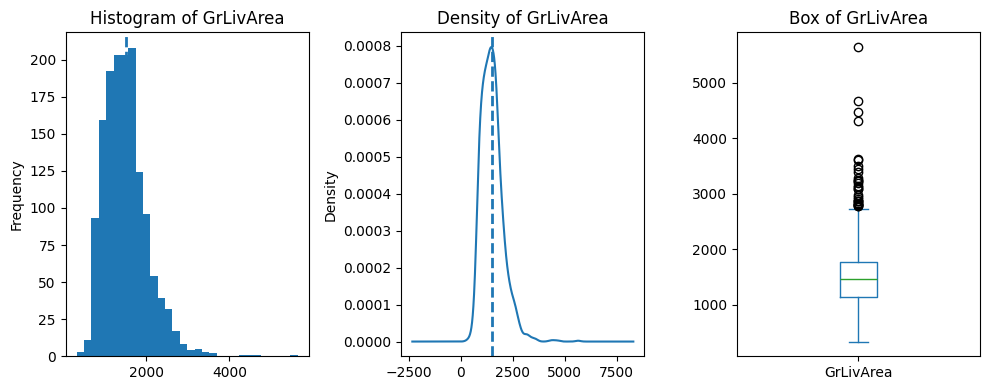

mean: 1515.463698630137
median: 1464.0
skewness: 1.3665603560164552


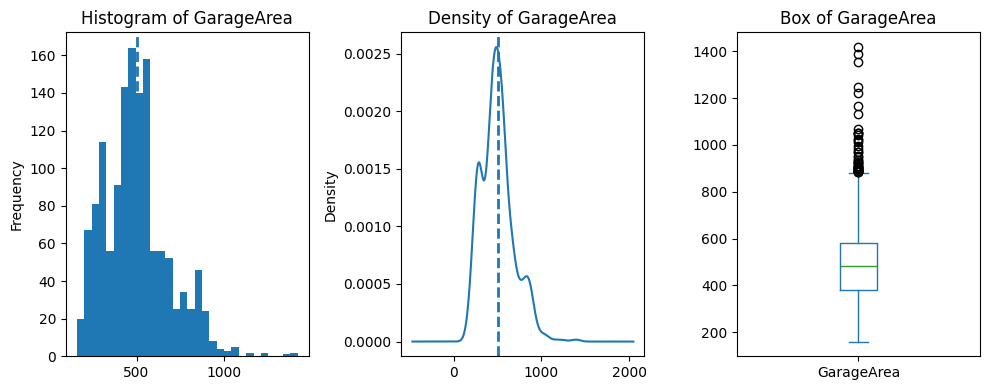

mean: 500.76214648295866
median: 484.0
skewness: 0.8110368967447983


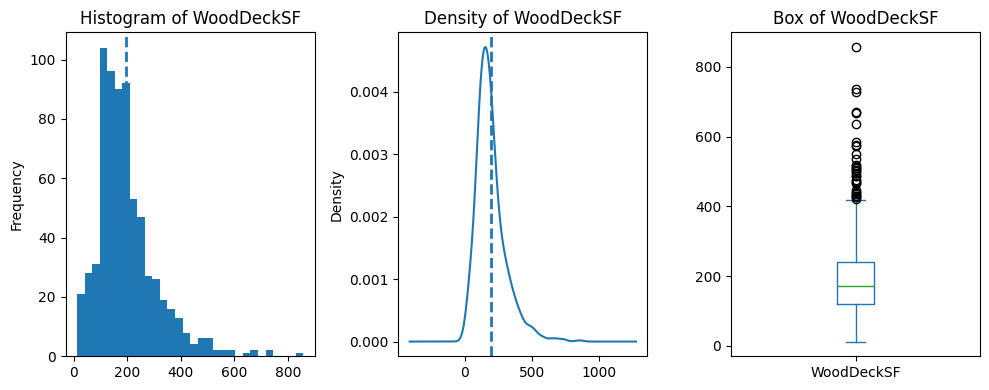

mean: 196.8483547925608
median: 171.0
skewness: 1.617617303859855


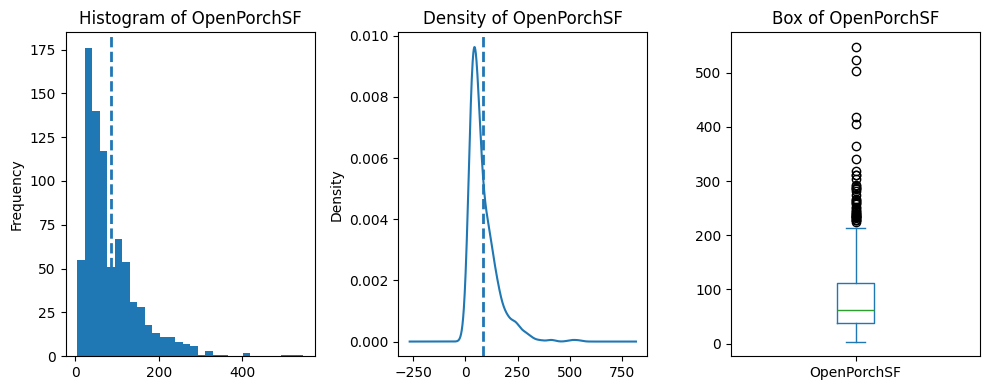

mean: 84.73134328358209
median: 63.0
skewness: 2.248550432828478


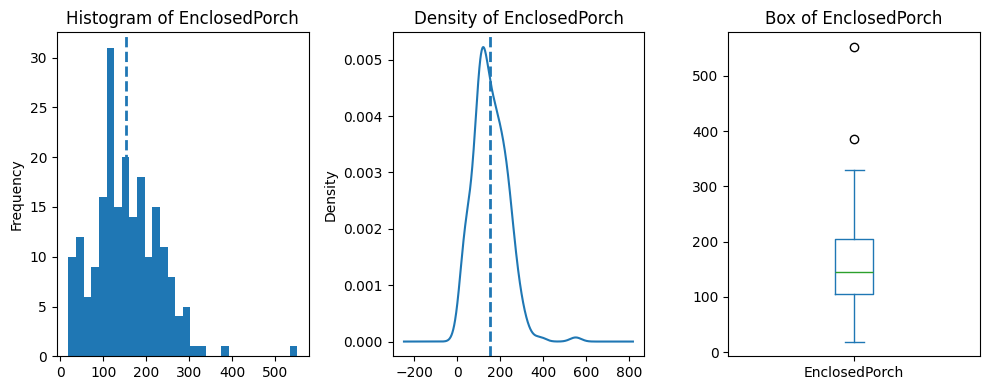

mean: 154.10096153846155
median: 144.5
skewness: 0.864540844780346


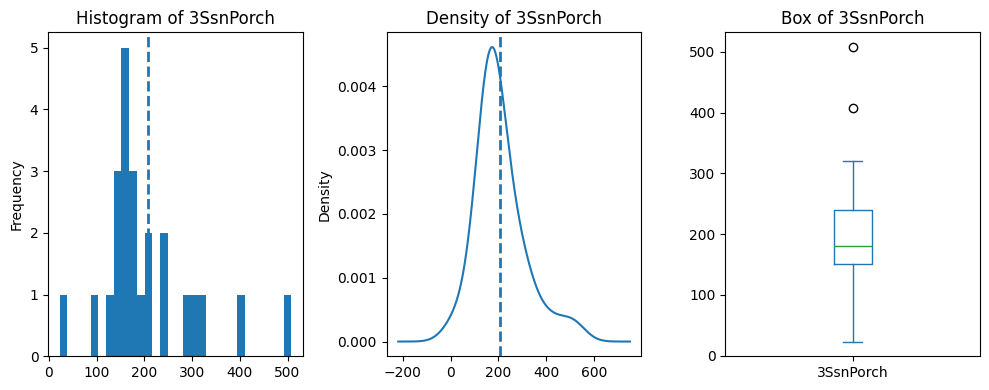

mean: 207.41666666666666
median: 180.0
skewness: 1.2870775372725796


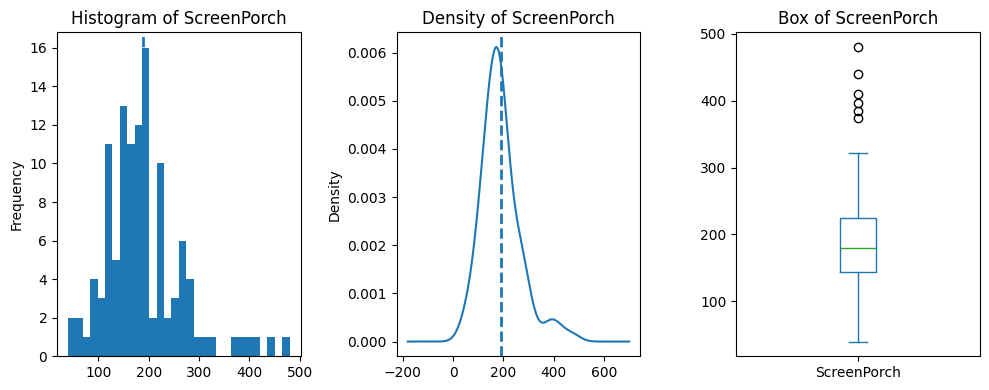

mean: 189.56034482758622
median: 180.0
skewness: 1.186468489847003


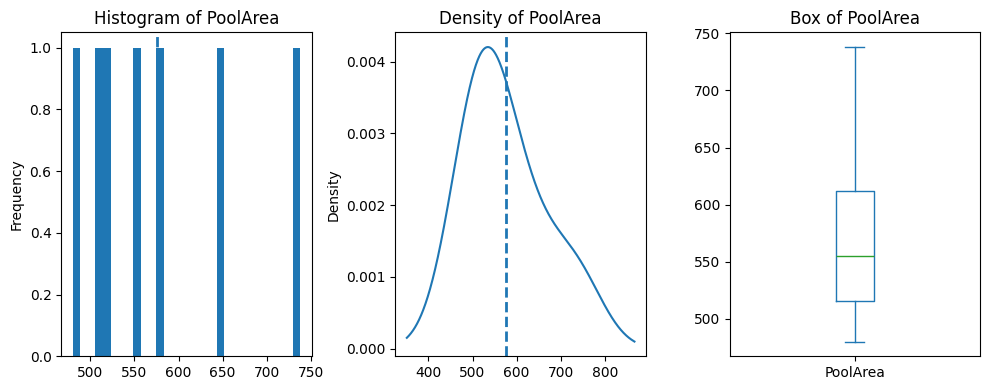

mean: 575.4285714285714
median: 555.0
skewness: 1.0832693410669414


In [45]:
# Separate feature
num_cols = df.select_dtypes(include=['number']).columns
cat_cols = df.select_dtypes(include=['object']).columns
skew_cols=[]
to_check_skew=[]

#visualisations
for col in categorized_cols['continuous_area_cols']:
    if col == 'SalePrice':
        continue  # skip target if needed
    plt_df=df[col]
    if col in categorized_cols['continuous_area_cols']:
        plt_df=df[df[col] > 0][col]
    skew_val=plt_df.skew()
    if skew_val>1.5: transformations['Skew'].append(col)
    elif skew_val>0.5 or skew_val<-0.3: to_check_skew.append(col)
    bins = min(50, max(10, int(np.sqrt(len(df[col])))))
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4))  # Fixed size
    plt_df.plot(kind='hist', bins=30, ax=axes[0], title=f'Histogram of {col}')
    mean_val = plt_df.mean()
    axes[0].axvline(mean_val, linestyle='--', linewidth=2)
    plt_df.plot(kind='kde', ax=axes[1], title=f'Density of {col}')
    axes[1].axvline(mean_val, linestyle='--', linewidth=2)
    plt_df.plot(kind='box', ax=axes[2], title=f'Box of {col}')
    plt.tight_layout()
    plt.show()
    print("mean:",mean_val)
    print("median:",plt_df.median())
    print("skewness:",skew_val)

In [46]:
to_check_outliers={}
rows_to_drop=set()
to_check_null={}

#visualisations
for col in num_cols:
    if col == 'SalePrice':
        continue  # skip target if needed
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    num_outliers = len(outliers)
    pct_outliers = (num_outliers / len(df)) * 100
    if num_outliers<10 and pct_outliers<1: rows_to_drop.update(outliers.index)
    elif num_outliers>50 and pct_outliers>3: to_check_outliers[col]=[lower_bound,upper_bound]
    if df[col].isnull().sum()<10: rows_to_drop.update(df[df[col].isnull()].index)
    elif df[col].isnull().sum(): to_check_null[col]=set(df[col].isnull().index)
    
    print(f"\nColumn: {col}")
    print(f"Number of outliers: {num_outliers} ({pct_outliers:.2f}%)")
    print("mean:",mean_val)
    print("median:",df[col].median())
    print("skewness:",skew_val)
    print("null:",df[col].isnull().sum())
    print("zeros:",sum(df[col]==0))


Column: MSSubClass
Number of outliers: 103 (7.05%)
mean: 575.4285714285714
median: 50.0
skewness: 1.0832693410669414
null: 0
zeros: 0

Column: LotFrontage
Number of outliers: 88 (6.03%)
mean: 575.4285714285714
median: 69.0
skewness: 1.0832693410669414
null: 259
zeros: 0

Column: LotArea
Number of outliers: 69 (4.73%)
mean: 575.4285714285714
median: 9478.5
skewness: 1.0832693410669414
null: 0
zeros: 0

Column: OverallQual
Number of outliers: 2 (0.14%)
mean: 575.4285714285714
median: 6.0
skewness: 1.0832693410669414
null: 0
zeros: 0

Column: OverallCond
Number of outliers: 125 (8.56%)
mean: 575.4285714285714
median: 5.0
skewness: 1.0832693410669414
null: 0
zeros: 0

Column: YearBuilt
Number of outliers: 7 (0.48%)
mean: 575.4285714285714
median: 1973.0
skewness: 1.0832693410669414
null: 0
zeros: 0

Column: YearRemodAdd
Number of outliers: 0 (0.00%)
mean: 575.4285714285714
median: 1994.0
skewness: 1.0832693410669414
null: 0
zeros: 0

Column: MasVnrArea
Number of outliers: 96 (6.58%)
mean:

In [47]:
#high no of zeros -> candidate for has_cols PoolArea,MiscVal

In [48]:
transformations['Skew']

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'WoodDeckSF',
 'OpenPorchSF']

In [49]:
to_check_null.keys()

dict_keys(['LotFrontage', 'GarageYrBlt'])

In [50]:
#lot of nulls in 'LotFrontage' acc to to_check_null
df['LotFrontage']=df['LotFrontage'].fillna(0)

In [51]:
# df = df.drop(index=rows_to_drop).reset_index(drop=True)

In [52]:
len(num_cols)

36

In [53]:
to_check_skew

['BsmtFinSF2',
 'BsmtUnfSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'GarageArea',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea']

In [54]:
#First three cols in to_check seem to be skewed
final_skew_cols=transformations['Skew']+to_check_skew
transformations['Skew'] = [col for col in final_skew_cols 
                   if col not in categorized_cols['discrete_num_cols']
                   and col not in ['1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageArea']]

In [55]:
len(transformations['Skew'])

13

In [56]:
df.shape

(1460, 64)

In [57]:
to_check_outliers

{'MSSubClass': [np.float64(-55.0), np.float64(145.0)],
 'LotFrontage': [np.float64(27.5), np.float64(111.5)],
 'LotArea': [np.float64(1481.5), np.float64(17673.5)],
 'OverallCond': [np.float64(3.5), np.float64(7.5)],
 'MasVnrArea': [np.float64(-249.0), np.float64(415.0)],
 'BsmtFinSF2': [np.float64(0.0), np.float64(0.0)],
 'TotalBsmtSF': [np.float64(42.0), np.float64(2052.0)],
 'BsmtHalfBath': [np.float64(0.0), np.float64(0.0)],
 'OpenPorchSF': [np.float64(-102.0), np.float64(170.0)],
 'EnclosedPorch': [np.float64(0.0), np.float64(0.0)],
 'ScreenPorch': [np.float64(0.0), np.float64(0.0)],
 'MiscVal': [np.float64(0.0), np.float64(0.0)]}

In [58]:
# column=input()
# lower_bound,upper_bound=to_check_outliers[column][0],to_check_outliers[column][1]
# outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
# outliers


Column: MSZoning | Unique categories: 5 | Missing: 0


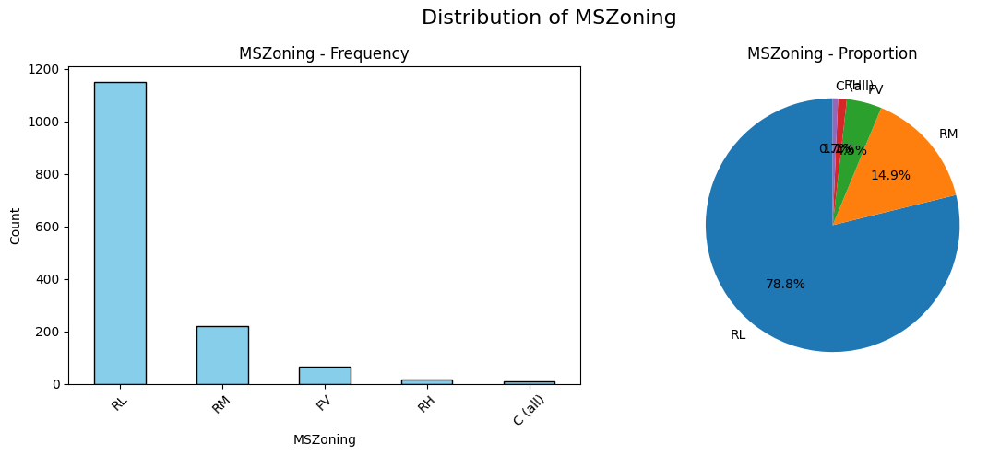


Value Counts:
MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64

Column: LotShape | Unique categories: 4 | Missing: 0


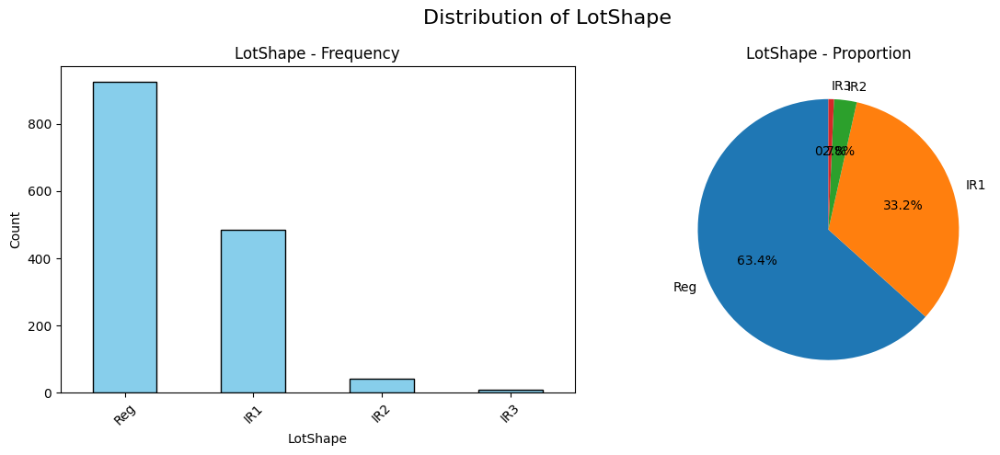


Value Counts:
LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64

Column: LandContour | Unique categories: 4 | Missing: 0


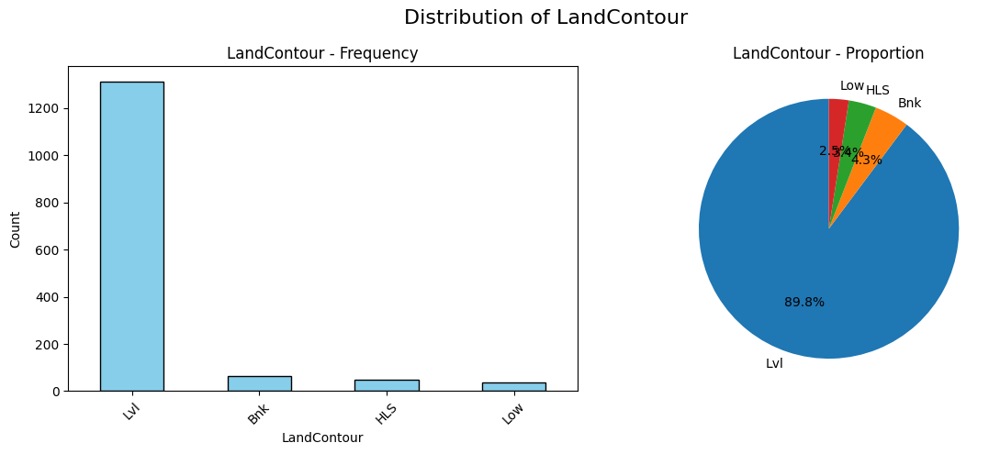


Value Counts:
LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: count, dtype: int64

Column: LotConfig | Unique categories: 5 | Missing: 0


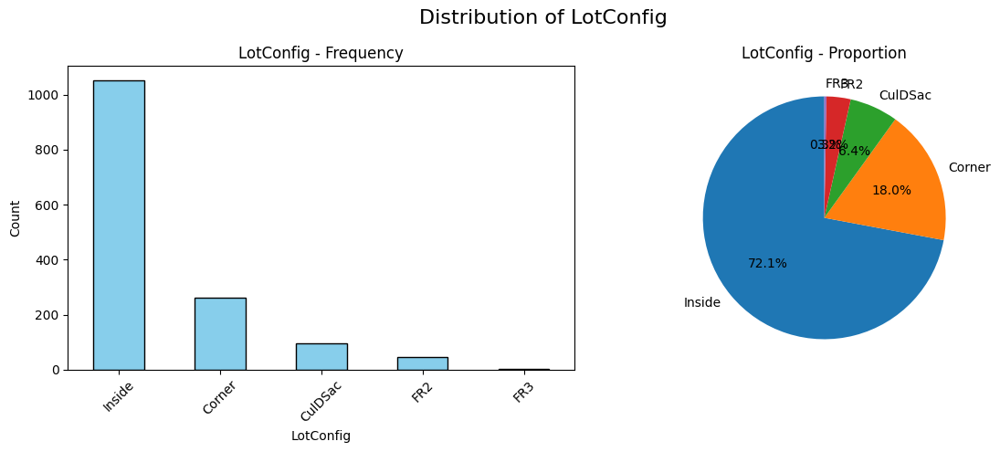


Value Counts:
LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: count, dtype: int64

Column: Neighborhood | Unique categories: 25 | Missing: 0
   → Too many categories for clear visualization. Skipping plots.

Column: Condition1 | Unique categories: 9 | Missing: 0


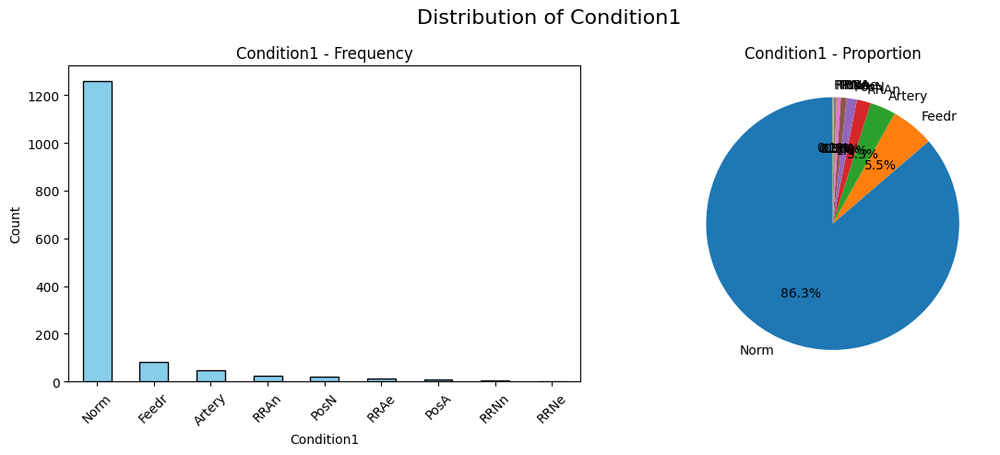


Value Counts:
Condition1
Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: count, dtype: int64

Column: BldgType | Unique categories: 5 | Missing: 0


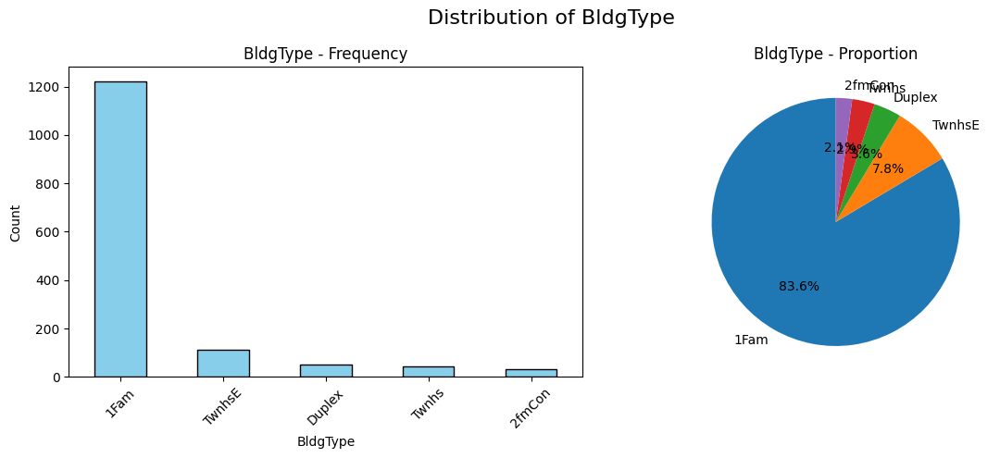


Value Counts:
BldgType
1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: count, dtype: int64

Column: HouseStyle | Unique categories: 8 | Missing: 0


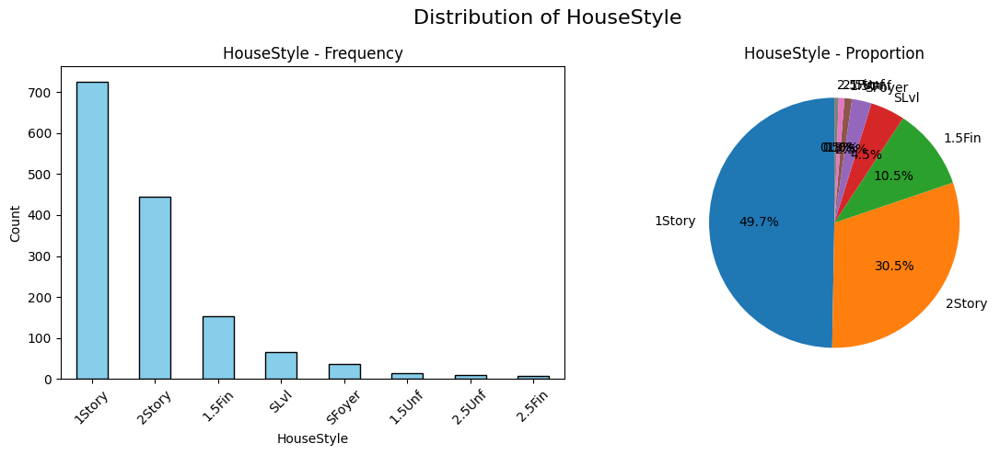


Value Counts:
HouseStyle
1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: count, dtype: int64

Column: RoofStyle | Unique categories: 6 | Missing: 0


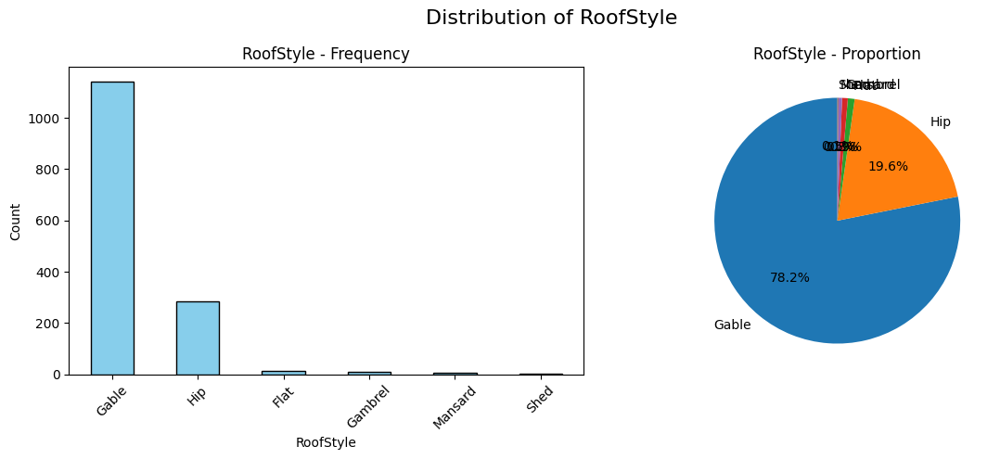


Value Counts:
RoofStyle
Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: count, dtype: int64

Column: Exterior1st | Unique categories: 15 | Missing: 0


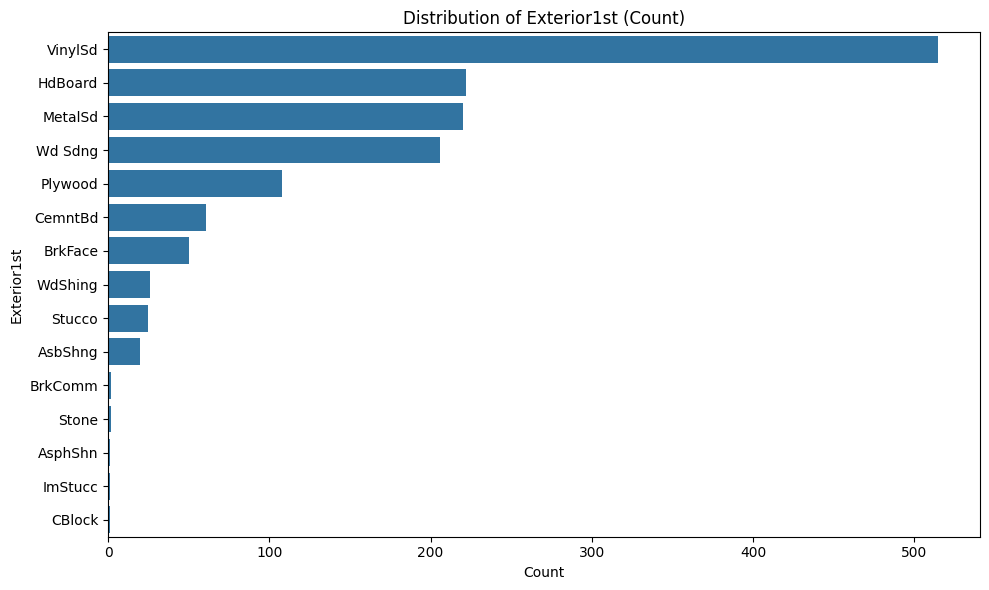


Value Counts:
Exterior1st
VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
AsphShn      1
ImStucc      1
CBlock       1
Name: count, dtype: int64

Column: Exterior2nd | Unique categories: 16 | Missing: 0


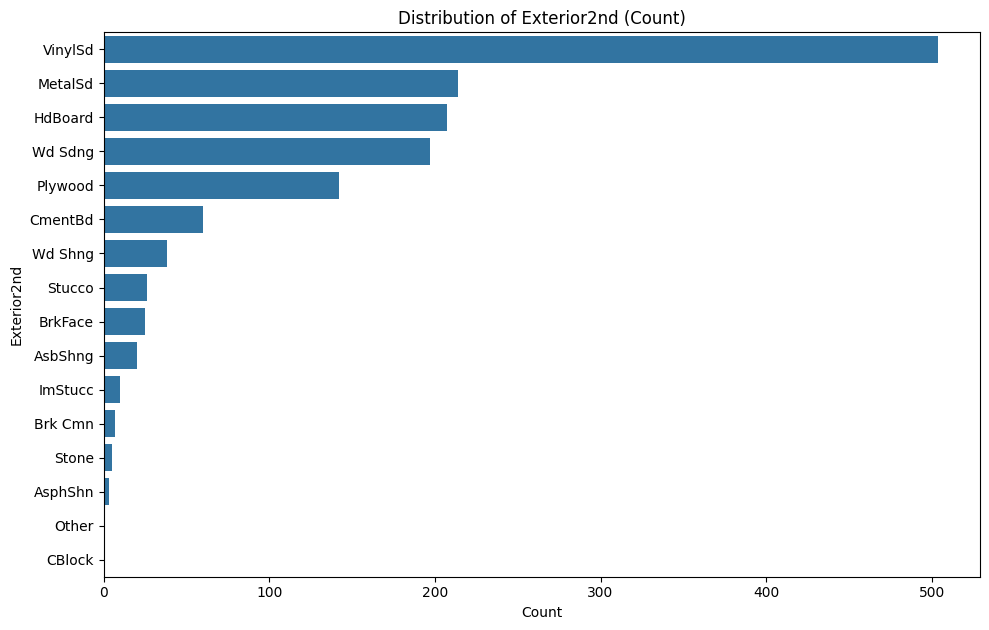


Value Counts:
Exterior2nd
VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
Other        1
CBlock       1
Name: count, dtype: int64

Column: MasVnrType | Unique categories: 3 | Missing: 872


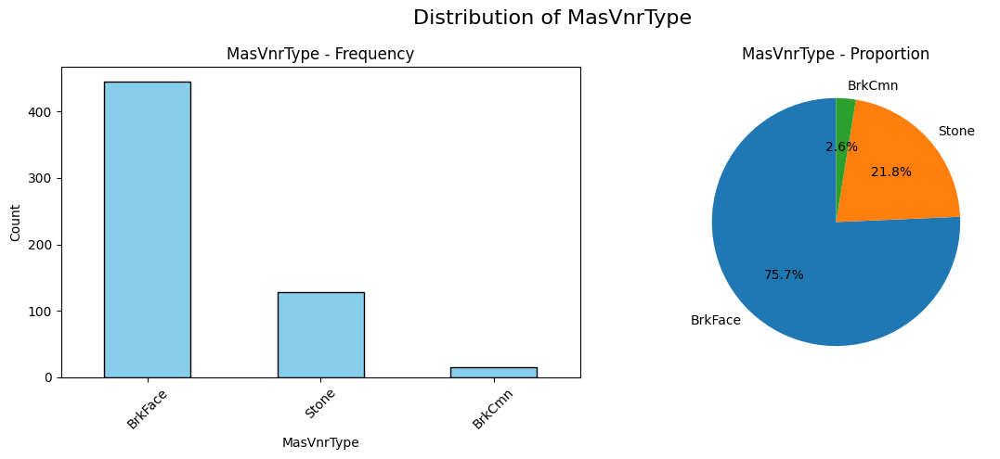


Value Counts:
MasVnrType
NaN        872
BrkFace    445
Stone      128
BrkCmn      15
Name: count, dtype: int64

Column: ExterQual | Unique categories: 4 | Missing: 0


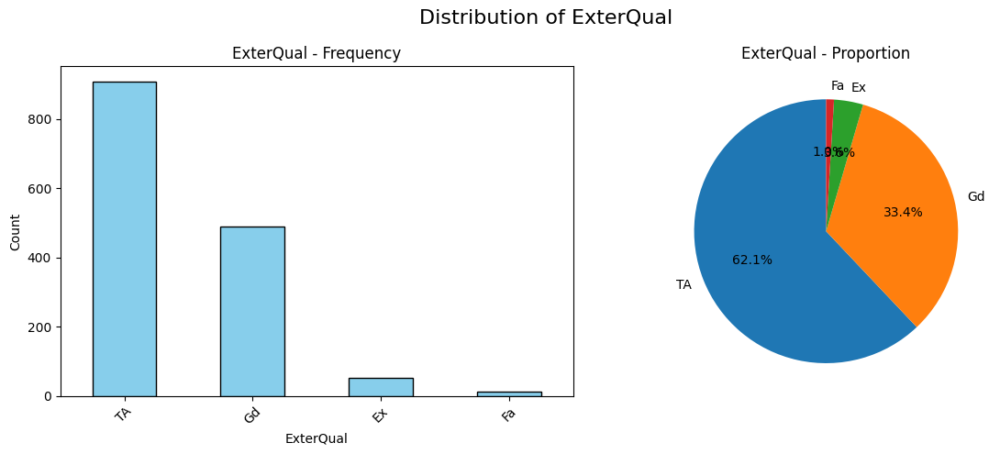


Value Counts:
ExterQual
TA    906
Gd    488
Ex     52
Fa     14
Name: count, dtype: int64

Column: ExterCond | Unique categories: 5 | Missing: 0


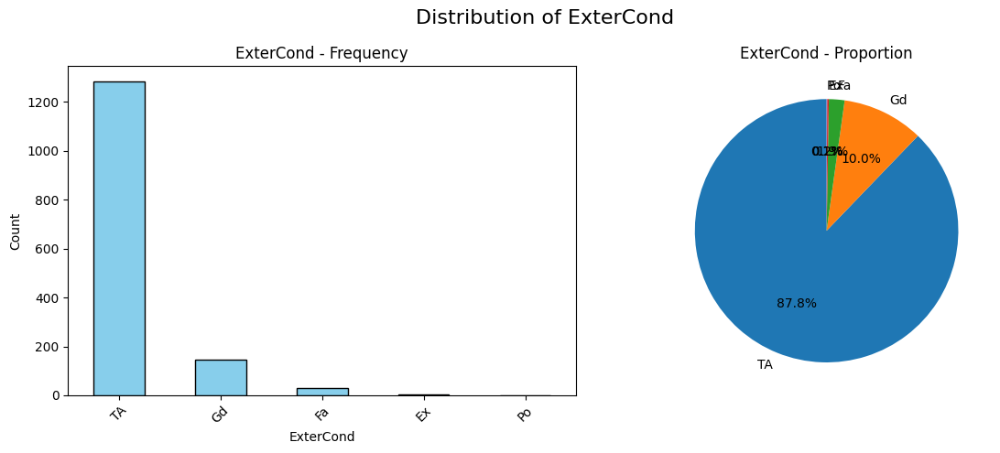


Value Counts:
ExterCond
TA    1282
Gd     146
Fa      28
Ex       3
Po       1
Name: count, dtype: int64

Column: Foundation | Unique categories: 6 | Missing: 0


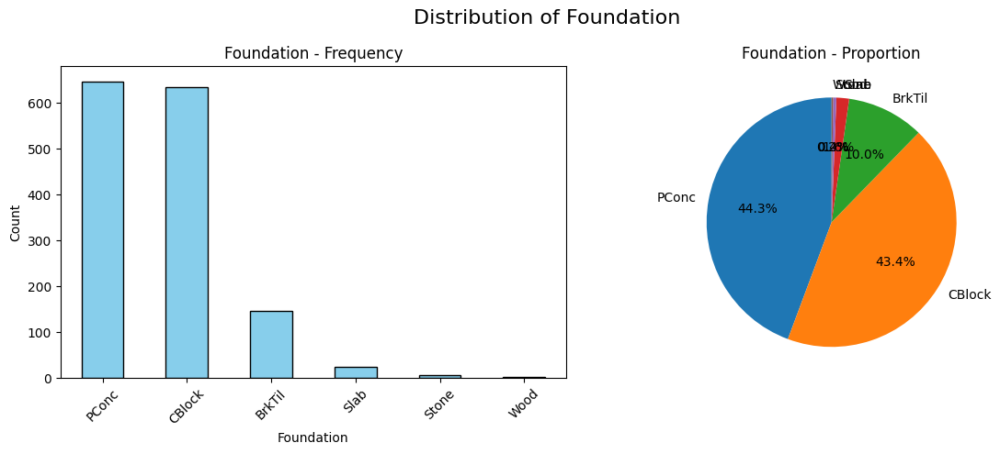


Value Counts:
Foundation
PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: count, dtype: int64

Column: BsmtQual | Unique categories: 4 | Missing: 37


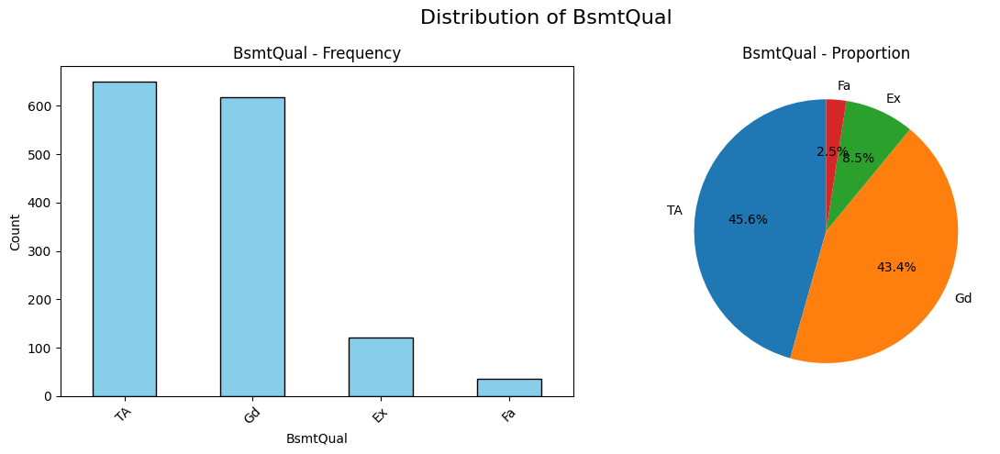


Value Counts:
BsmtQual
TA     649
Gd     618
Ex     121
NaN     37
Fa      35
Name: count, dtype: int64

Column: BsmtCond | Unique categories: 4 | Missing: 37


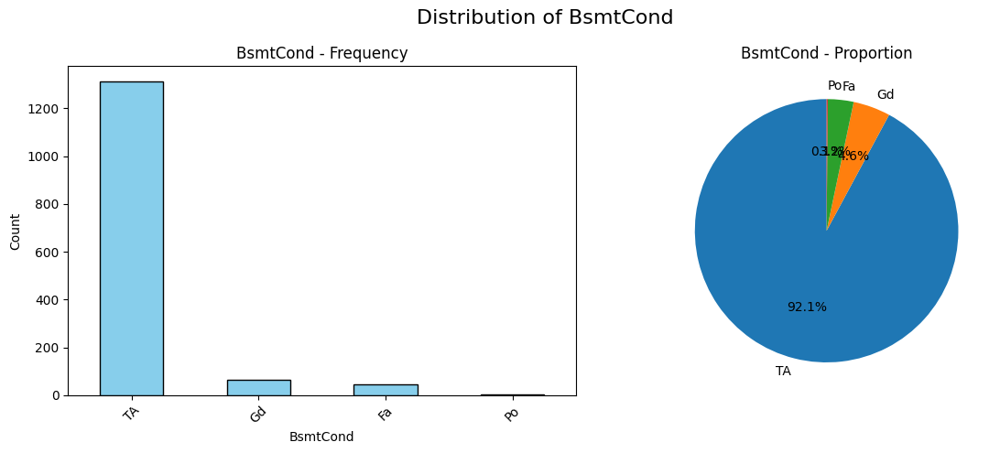


Value Counts:
BsmtCond
TA     1311
Gd       65
Fa       45
NaN      37
Po        2
Name: count, dtype: int64

Column: BsmtExposure | Unique categories: 4 | Missing: 38


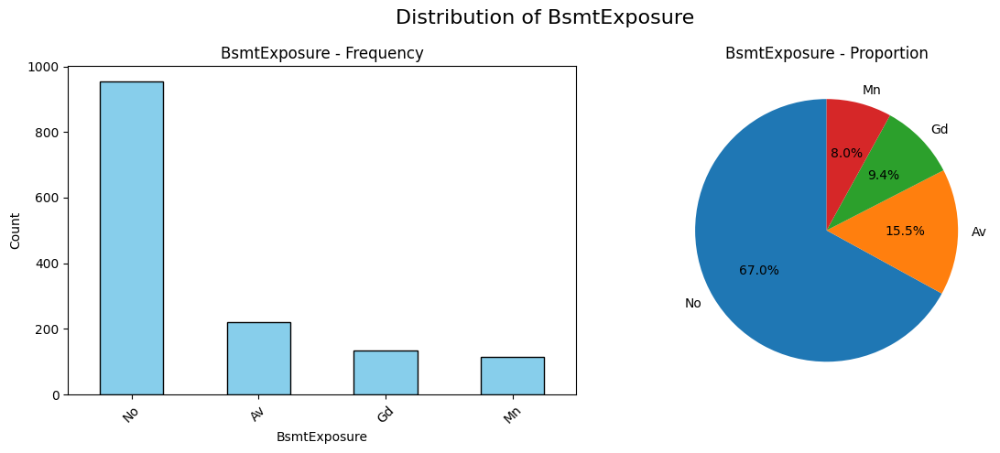


Value Counts:
BsmtExposure
No     953
Av     221
Gd     134
Mn     114
NaN     38
Name: count, dtype: int64

Column: BsmtFinType1 | Unique categories: 6 | Missing: 37


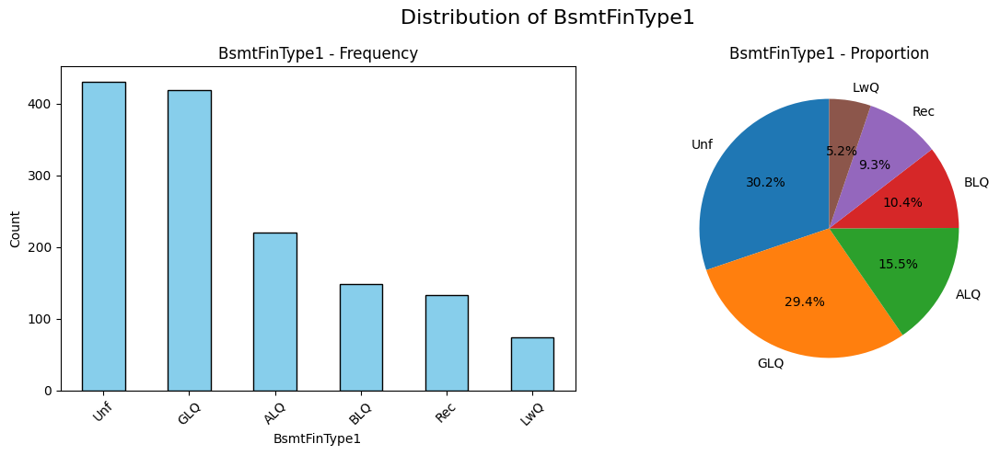


Value Counts:
BsmtFinType1
Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
NaN     37
Name: count, dtype: int64

Column: BsmtFinType2 | Unique categories: 6 | Missing: 38


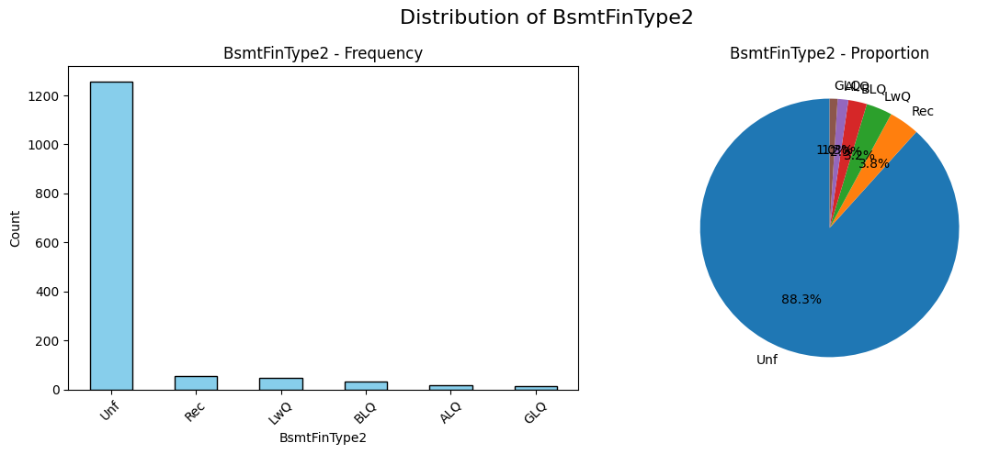


Value Counts:
BsmtFinType2
Unf    1256
Rec      54
LwQ      46
NaN      38
BLQ      33
ALQ      19
GLQ      14
Name: count, dtype: int64

Column: HeatingQC | Unique categories: 5 | Missing: 0


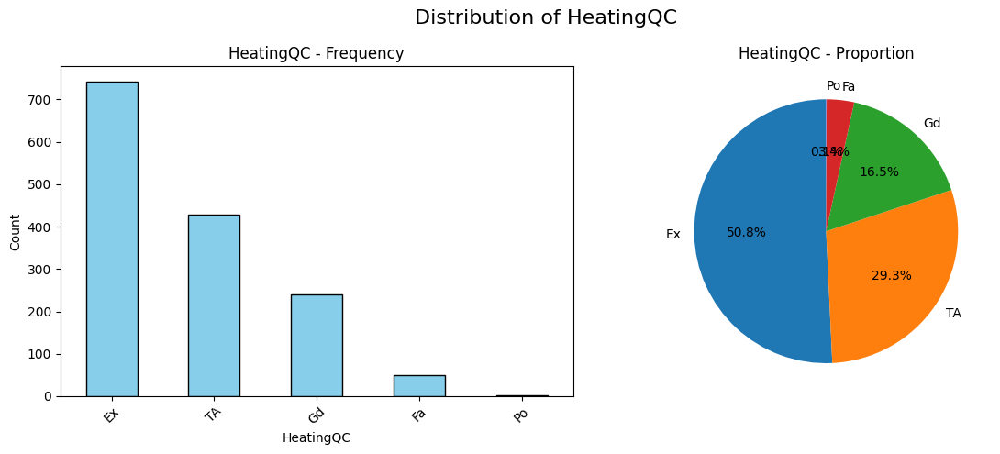


Value Counts:
HeatingQC
Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: count, dtype: int64

Column: KitchenQual | Unique categories: 4 | Missing: 0


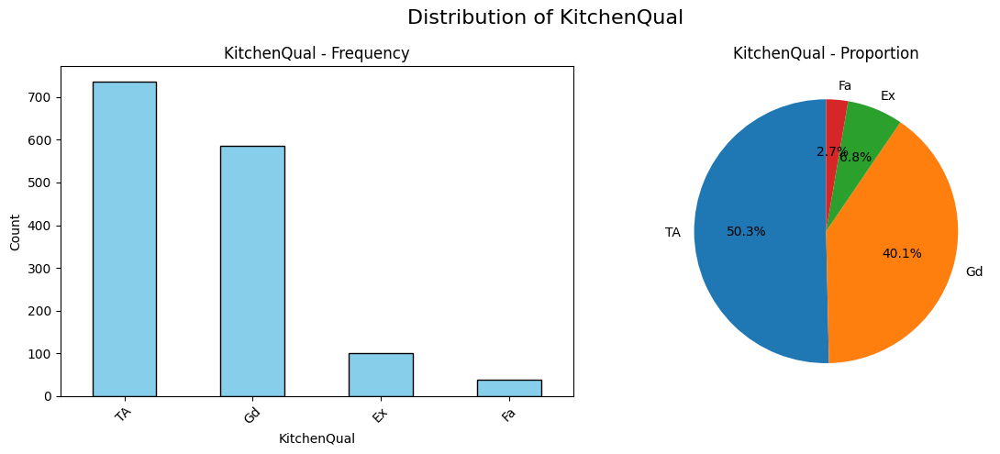


Value Counts:
KitchenQual
TA    735
Gd    586
Ex    100
Fa     39
Name: count, dtype: int64

Column: FireplaceQu | Unique categories: 5 | Missing: 690


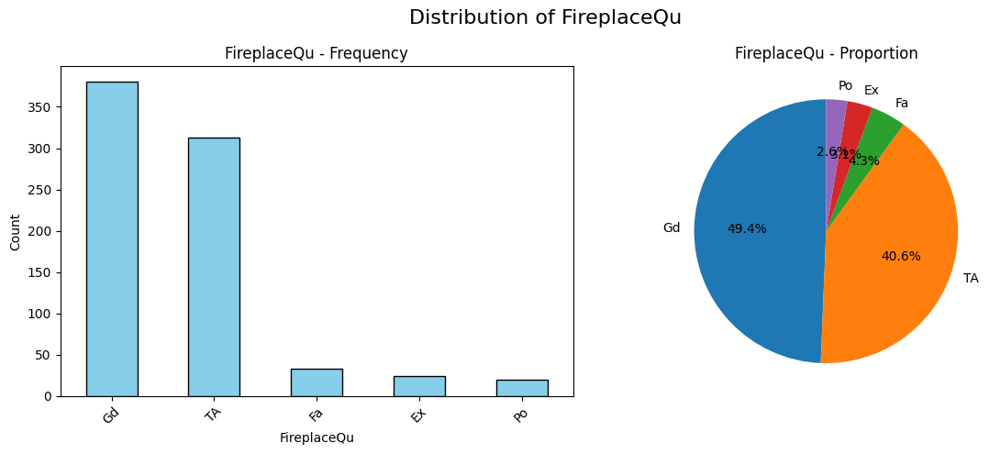


Value Counts:
FireplaceQu
NaN    690
Gd     380
TA     313
Fa      33
Ex      24
Po      20
Name: count, dtype: int64

Column: GarageType | Unique categories: 6 | Missing: 81


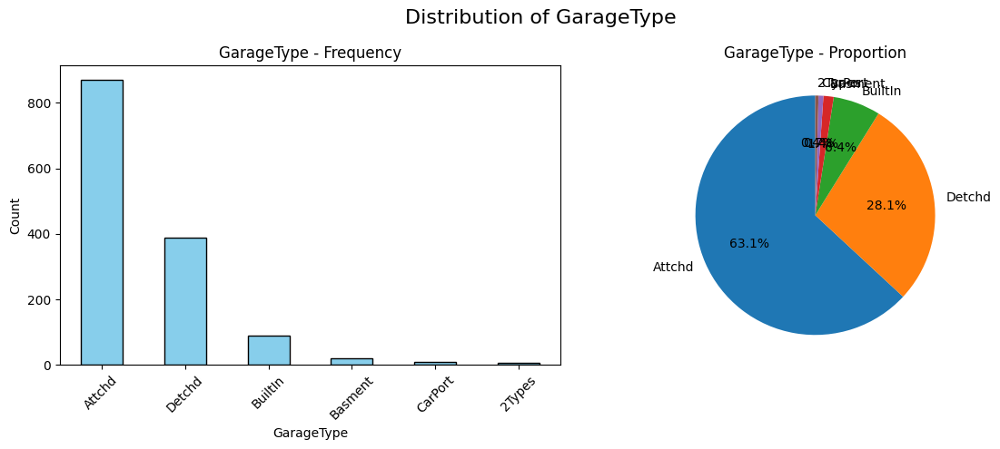


Value Counts:
GarageType
Attchd     870
Detchd     387
BuiltIn     88
NaN         81
Basment     19
CarPort      9
2Types       6
Name: count, dtype: int64

Column: GarageFinish | Unique categories: 3 | Missing: 81


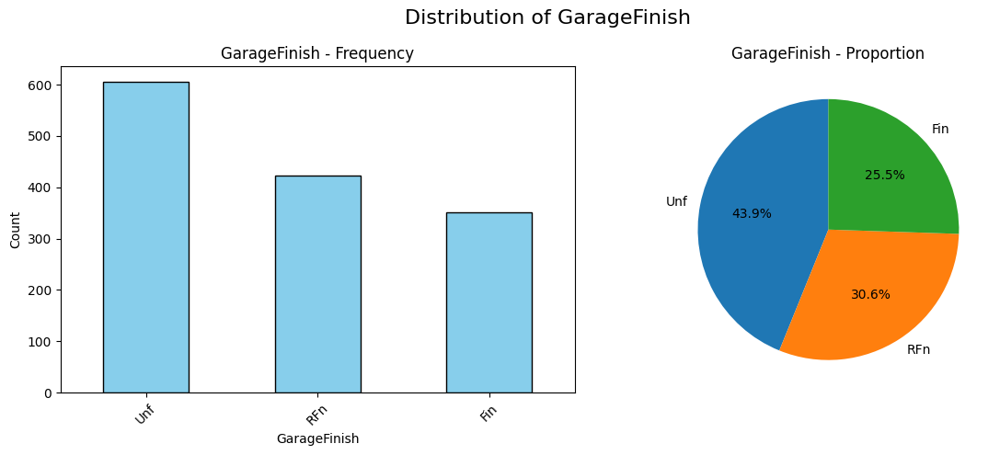


Value Counts:
GarageFinish
Unf    605
RFn    422
Fin    352
NaN     81
Name: count, dtype: int64

Column: GarageQual | Unique categories: 5 | Missing: 81


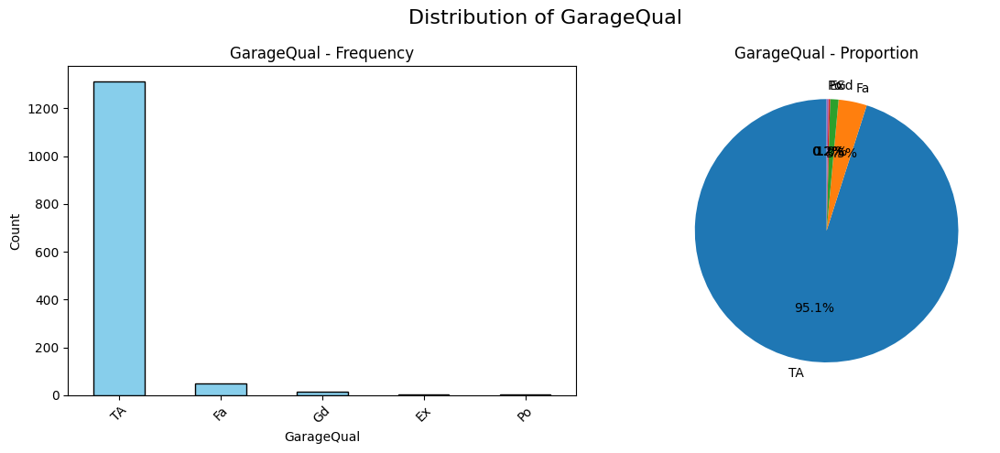


Value Counts:
GarageQual
TA     1311
NaN      81
Fa       48
Gd       14
Ex        3
Po        3
Name: count, dtype: int64

Column: SaleType | Unique categories: 9 | Missing: 0


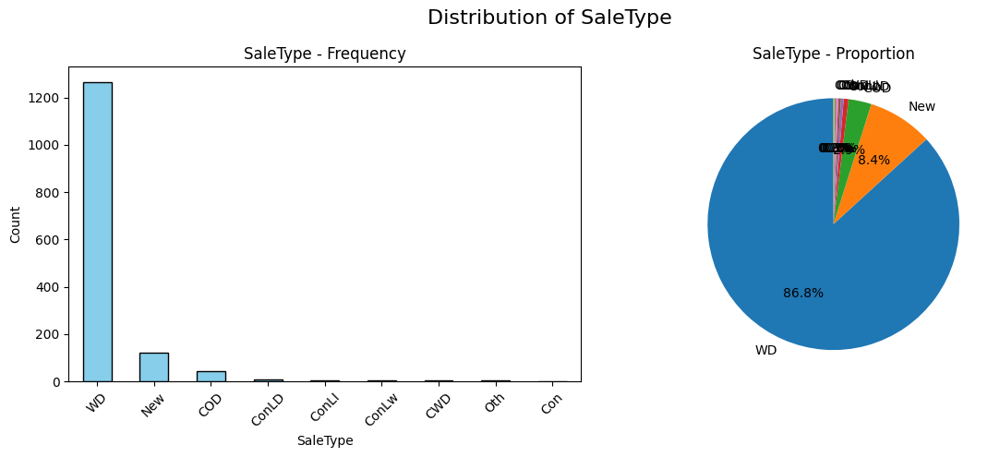


Value Counts:
SaleType
WD       1267
New       122
COD        43
ConLD       9
ConLI       5
ConLw       5
CWD         4
Oth         3
Con         2
Name: count, dtype: int64

Column: SaleCondition | Unique categories: 6 | Missing: 0


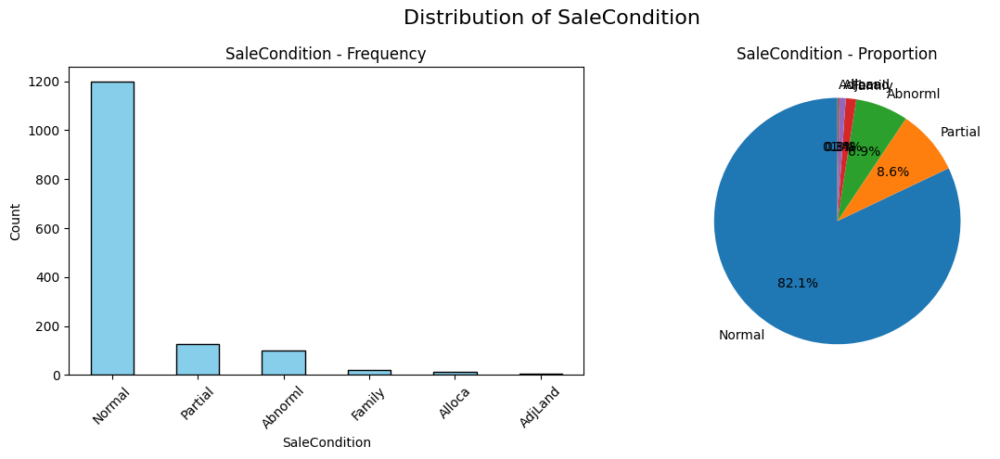


Value Counts:
SaleCondition
Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: count, dtype: int64


In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
cat_cols_null_many=[]
cat_cols_null=[]

for col in cat_cols:
    unique_count = df[col].nunique()
    print(f"\n{'='*60}")
    print(f"Column: {col} | Unique categories: {unique_count} | Missing: {df[col].isnull().sum()}")
    
    # Decide layout based on number of categories
    if unique_count > 20:
        print("   → Too many categories for clear visualization. Skipping plots.")
        continue
    elif unique_count > 10:
        # Only bar plot (horizontal for better readability)
        fig, ax = plt.subplots(1, 1, figsize=(10, max(6, unique_count * 0.4)))
        sns.countplot(data=df, y=col, order=df[col].value_counts().index, ax=ax)
        ax.set_title(f'Distribution of {col} (Count)')
        ax.set_xlabel('Count')
        plt.tight_layout()
        plt.show()
    else:
        # Bar + Pie side by side for few categories
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        
        # Bar plot
        df[col].value_counts().plot(kind='bar', ax=axes[0], color='skyblue', edgecolor='black')
        axes[0].set_title(f'{col} - Frequency')
        axes[0].set_ylabel('Count')
        axes[0].tick_params(axis='x', rotation=45)
        
        # Pie chart
        df[col].value_counts().plot(kind='pie', ax=axes[1], autopct='%1.1f%%', startangle=90)
        axes[1].set_title(f'{col} - Proportion')
        axes[1].set_ylabel('')  # Remove default ylabel
        
        plt.suptitle(f'Distribution of {col}', fontsize=16)
        plt.tight_layout()
        plt.show()
    if df[col].isnull().sum()>20: cat_cols_null_many.append(col)
    elif df[col].isnull().sum(): cat_cols_null.append(col)
    # Always show value counts numerically
    print("\nValue Counts:")
    print(df[col].value_counts(dropna=False))

In [60]:
cat_cols_null_many

['MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual']

In [61]:
cat_cols_null

[]

In [62]:
col=input()
disp=df[col].isnull()
print(disp.sum())
df[disp]

 GarageQual


81


,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
39,90,RL,65.0,6040,Reg,Lvl,Inside,Edwards,Norm,Duplex,1Story,4,5,1955,1955,Gable,AsbShng,Plywood,NaN,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,TA,1152,0,0,1152,0,0,2,0,2,Fa,6,0,NaN,NaN,NaN,NaN,0,0,NaN,0,0,0,0,0,0,0,6,2008,WD,AdjLand,82000
48,190,RM,33.0,4456,Reg,Lvl,Inside,OldTown,Norm,2fmCon,2Story,4,5,1920,2008,Gable,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,736,736,Gd,736,716,0,1452,0,0,2,0,2,TA,8,0,NaN,NaN,NaN,NaN,0,0,NaN,0,0,102,0,0,0,0,6,2009,New,Partial,113000
78,90,RL,72.0,10778,Reg,Lvl,Inside,Sawyer,Norm,Duplex,1Story,4,5,1968,1968,Hip,HdBoard,HdBoard,NaN,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,TA,1768,0,0,1768,0,0,2,0,4,TA,8,0,NaN,NaN,NaN,NaN,0,0,NaN,0,0,0,0,0,0,0,4,2010,WD,Normal,136500
88,50,C (all),105.0,8470,IR1,Lvl,Corner,IDOTRR,Feedr,1Fam,1.5Fin,3,2,1915,1982,Hip,Plywood,Plywood,NaN,0.0,Fa,Fa,CBlock,TA,Fa,No,Unf,0,Unf,0,1013,1013,TA,1013,0,513,1526,0,0,1,0,2,Fa,6,0,NaN,NaN,NaN,NaN,0,0,NaN,0,0,156,0,0,0,0,10,2009,ConLD,Abnorml,85000
89,20,RL,60.0,8070,Reg,Lvl,Inside,CollgCr,Norm,1Fam,1Story,4,5,1994,1995,Gable,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,588,Unf,0,402,990,Ex,990,0,0,990,1,0,1,0,3,TA,5,0,NaN,NaN,NaN,NaN,0,0,NaN,0,0,0,0,0,0,0,8,2007,WD,Normal,123600
99,20,RL,77.0,9320,IR1,Lvl,Inside,NAmes,Norm,1Fam,1Story,4,5,1959,1959,Gable,Plywood,Plywood,NaN,0.0,TA,TA,CBlock,TA,TA,No,ALQ,569,Unf,0,381,950,Fa,1225,0,0,1225,1,0,1,1,3,TA,6,0,NaN,NaN,NaN,NaN,0,0,NaN,352,0,0,0,0,0,400,1,2010,WD,Normal,128950
108,50,RM,85.0,8500,Reg,Lvl,Corner,IDOTRR,Artery,1Fam,1.5Fin,5,7,1919,2005,Gable,CemntBd,CmentBd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,793,793,TA,997,520,0,1517,0,0,2,0,3,Fa,7,0,NaN,NaN,NaN,NaN,0,0,NaN,0,0,144,0,0,0,0,8,2007,WD,Normal,115000
125,190,RM,60.0,6780,Reg,Lvl,Inside,IDOTRR,Norm,2fmCon,1.5Fin,6,8,1935,1982,Gable,Wd Sdng,Wd Sdng,NaN,0.0,TA,Fa,CBlock,TA,TA,Av,GLQ,490,Unf,0,30,520,Gd,520,0,234,754,1,0,1,0,2,TA,5,0,NaN,NaN,NaN,NaN,0,0,NaN,53,0,0,0,0,0,0,6,2006,WD,Normal,84500
127,45,RM,55.0,4388,IR1,Bnk,Inside,OldTown,Feedr,1Fam,1.5Unf,5,7,1930,1950,Gable,WdShing,Wd Sdng,NaN,0.0,TA,Gd,BrkTil,TA,TA,No,LwQ,116,Unf,0,556,672,Ex,840,0,0,840,0,0,1,0,3,TA,5,1,TA,NaN,NaN,NaN,0,0,NaN,0,0,0,0,0,0,0,6,2007,WD,Normal,87000
140,20,RL,70.0,10500,Reg,Lvl,FR2,NAmes,Norm,1Fam,1Story,4,5,1971,1971,Gable,HdBoard,HdBoard,NaN,0.0,TA,TA,CBlock,TA,TA,No,ALQ,432,Unf,0,432,864,TA,864,0,0,864,0,0,1,0,3,TA,5,1,Po,NaN,NaN,NaN,0,0,NaN,0,0,0,0,0,0,0,4,2010,ConLI,Normal,115000


In [63]:
#'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2', columns have abt  37 missing values at common rows, they have no basement
#and'GarageType','GarageFinish','GarageQual', columns have abt 77 missing values at common rows, they have no garage
# same 'NA' is used for 'MasVnrType' but 'None' in 'None' in 'FireplaceQu'
#'NA' could be used to fillna

In [64]:
for col in cat_cols_null_many:
    df[col] = df[col].fillna('NA')

In [65]:
for col in cat_cols_null:
    top_freq_val = df[col].value_counts(normalize=True, dropna=False).keys()[0]
    df[col] = df[col].fillna(top_freq_val)

In [66]:
df.shape

(1460, 64)

#Bivariate Analysis

In [67]:
for key in categorized_cols:
    for i,col in enumerate(categorized_cols[key]):
        if col not in df.columns:
            categorized_cols[key].pop(i)
for key in transformations:
    for i,col in enumerate(transformations[key]):
        if col not in df.columns:
            categorized_cols[key].pop(i)

In [68]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition',
       'SalePrice'],
      dtype

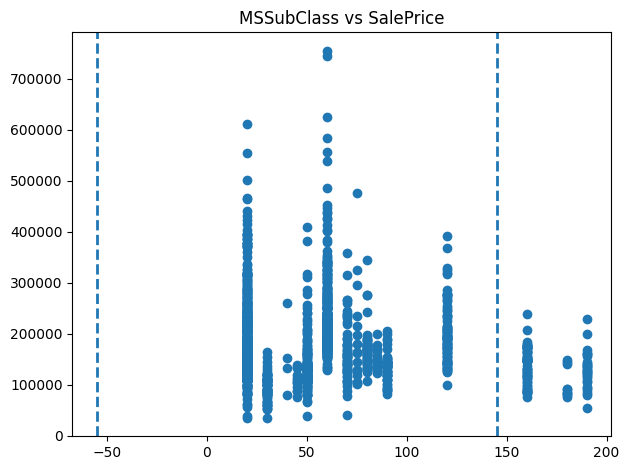

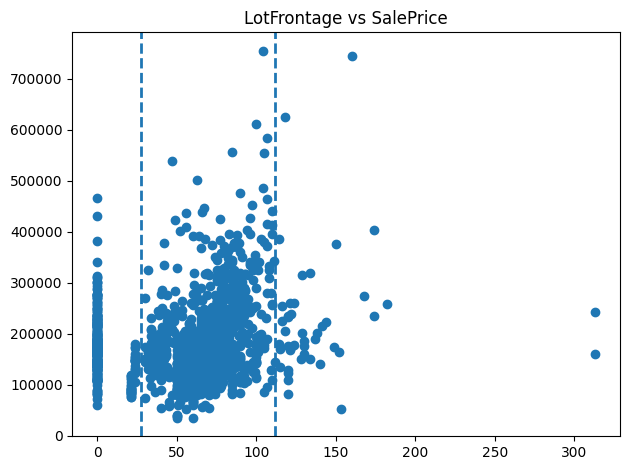

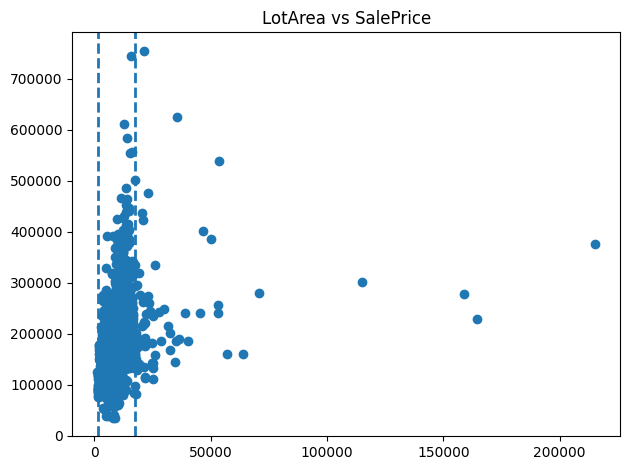

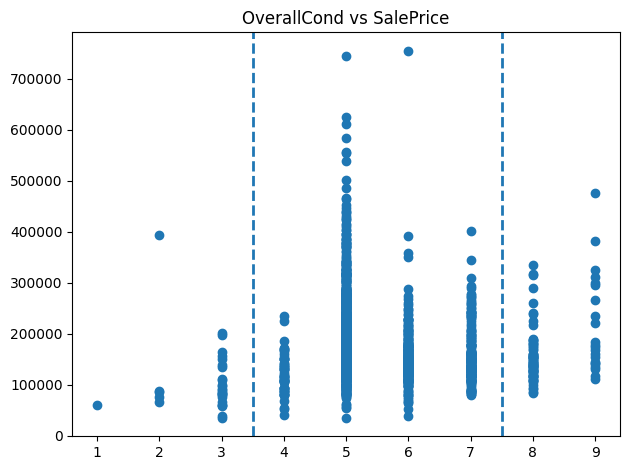

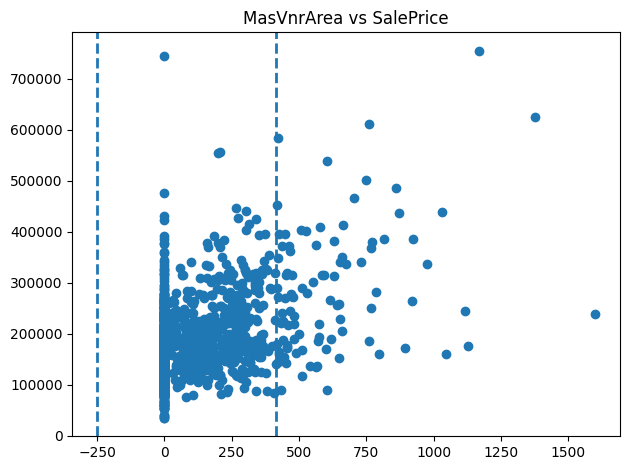

...

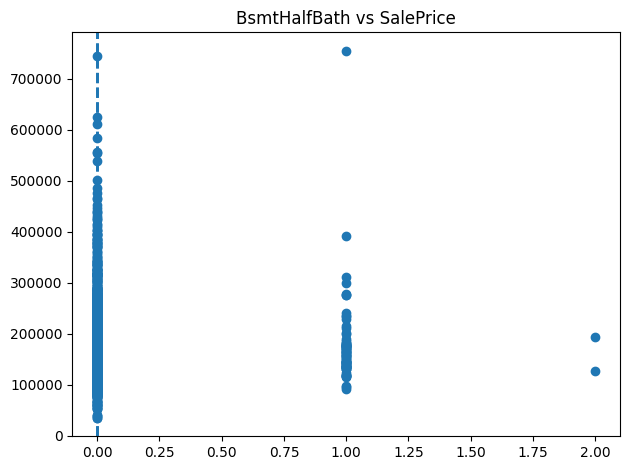

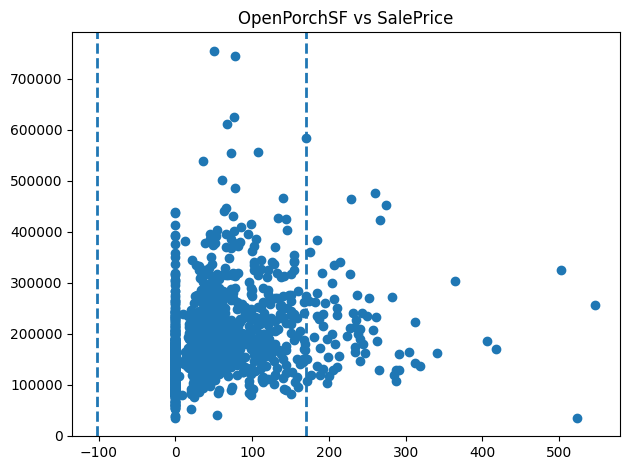

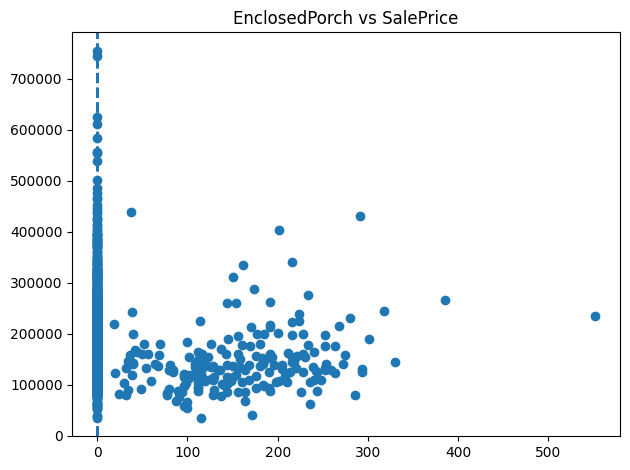

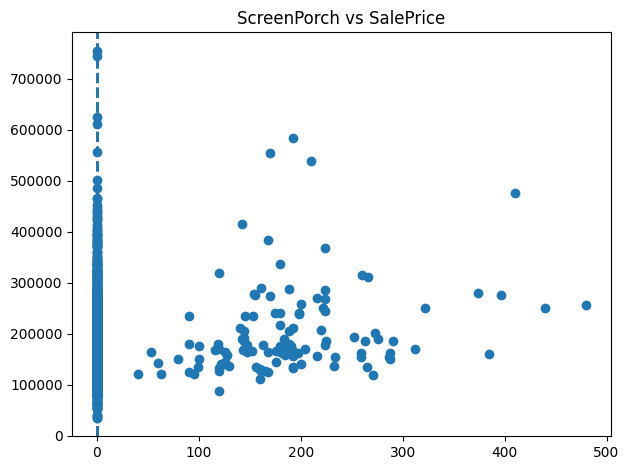

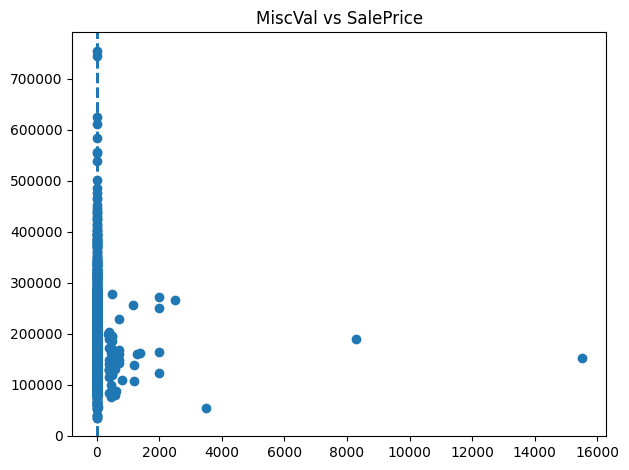

In [69]:
for col in to_check_outliers:
    if col=="SalePrice":
        continue
    plt.scatter(x=col,y="SalePrice",data=df)
    plt.title(f'{col} vs SalePrice')
    plt.axvline(to_check_outliers[col][0], linestyle='--', linewidth=2)
    plt.axvline(to_check_outliers[col][1], linestyle='--', linewidth=2)
    plt.tight_layout()
    plt.show()

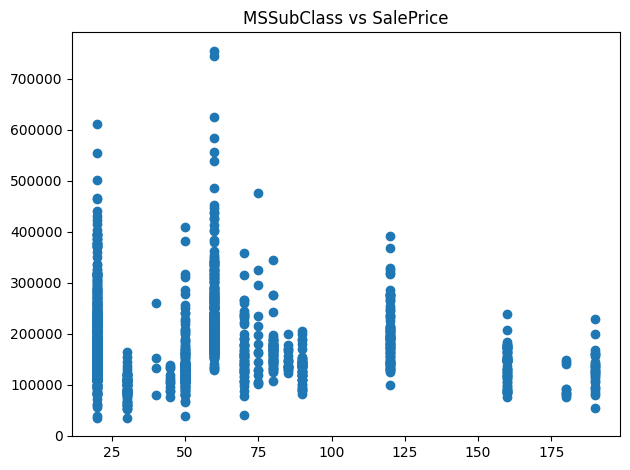

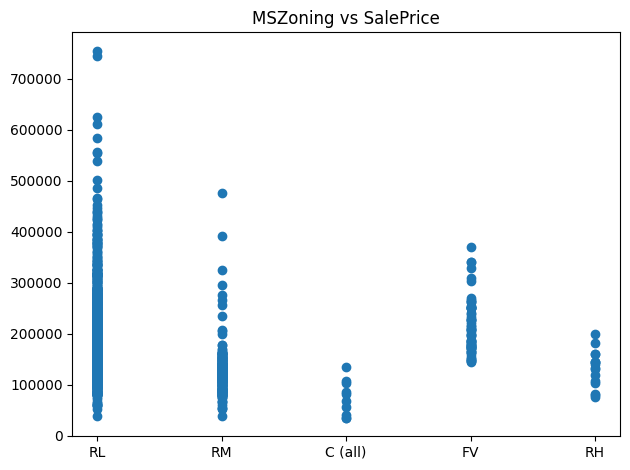

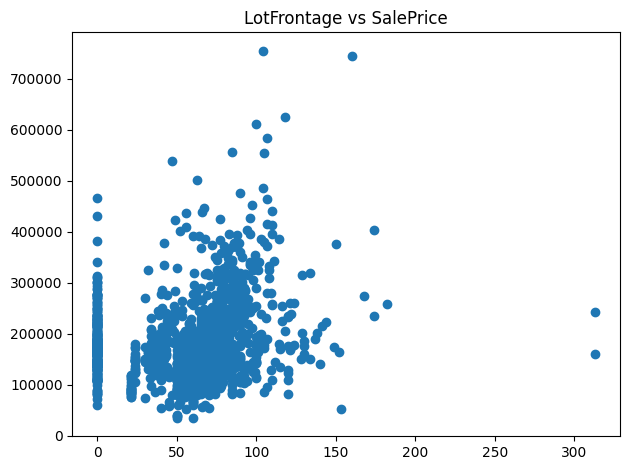

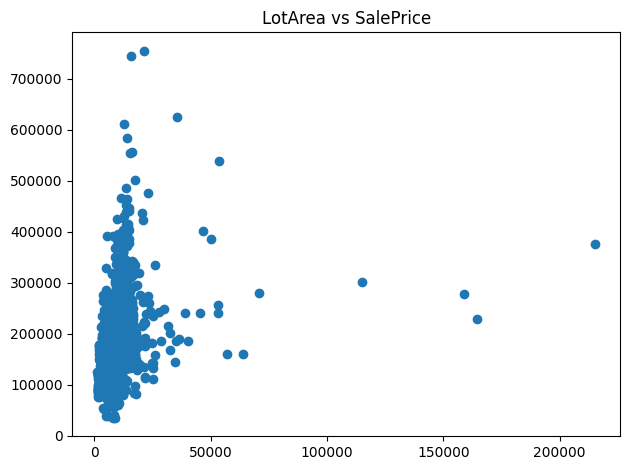

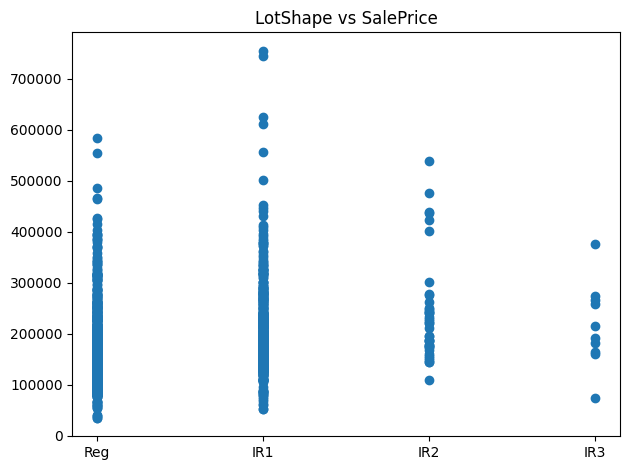

...

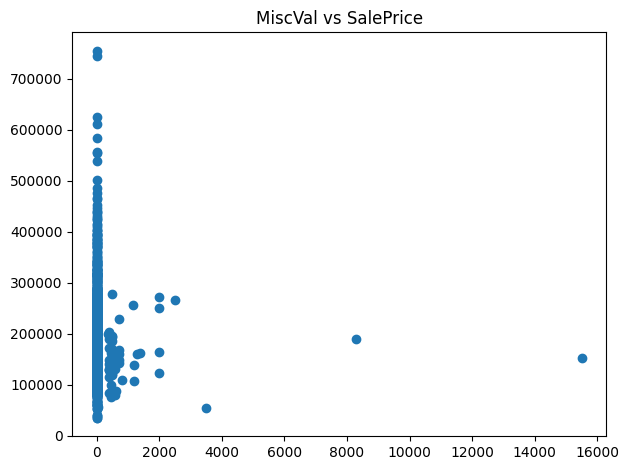

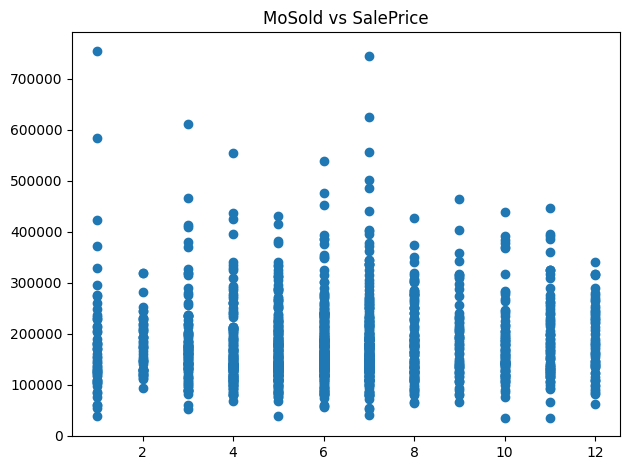

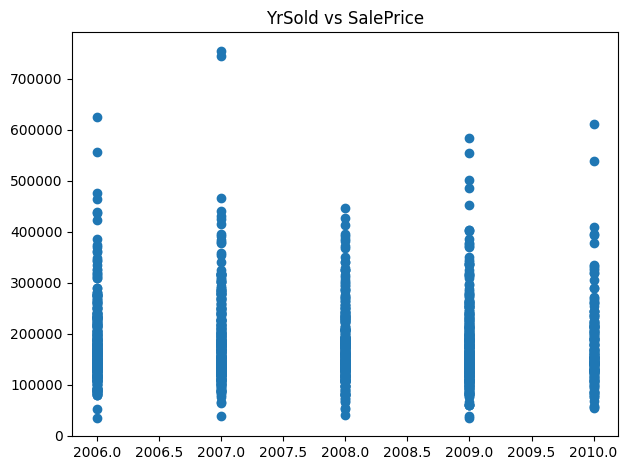

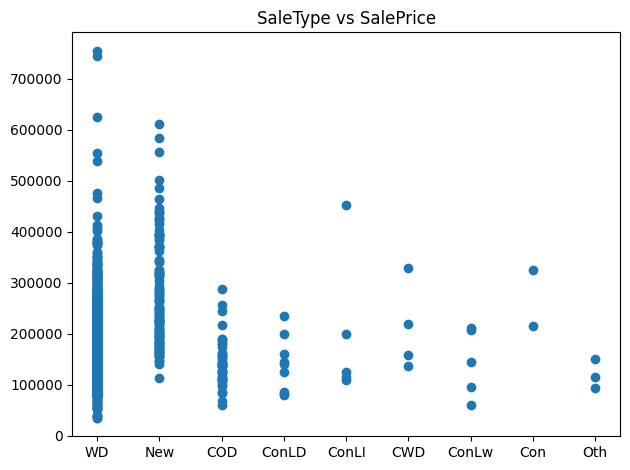

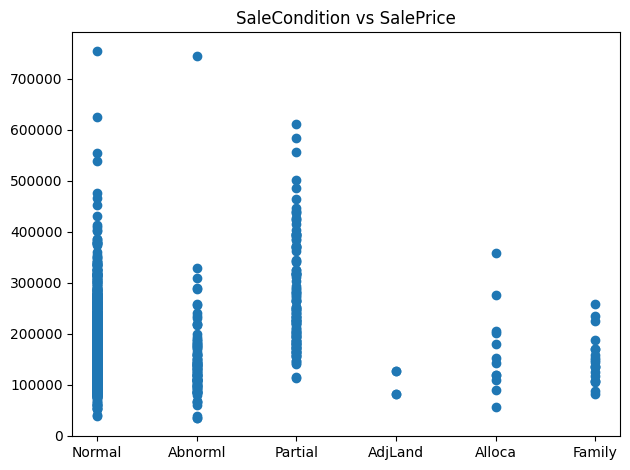

In [70]:
#eyeballing extreme outliers
for col in df.columns:
    if col=="SalePrice":
        continue
    plt.scatter(x=col,y="SalePrice",data=df)
    plt.title(f'{col} vs SalePrice')
    plt.tight_layout()
    plt.show()

In [71]:
to_drop_values = [598, 955, 935, 1299, 250, 314, 336, 707, 379, 1183, 692, 186, 441, 186, 524, 739, 598, 955, 636, 1062, 1191, 496, 198, 1338]
to_drop_values=set(to_drop_values).union(rows_to_drop)
len(to_drop_values)

60

In [72]:
df = df.drop(index=to_drop_values).reset_index(drop=True)

In [73]:
df.shape

(1400, 64)

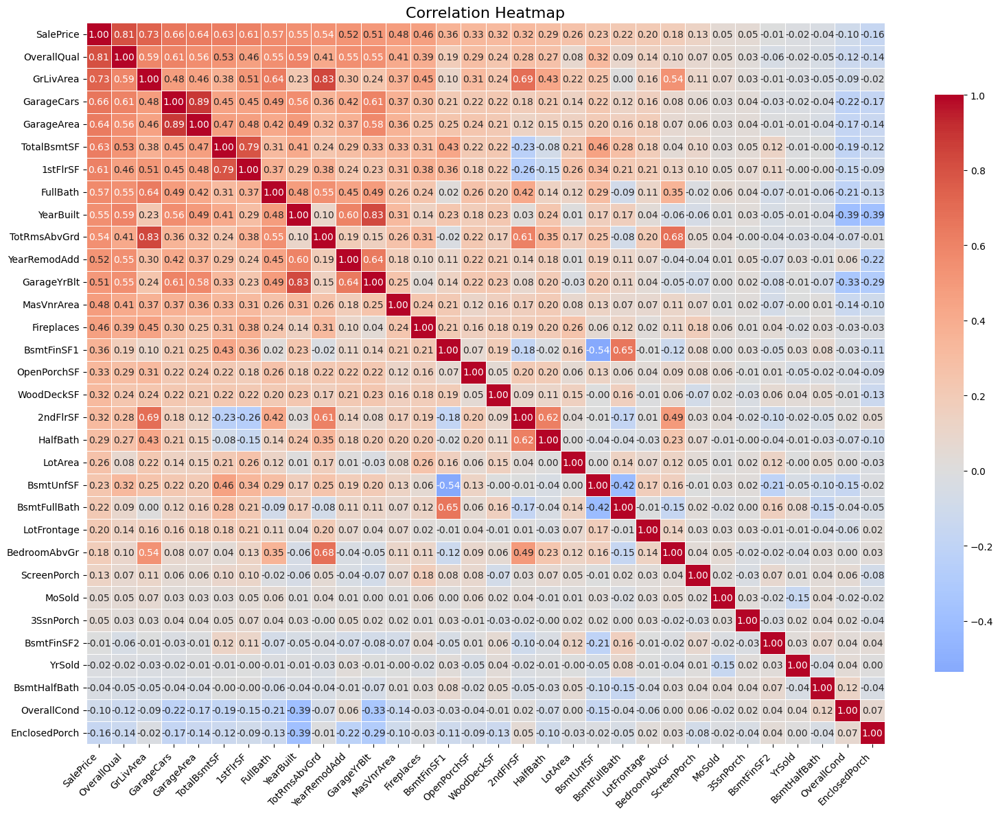

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Calculate correlation matrix
corr_both = df[categorized_cols['continuous_area_cols']+['SalePrice']+categorized_cols['discrete_num_cols']].corr()

# Focus only on correlation with SalePrice (most important for target analysis)
saleprice_corr = corr_both['SalePrice'].sort_values(ascending=False)

# Or full matrix but only top correlated features
top_features = saleprice_corr[abs(saleprice_corr)>0].index  # Adjust threshold

corr_top = df[top_features].corr()

# Plot clean version
plt.figure(figsize=(16, 12))
sns.heatmap(corr_top, 
            annot=True, 
            cmap='coolwarm', 
            center=0,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.8},
            square=False)

plt.title('Correlation Heatmap', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [75]:
saleprice_corr = corr_both['SalePrice'].sort_values(ascending=True)
sloppy_features = saleprice_corr[abs(saleprice_corr)<0.3].index
feat_eng['weak_cols']=list(set(feat_eng['weak_cols']).union(set(sloppy_features)))

In [76]:
categorized_cols['continuous_area_cols']+['SalePrice']+categorized_cols['discrete_num_cols']

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'SalePrice',
 'OverallQual',
 'OverallCond',
 'BedroomAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'FullBath',
 'HalfBath',
 'BsmtFullBath',
 'BsmtHalfBath',
 'YearBuilt',
 'YearRemodAdd',
 'GarageYrBlt',
 'YrSold',
 'MoSold']

In [77]:
feat_eng['check_and_eng']={}

In [78]:
feat_eng['check_and_eng']['GrLivArea']=['TotRmsAbvGrd']
feat_eng['check_and_eng']['TotalBsmtSF']=['1stFlrSF']
feat_eng['check_and_eng']['GarageArea']=['GarageCars']
feat_eng['check_and_eng']['YearBuilt']=['GarageYrBlt']

In [79]:
pairs_to_check=[['GrLivArea','2ndFlrSF'],['BsmtFinSF1','BsmtFullBath'],['TotRmsAbvGrd','BedroomAbvGr']]

In [80]:
feat_eng

{'weak_cols': ['PoolArea',
  'MoSold',
  'BsmtFinSF2',
  'BsmtHalfBath',
  'BedroomAbvGr',
  'LowQualFinSF',
  'HalfBath',
  'ScreenPorch',
  'BsmtFullBath',
  '3SsnPorch',
  'LotFrontage',
  'BsmtUnfSF',
  'YrSold',
  'LotArea',
  'MiscVal',
  'EnclosedPorch',
  'OverallCond'],
 'check_and_eng': {'GrLivArea': ['TotRmsAbvGrd'],
  'TotalBsmtSF': ['1stFlrSF'],
  'GarageArea': ['GarageCars'],
  'YearBuilt': ['GarageYrBlt']}}

In [81]:
#New features to be considered
df_corr_check= df[categorized_cols['continuous_area_cols']+['SalePrice']+categorized_cols['discrete_num_cols']].copy()
df_corr_check['eng_houseage'] = df_corr_check['YrSold'] - df_corr_check['YearBuilt']
df_corr_check['eng_houseremodelage'] = df_corr_check['YrSold'] - df_corr_check['YearRemodAdd']
df_corr_check['eng_totalsf'] = df_corr_check['1stFlrSF'] + df_corr_check['2ndFlrSF'] + df_corr_check['BsmtFinSF1'] + df_corr_check['BsmtFinSF2']
df_corr_check['eng_totalBsmts1and2'] = df_corr_check['BsmtFinSF1'] + df_corr_check['BsmtFinSF2']
df_corr_check['eng_totalBsmtArea'] = df_corr_check['BsmtFinSF1'] + df_corr_check['BsmtFinSF2']+df_corr_check['BsmtUnfSF']
df_corr_check['eng_totalFlrsf'] = df_corr_check['1stFlrSF'] + df_corr_check['2ndFlrSF']
df_corr_check['eng_totalarea'] = df_corr_check['GrLivArea'] + df_corr_check['TotalBsmtSF']
df_corr_check['eng_totalbaths'] = df_corr_check['BsmtFullBath'] + df_corr_check['FullBath'] + 0.5 * (df_corr_check['BsmtHalfBath'] + df_corr_check['HalfBath']) 
df_corr_check['eng_totalporchsf'] = df_corr_check['OpenPorchSF'] + df_corr_check['3SsnPorch'] + df_corr_check['EnclosedPorch'] + df_corr_check['ScreenPorch'] + df_corr_check['WoodDeckSF']

In [82]:
import re
feat_eng['compare_corr']={}

In [83]:
str_check='''df_corr_check['eng_houseage'] = df_corr_check['YrSold'] - df_corr_check['YearBuilt']
df_corr_check['eng_houseremodelage'] = df_corr_check['YrSold'] - df_corr_check['YearRemodAdd']
df_corr_check['eng_totalsf'] = df_corr_check['1stFlrSF'] + df_corr_check['2ndFlrSF'] + df_corr_check['BsmtFinSF1'] + df_corr_check['BsmtFinSF2']
df_corr_check['eng_totalBsmts1and2'] = df_corr_check['BsmtFinSF1'] + df_corr_check['BsmtFinSF2']
df_corr_check['eng_totalBsmtArea'] = df_corr_check['BsmtFinSF1'] + df_corr_check['BsmtFinSF2']+df_corr_check['BsmtUnfSF']
df_corr_check['eng_totalFlrsf'] = df_corr_check['1stFlrSF'] + df_corr_check['2ndFlrSF']
df_corr_check['eng_totalarea'] = df_corr_check['GrLivArea'] + df_corr_check['TotalBsmtSF']
df_corr_check['eng_totalbaths'] = df_corr_check['BsmtFullBath'] + df_corr_check['FullBath'] + 0.5 * (df_corr_check['BsmtHalfBath'] + df_corr_check['HalfBath']) 
df_corr_check['eng_totalporchsf'] = df_corr_check['OpenPorchSF'] + df_corr_check['3SsnPorch'] + df_corr_check['EnclosedPorch'] + df_corr_check['ScreenPorch'] + df_corr_check['WoodDeckSF']'''
for line in str_check.splitlines():
    if line.strip():
        cols = re.findall(r"'(.*?)'", line)
        feat_eng['compare_corr'][cols[0]]=cols[1:]

In [84]:
feat_eng['compare_corr']['eng_totalBsmts1and2'].append('TotalBsmtSF')
feat_eng['compare_corr']['eng_totalBsmtArea'].append('TotalBsmtSF')

In [85]:
feat_eng['compare_corr']

{'eng_houseage': ['YrSold', 'YearBuilt'],
 'eng_houseremodelage': ['YrSold', 'YearRemodAdd'],
 'eng_totalsf': ['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtFinSF2'],
 'eng_totalBsmts1and2': ['BsmtFinSF1', 'BsmtFinSF2', 'TotalBsmtSF'],
 'eng_totalBsmtArea': ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF'],
 'eng_totalFlrsf': ['1stFlrSF', '2ndFlrSF'],
 'eng_totalarea': ['GrLivArea', 'TotalBsmtSF'],
 'eng_totalbaths': ['BsmtFullBath', 'FullBath', 'BsmtHalfBath', 'HalfBath'],
 'eng_totalporchsf': ['OpenPorchSF',
  '3SsnPorch',
  'EnclosedPorch',
  'ScreenPorch',
  'WoodDeckSF']}

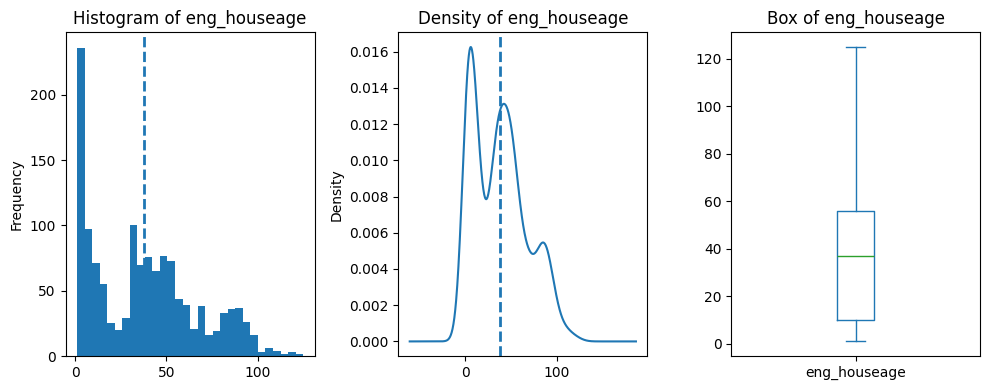

col: eng_houseage
mean: 37.903659447348765
median: 37.0
skewness: 0.5024849948452841


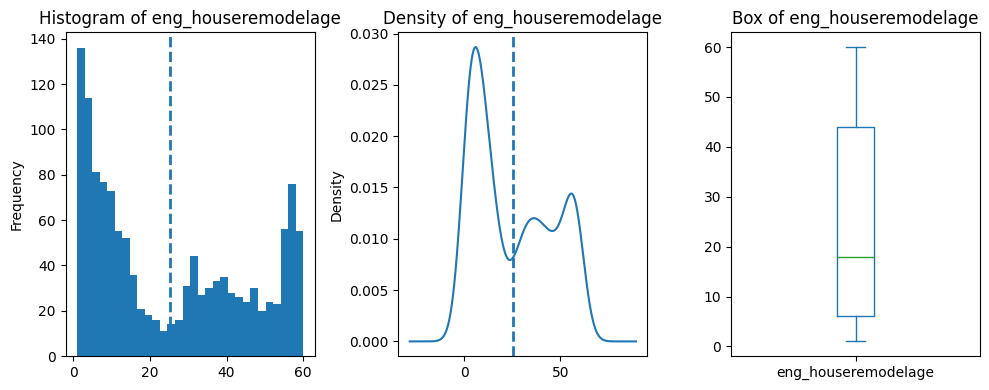

col: eng_houseremodelage
mean: 25.134945397815912
median: 18.0
skewness: 0.38384619213413834


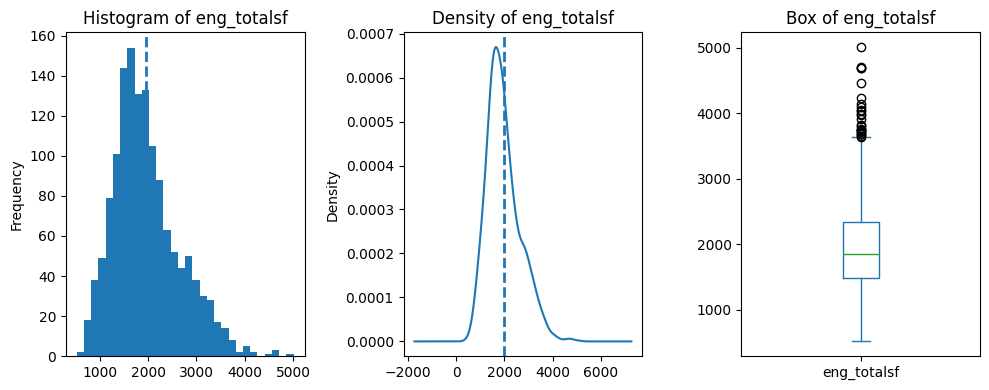

col: eng_totalsf
mean: 1964.8107142857143
median: 1853.0
skewness: 0.8130992894490376


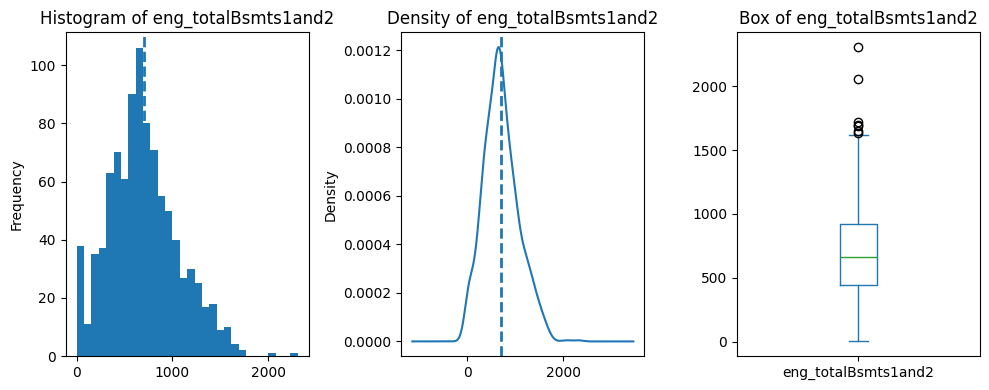

col: eng_totalBsmts1and2
mean: 701.0294426919032
median: 662.0
skewness: 0.47690276037845625


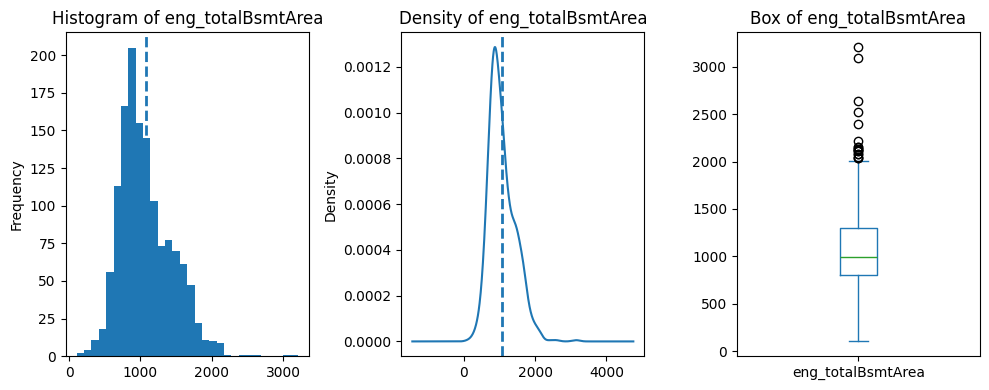

col: eng_totalBsmtArea
mean: 1071.5131964809384
median: 996.0
skewness: 0.8806188677264826


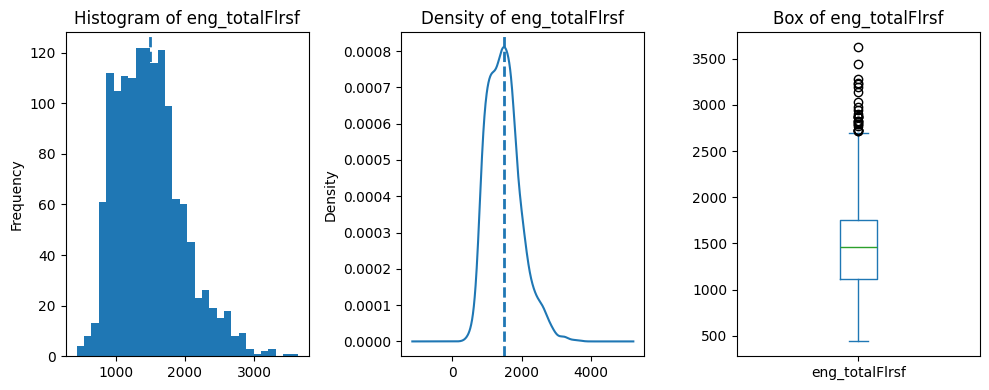

col: eng_totalFlrsf
mean: 1488.6114285714286
median: 1456.0
skewness: 0.7670065649026696


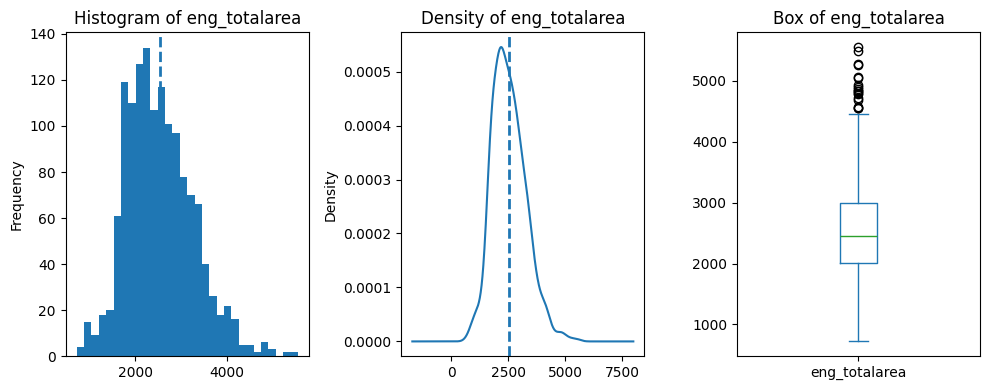

col: eng_totalarea
mean: 2537.975
median: 2460.0
skewness: 0.5938256867256111


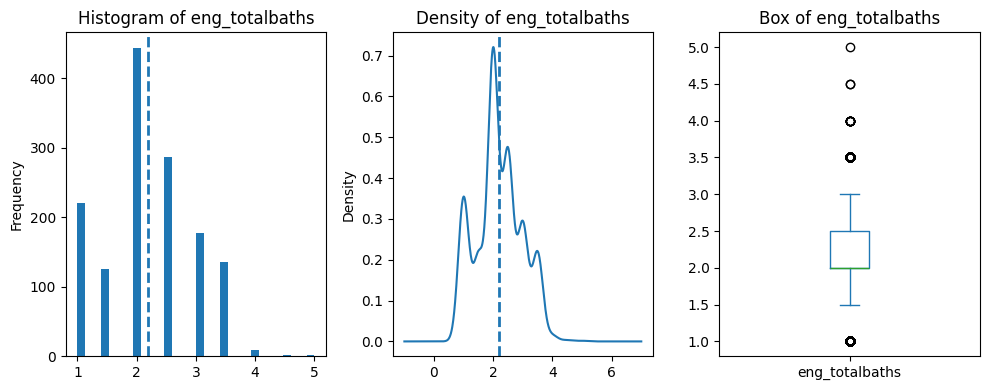

col: eng_totalbaths
mean: 2.1896428571428572
median: 2.0
skewness: 0.14920504769220658


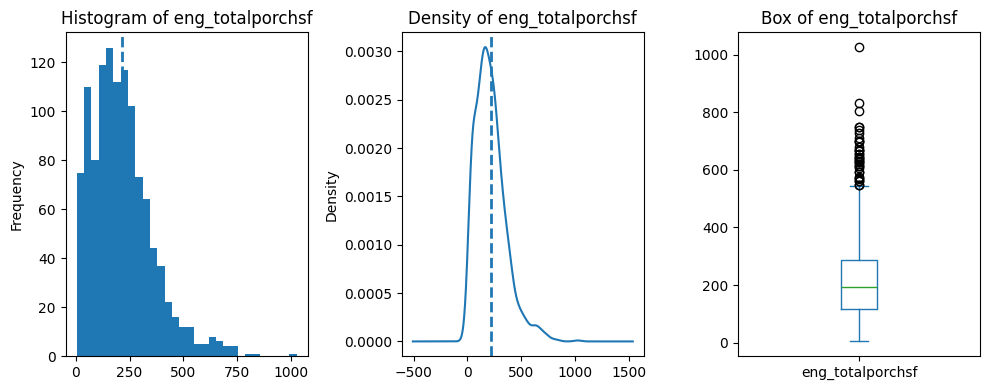

col: eng_totalporchsf
mean: 216.1461937716263
median: 192.0
skewness: 1.1996007710283234


In [86]:
#to check skewness of engineered_cols
for col in feat_eng['compare_corr']:
    plt_df=df_corr_check[df_corr_check[col] > 0][col]
    skew_val=plt_df.skew()
    if skew_val>1.5: transformations['Skew'].append(col)
    elif skew_val>0.5 or skew_val<-0.3: to_check_skew.append(col)
    bins = min(50, max(10, int(np.sqrt(len(df_corr_check[col])))))
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4))  # Fixed size
    plt_df.plot(kind='hist', bins=30, ax=axes[0], title=f'Histogram of {col}')
    mean_val = plt_df.mean()
    axes[0].axvline(mean_val, linestyle='--', linewidth=2)
    plt_df.plot(kind='kde', ax=axes[1], title=f'Density of {col}')
    axes[1].axvline(mean_val, linestyle='--', linewidth=2)
    plt_df.plot(kind='box', ax=axes[2], title=f'Box of {col}')
    plt.tight_layout()
    plt.show()
    print('col:',col)
    print("mean:",mean_val)
    print("median:",plt_df.median())
    print("skewness:",skew_val)

In [87]:
for col in ['eng_totalBsmtArea','eng_totalporchsf']:
    transformations['Skew'].append(col)

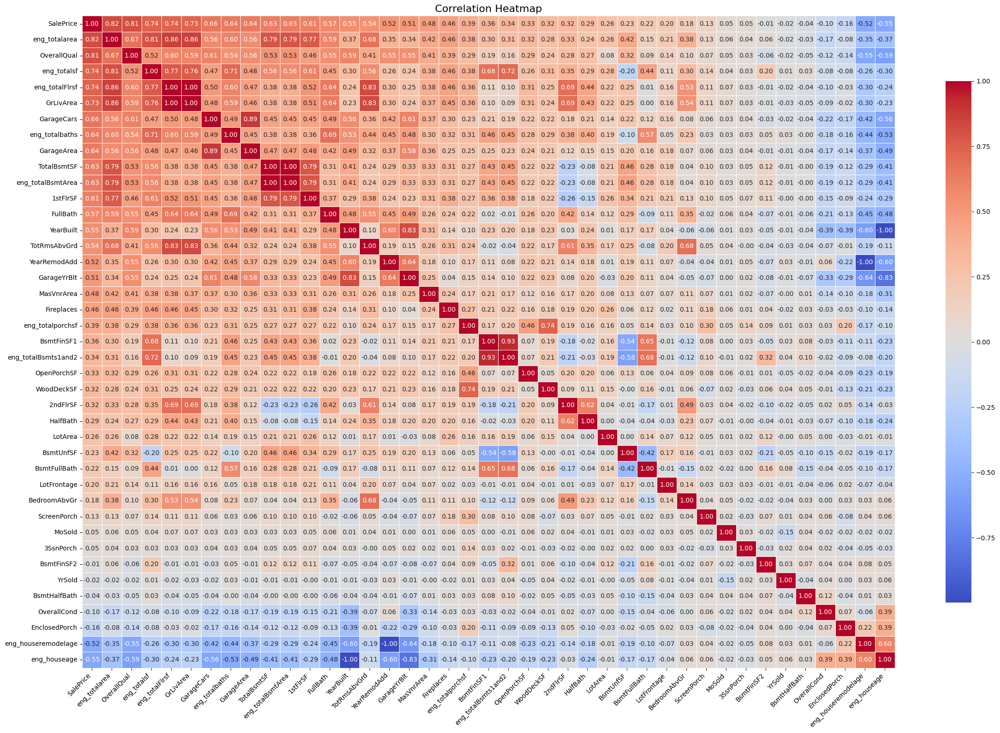

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Calculate correlation matrix
corr_check_corr = df_corr_check.corr()

# Focus only on correlation with SalePrice (most important for target analysis)
saleprice_corr = corr_check_corr['SalePrice'].sort_values(ascending=False)

# Or full matrix but only top correlated features
top_features = saleprice_corr[abs(saleprice_corr)>0].index  # Adjust threshold

corr_top = df_corr_check[top_features].corr()

# Plot clean version
plt.figure(figsize=(24, 16))
sns.heatmap(corr_top, 
            annot=True, 
            cmap='coolwarm', 
            center=0,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.8},
            square=False)

plt.title('Correlation Heatmap', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [89]:
transformations['Skew']

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'WoodDeckSF',
 'OpenPorchSF',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'eng_totalBsmtArea',
 'eng_totalporchsf']

In [90]:
for col in transformations['Skew']:
    log_col = f'skew_{col}'                     # Name of new log column
    df_corr_check[log_col] = np.log1p(df_corr_check[col])  # log(1 + x) — safer & equivalent
    
    # Initialize comparison list with the original column
    feat_eng['compare_corr'][log_col] = [col]
    
    # Check if this original column is already used in another engineered feature
    for existing_key, orig_list in feat_eng['compare_corr'].items():
        if col in orig_list and existing_key != log_col:
            # Append the existing engineered feature name to the new log feature's list
            feat_eng['compare_corr'][log_col].append(existing_key)
            break  # Only need to find one (or remove break if multiple possible)

In [91]:
corr_check_corr = df_corr_check.corr()
for key in feat_eng['compare_corr']:
    if key in corr_check_corr.columns:
        print(f"{key}: {corr_check_corr['SalePrice'][key]:.4f}")
        print("  Built from:")
        for orig_feat in feat_eng['compare_corr'][key]:
            if orig_feat in corr_check_corr.columns:
                print(f"    - {orig_feat}: {corr_check_corr['SalePrice'][orig_feat]:.4f}")
        print()
    else:
        print(f"{key}: not found in dataframe (possibly not created yet)")
    

eng_houseage: -0.5487
  Built from:
    - YrSold: -0.0194
    - YearBuilt: 0.5487

eng_houseremodelage: -0.5235
  Built from:
    - YrSold: -0.0194
    - YearRemodAdd: 0.5223

eng_totalsf: 0.7399
  Built from:
    - 1stFlrSF: 0.6123
    - 2ndFlrSF: 0.3185
    - BsmtFinSF1: 0.3621
    - BsmtFinSF2: -0.0063

eng_totalBsmts1and2: 0.3418
  Built from:
    - BsmtFinSF1: 0.3621
    - BsmtFinSF2: -0.0063
    - TotalBsmtSF: 0.6316

eng_totalBsmtArea: 0.6316
  Built from:
    - BsmtFinSF1: 0.3621
    - BsmtFinSF2: -0.0063
    - BsmtUnfSF: 0.2342
    - TotalBsmtSF: 0.6316

eng_totalFlrsf: 0.7396
  Built from:
    - 1stFlrSF: 0.6123
    - 2ndFlrSF: 0.3185

eng_totalarea: 0.8250
  Built from:
    - GrLivArea: 0.7317
    - TotalBsmtSF: 0.6316

eng_totalbaths: 0.6411
  Built from:
    - BsmtFullBath: 0.2174
    - FullBath: 0.5726
    - BsmtHalfBath: -0.0379
    - HalfBath: 0.2867

eng_totalporchsf: 0.3928
  Built from:
    - OpenPorchSF: 0.3305
    - 3SsnPorch: 0.0519
    - EnclosedPorch: -0.1557
  

In [92]:
corr_check_corr = df_corr_check.corr()
for key in feat_eng['compare_corr']:
    if key in corr_check_corr.columns:
        print(f"{key}: {corr_check_corr['SalePrice'][key]:.4f}")
        print("  Built from:")
        for orig_feat in feat_eng['compare_corr'][key]:
            if orig_feat in corr_check_corr.columns:
                print(f"{orig_feat}:")
                print(f"    - SalePrice vs {orig_feat} : {corr_check_corr['SalePrice'][orig_feat]:.4f}")
                print(f"    - {key} vs {orig_feat} : {corr_check_corr[key][orig_feat]:.4f}")
        print()
    else:
        print(f"{key}: not found in dataframe (possibly not created yet)")

eng_houseage: -0.5487
  Built from:
YrSold:
    - SalePrice vs YrSold : -0.0194
    - eng_houseage vs YrSold : 0.0585
YearBuilt:
    - SalePrice vs YearBuilt : 0.5487
    - eng_houseage vs YearBuilt : -0.9990

eng_houseremodelage: -0.5235
  Built from:
YrSold:
    - SalePrice vs YrSold : -0.0194
    - eng_houseremodelage vs YrSold : 0.0323
YearRemodAdd:
    - SalePrice vs YearRemodAdd : 0.5223
    - eng_houseremodelage vs YearRemodAdd : -0.9979

eng_totalsf: 0.7399
  Built from:
1stFlrSF:
    - SalePrice vs 1stFlrSF : 0.6123
    - eng_totalsf vs 1stFlrSF : 0.6070
2ndFlrSF:
    - SalePrice vs 2ndFlrSF : 0.3185
    - eng_totalsf vs 2ndFlrSF : 0.3538
BsmtFinSF1:
    - SalePrice vs BsmtFinSF1 : 0.3621
    - eng_totalsf vs BsmtFinSF1 : 0.6769
BsmtFinSF2:
    - SalePrice vs BsmtFinSF2 : -0.0063
    - eng_totalsf vs BsmtFinSF2 : 0.1985

eng_totalBsmts1and2: 0.3418
  Built from:
BsmtFinSF1:
    - SalePrice vs BsmtFinSF1 : 0.3621
    - eng_totalBsmts1and2 vs BsmtFinSF1 : 0.9316
BsmtFinSF2:
    

In [93]:
cols_to_drop=['skew_PoolArea','ScreenPorch','skew_ScreenPorch','skew_3SsnPorch','3SsnPorch','skew_EnclosedPorch','EnclosedPorch'
,'skew_BsmtFinSF2','BsmtUnfSF','skew_BsmtUnfSF','skew_BsmtFinSF2','BsmtFinSF2','skew_TotalBsmtSF','skew_BsmtFinSF1','BsmtFinSF1','eng_totalBsmts1and2',
'skew_BsmtFinSF1','BsmtFinSF1','skew_MasVnrArea','LotArea','skew_LotFrontage','eng_totalporchsf','OpenPorchSF','3SsnPorch','EnclosedPorch','ScreenPorch',
'WoodDeckSF','HalfBath','BsmtHalfBath','FullBath','BsmtFullBath','TotalBsmtSF','GrLivArea','1stFlrSF','2ndFlrSF','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF',
'YrSold','YearBuilt','YearRemodAdd','skew_eng_totalBsmtArea','kew_WoodDeckSF','skew_eng_totalporchsf']

In [94]:
feat_eng['check_and_eng']

{'GrLivArea': ['TotRmsAbvGrd'],
 'TotalBsmtSF': ['1stFlrSF'],
 'GarageArea': ['GarageCars'],
 'YearBuilt': ['GarageYrBlt']}

In [95]:
pairs_to_check  #keeping 'BedroomAbvGrnd' since TotRmsAbvGrnd is to be dropped, rest in other arrays already are satisfied

[['GrLivArea', '2ndFlrSF'],
 ['BsmtFinSF1', 'BsmtFullBath'],
 ['TotRmsAbvGrd', 'BedroomAbvGr']]

In [96]:
cols_to_drop+=['TotRmsAbvGrd','GarageCars','GarageYrBlt']  #'1stFlrSF already droped

In [97]:
cols_to_drop+=['PoolArea','MiscVal','MoSold'] # cols with lot of zeros and MoSold-> YearSold is dropped therefore, it has no use

In [98]:
has_cols=['BsmtFinSF1','2ndFlrSF','WoodDeckSF','OpenPorchSF','MasVnrArea']
for col in has_cols:
    df_corr_check[f"has{col}"]=(df_corr_check[col] > 0).astype(int)


In [99]:
df_corr_check.columns

Index(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'SalePrice', 'OverallQual', 'OverallCond',
       'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'FullBath',
       'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'YearBuilt', 'YearRemodAdd',
       'GarageYrBlt', 'YrSold', 'MoSold', 'eng_houseage',
       'eng_houseremodelage', 'eng_totalsf', 'eng_totalBsmts1and2',
       'eng_totalBsmtArea', 'eng_totalFlrsf', 'eng_totalarea',
       'eng_totalbaths', 'eng_totalporchsf', 'skew_LotFrontage',
       'skew_LotArea', 'skew_MasVnrArea', 'skew_BsmtFinSF1',
       'skew_TotalBsmtSF', 'skew_WoodDeckSF', 'skew_OpenPorchSF',
       'skew_BsmtFinSF2', 'skew_BsmtUnfSF', 'skew_EnclosedPorch',
       'skew_3SsnPorch', 'skew_ScreenPorch', 'skew_PoolArea',
       'skew_eng_totalBsmtAr

In [100]:
#out of these,  skew_OpenPorchSF wins
# skew_OpenPorchSF: 0.4388
#   Built from:
#     - OpenPorchSF: 0.3319
#     - eng_totalporchsf: 0.3961


# eng_totalporchsf: 0.3961
#   Built from:
#     - OpenPorchSF: 0.3319
#     - 3SsnPorch: 0.0514
#     - EnclosedPorch: -0.1505
#     - ScreenPorch: 0.1254
#     - WoodDeckSF: 0.3228


--- MSZoning ---
Value Counts:
MSZoning
RL         1107
RM          207
FV           61
RH           15
C (all)      10
Name: count, dtype: int64

Mean/Median SalePrice by category:
                   mean    median  count     max     min
MSZoning                                                
FV        215558.426230  208300.0     61  370878  144152
RL        188490.636856  173000.0   1107  625000   52000
RH        130662.266667  133000.0     15  200000   76000
RM        124668.067633  120000.0    207  475000   37900
C (all)    74528.000000   74700.0     10  133900   34900


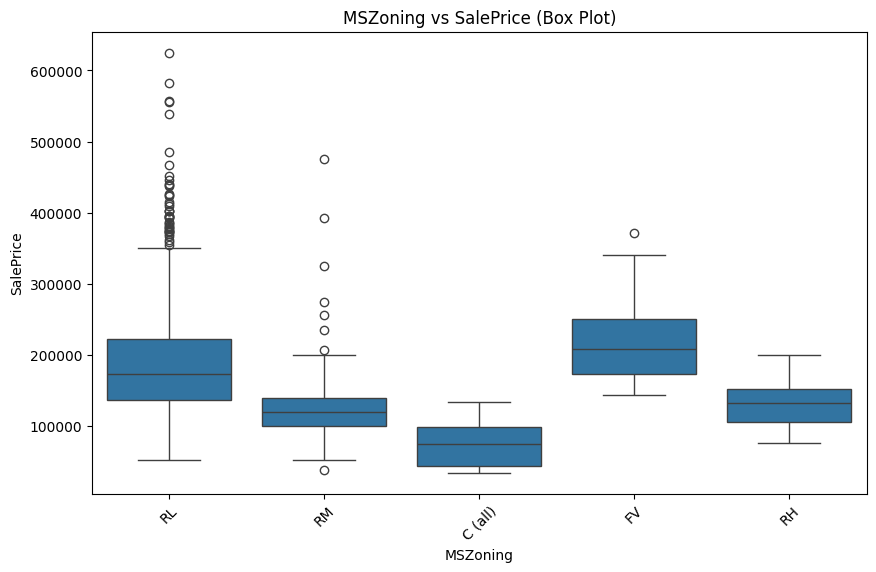

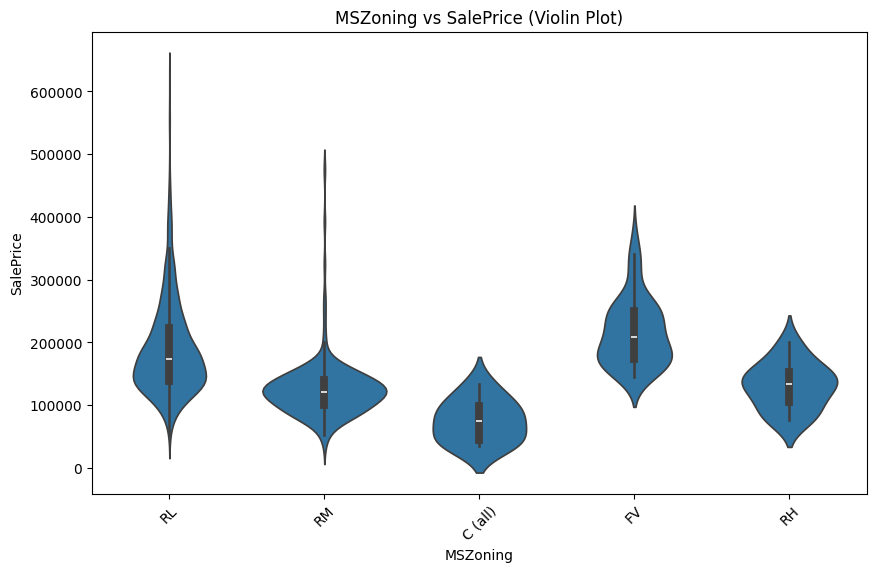


--- LotShape ---
Value Counts:
LotShape
Reg    892
IR1    458
IR2     41
IR3      9
Name: count, dtype: int64

Mean/Median SalePrice by category:
                   mean    median  count     max     min
LotShape                                                
IR2       239833.365854  221000.0     41  538000  110000
IR3       222262.777778  215000.0      9  375000   73000
IR1       200921.207424  187500.0    458  625000   52000
Reg       164197.597534  145000.0    892  582933   34900


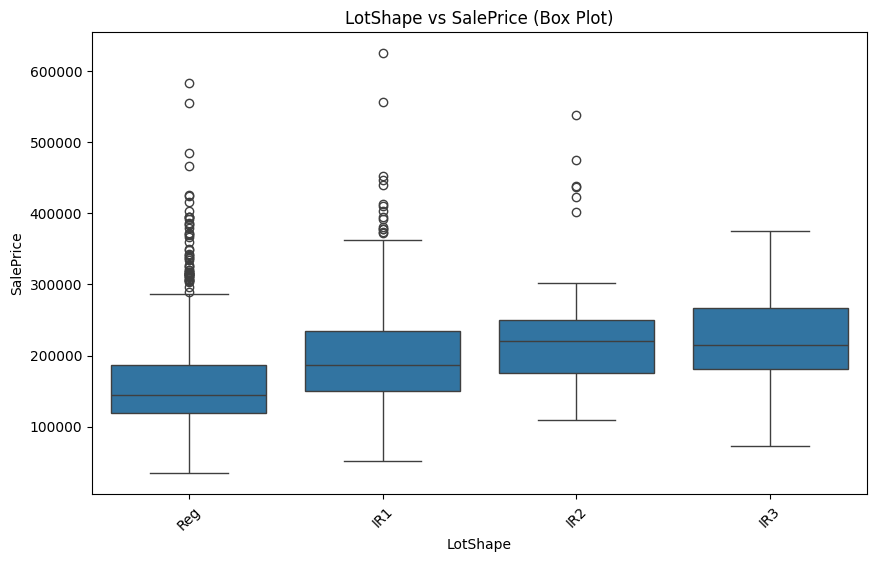

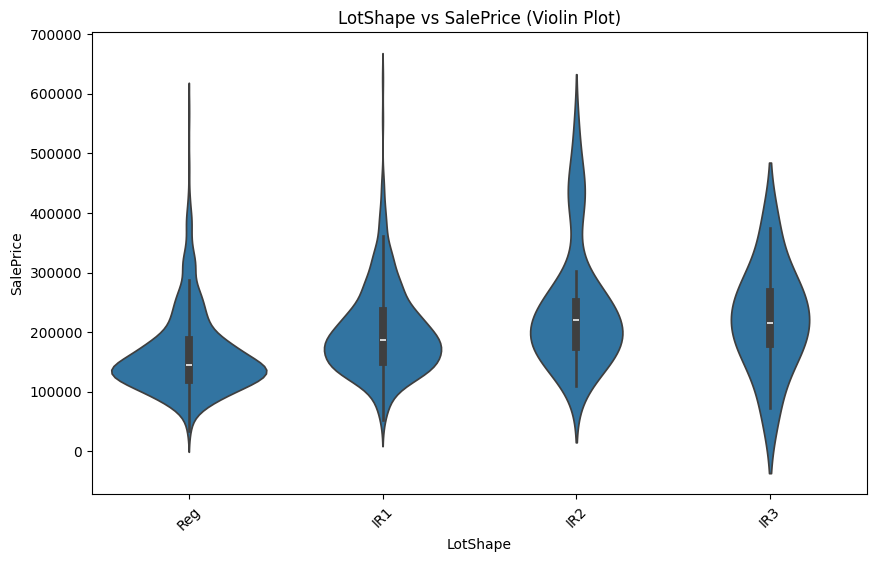


--- LandContour ---
Value Counts:
LandContour
Lvl    1260
Bnk      60
HLS      48
Low      32
Name: count, dtype: int64

Mean/Median SalePrice by category:
                      mean    median  count     max    min
LandContour                                               
HLS          230297.312500  222250.0     48  538000  82500
Low          208703.125000  202500.0     32  375000  81000
Lvl          177883.829365  160100.0   1260  625000  34900
Bnk          140888.450000  136200.0     60  315000  52500


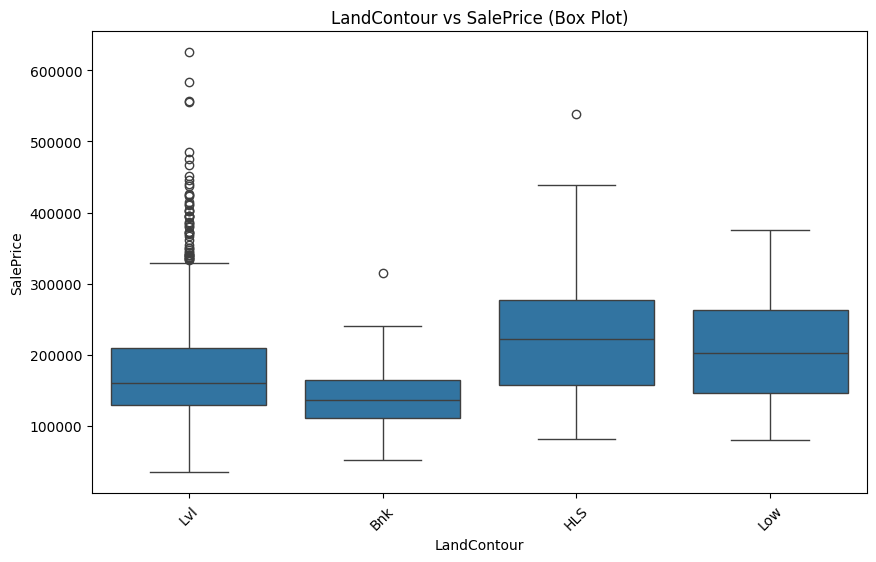

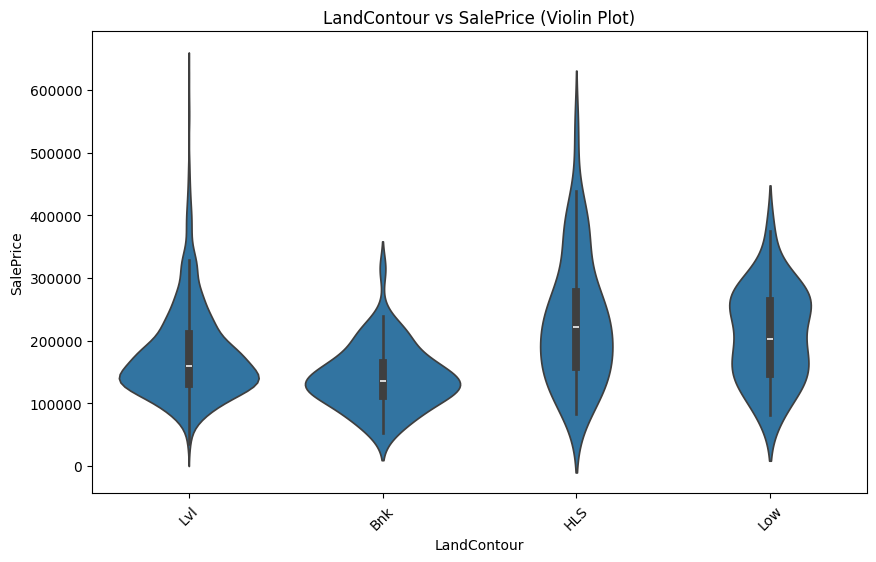


--- LotConfig ---
Value Counts:
LotConfig
Inside     1007
Corner      252
CulDSac      90
FR2          47
FR3           4
Name: count, dtype: int64

Mean/Median SalePrice by category:
                    mean    median  count     max     min
LotConfig                                                
CulDSac    221021.144444  197900.0     90  625000   84000
FR3        208475.000000  195450.0      4  315000  128000
FR2        177934.574468  165000.0     47  394617   81000
Corner     176391.095238  159500.0    252  451950   52500
Inside     175551.558093  158000.0   1007  582933   34900


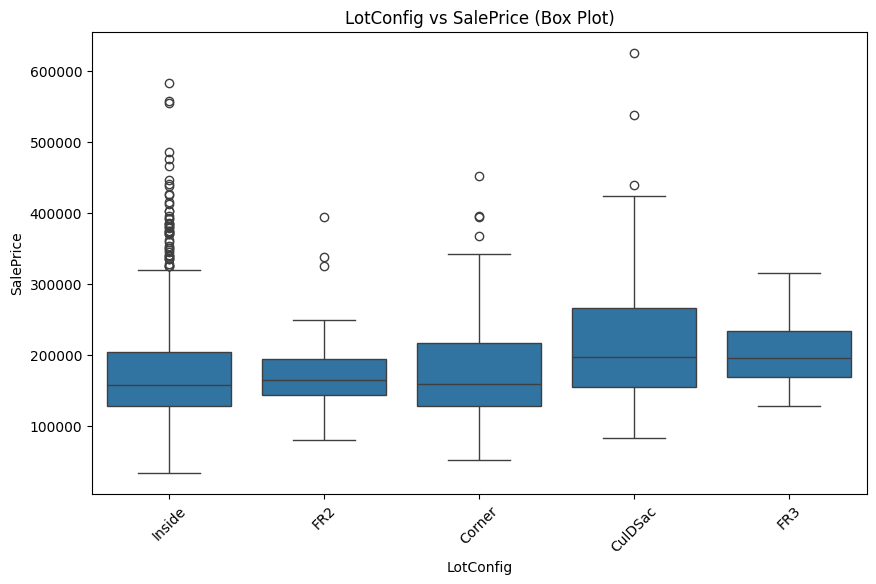

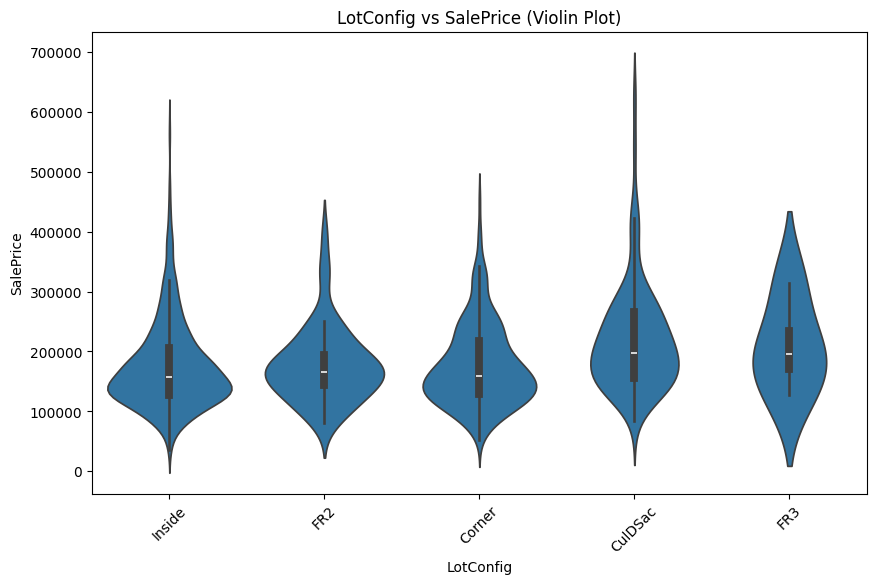


Neighborhood: Too many categories (25) — check manually

--- Condition1 ---
Value Counts:
Condition1
Norm      1209
Feedr       79
Artery      44
RRAn        24
PosN        18
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: count, dtype: int64

Mean/Median SalePrice by category:
                     mean    median  count     max     min
Condition1                                                
PosA        225875.000000  212500.0      8  335000  180000
PosN        216875.000000  206000.0     18  385000  109500
RRNn        212400.000000  214000.0      5  320000  110000
RRNe        190750.000000  190750.0      2  194500  187000
Norm        182161.974359  165000.0   1209  625000   34900
RRAn        181888.000000  168745.0     24  423000   79500
Feedr       142867.265823  140000.0     79  244600   40000
RRAe        138400.000000  142500.0     11  171000   87000
Artery      130850.000000  116500.0     44  475000   66500


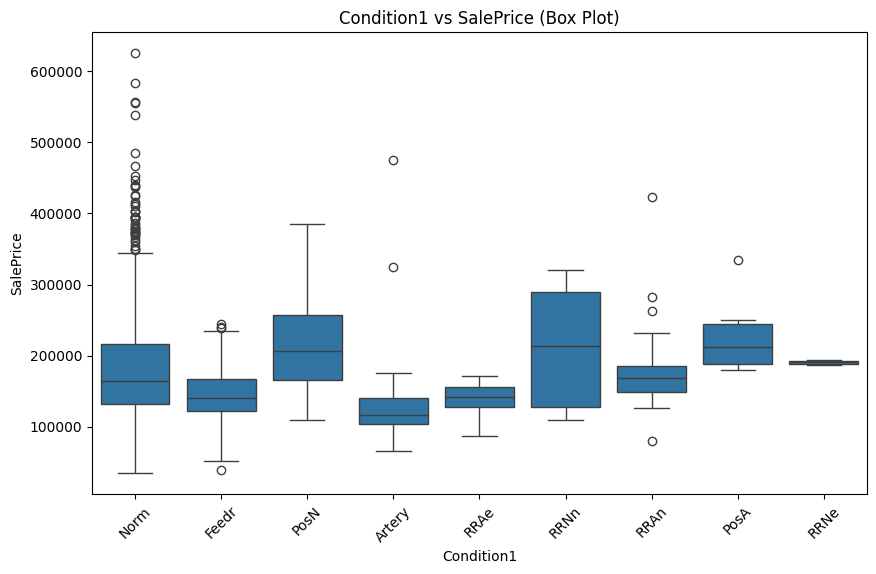

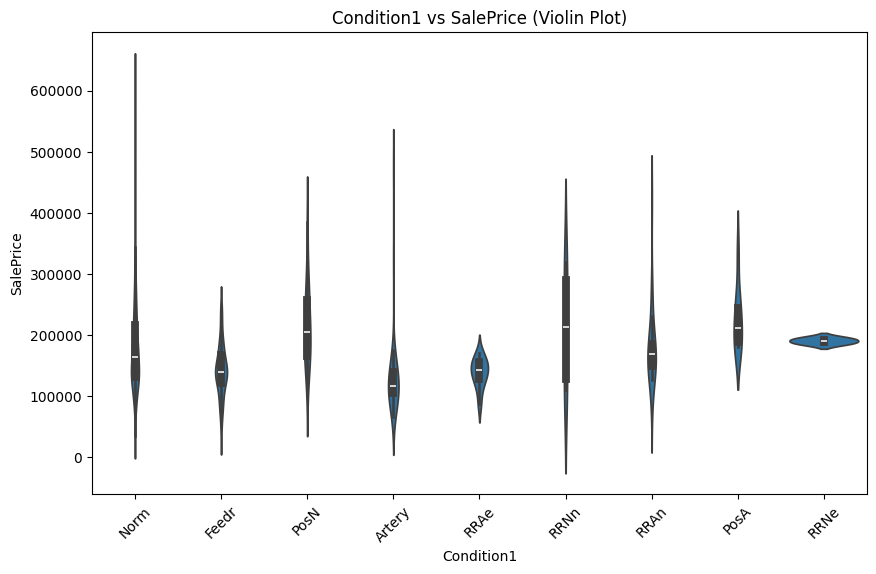


--- BldgType ---
Value Counts:
BldgType
1Fam      1170
TwnhsE     112
Duplex      47
Twnhs       42
2fmCon      29
Name: count, dtype: int64

Mean/Median SalePrice by category:
                   mean    median  count     max    min
BldgType                                               
1Fam      183368.206838  165550.0   1170  625000  34900
TwnhsE    181155.937500  171825.0    112  392500  75500
Twnhs     135004.761905  133750.0     42  230000  75000
Duplex    129698.638298  135000.0     47  190000  82000
2fmCon    128393.103448  127500.0     29  228950  55000


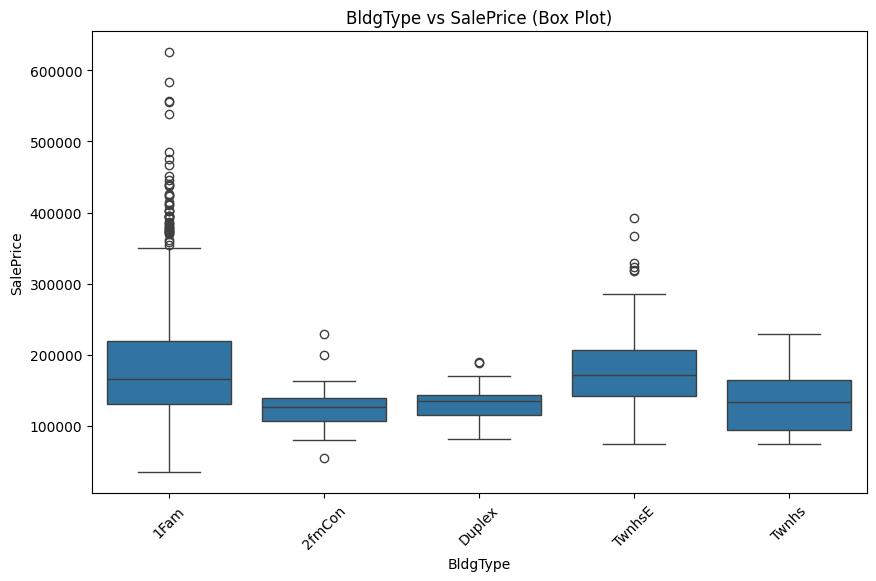

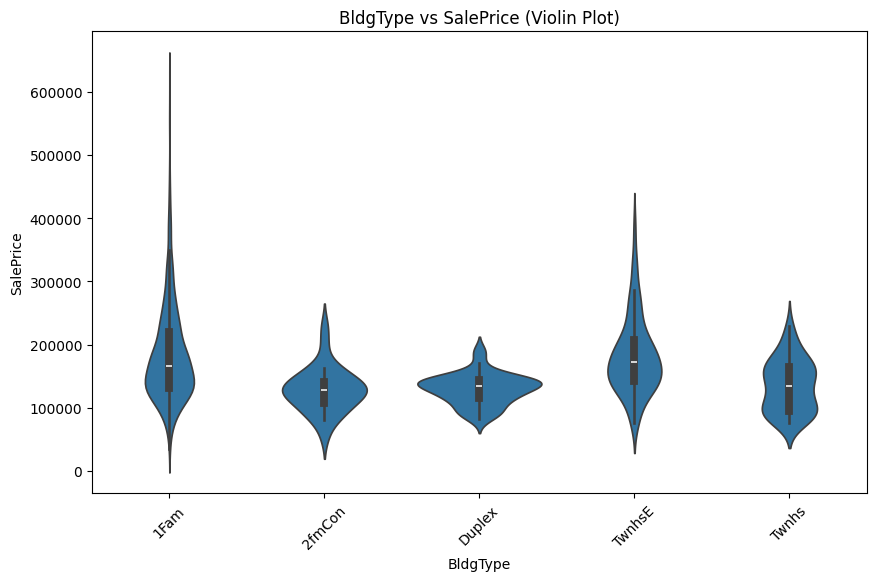


--- HouseStyle ---
Value Counts:
HouseStyle
1Story    699
2Story    420
1.5Fin    153
SLvl       61
SFoyer     36
1.5Unf     14
2.5Unf     11
2.5Fin      6
Name: count, dtype: int64

Mean/Median SalePrice by category:
                     mean    median  count     max     min
HouseStyle                                                
2.5Fin      226833.333333  194000.0      6  475000  118500
2Story      208272.871429  190000.0    420  625000   40000
1Story      173965.540773  153500.0    699  555000   34900
SLvl        161831.967213  160000.0     61  275000   91000
2.5Unf      157354.545455  133900.0     11  325000  101000
1.5Fin      143437.764706  132500.0    153  410000   37900
SFoyer      133096.000000  135480.0     36  198500   75500
1.5Unf      110150.000000  111250.0     14  139400   76000


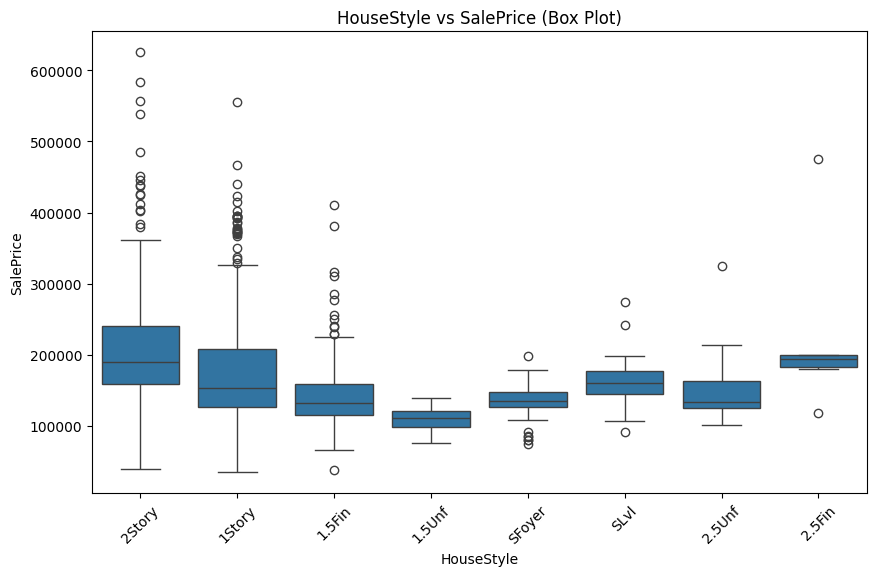

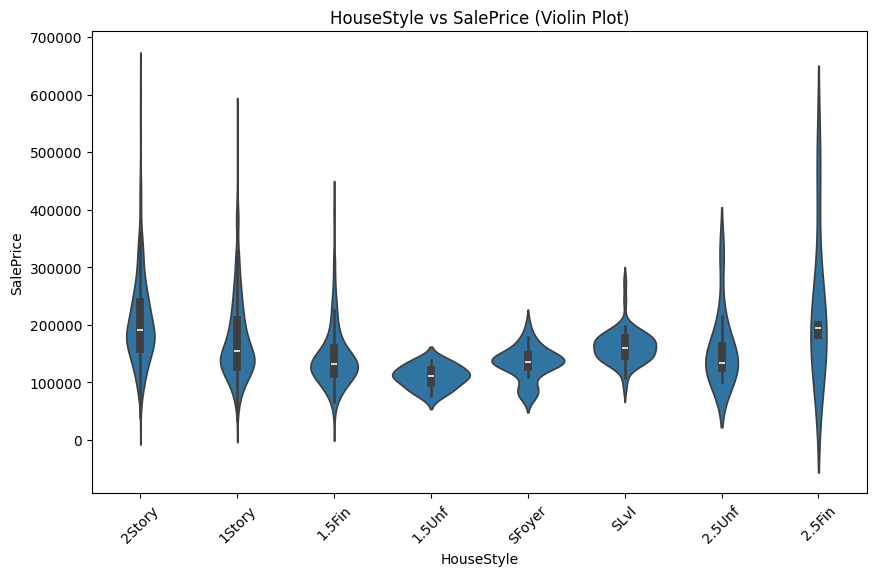


--- RoofStyle ---
Value Counts:
RoofStyle
Gable      1097
Hip         272
Flat         12
Gambrel      11
Mansard       6
Shed          2
Name: count, dtype: int64

Mean/Median SalePrice by category:
                    mean    median  count     max     min
RoofStyle                                                
Shed       225000.000000  225000.0      2  260000  190000
Hip        213799.665441  174000.0    272  625000   55000
Flat       188000.000000  182500.0     12  268000   82000
Gable      170304.643573  159000.0   1097  475000   34900
Mansard    166333.333333  163500.0      6  242000  100000
Gambrel    148909.090909  139000.0     11  259500   40000


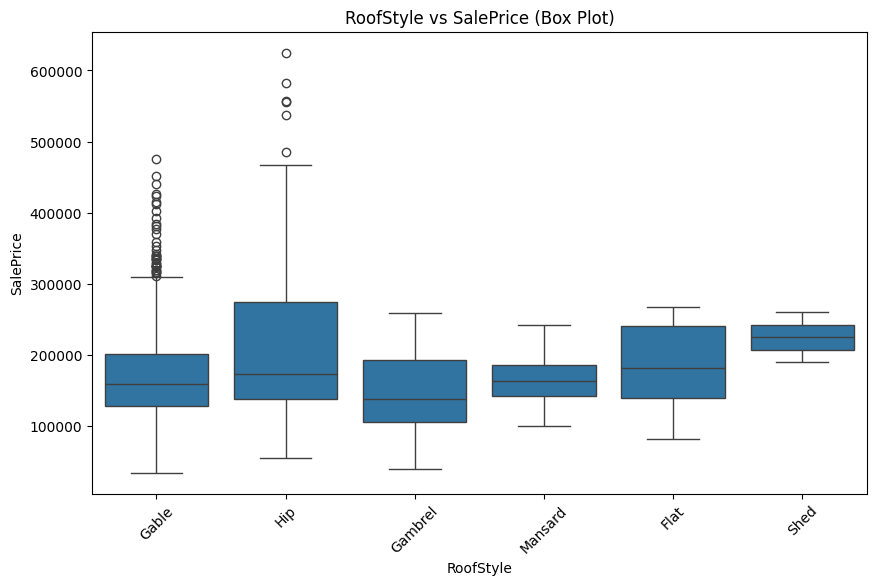

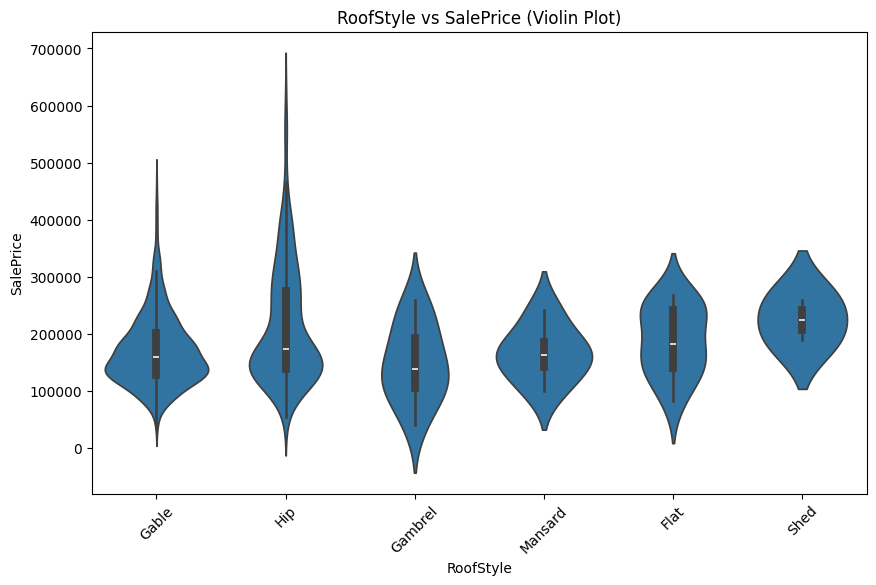


--- Exterior1st ---
Value Counts:
Exterior1st
VinylSd    497
HdBoard    218
MetalSd    211
Wd Sdng    196
Plywood    101
CemntBd     57
BrkFace     48
WdShing     25
Stucco      21
AsbShng     19
BrkComm      2
Stone        2
AsphShn      1
ImStucc      1
CBlock       1
Name: count, dtype: int64

Mean/Median SalePrice by category:
                      mean    median  count     max     min
Exterior1st                                                
ImStucc      262000.000000  262000.0      1  262000  262000
Stone        258500.000000  258500.0      2  287000  230000
CemntBd      232726.842105  241000.0     57  556581   75000
VinylSd      212176.808853  200000.0    497  582933   37900
BrkFace      190513.541667  165750.0     48  375000   40000
Plywood      171488.188119  165000.0    101  320000   82500
HdBoard      160042.174312  149425.0    218  625000   83000
Stucco       156846.238095  140000.0     21  381000   58500
MetalSd      148208.431280  138500.0    211  392000   62383
Wd Sdn

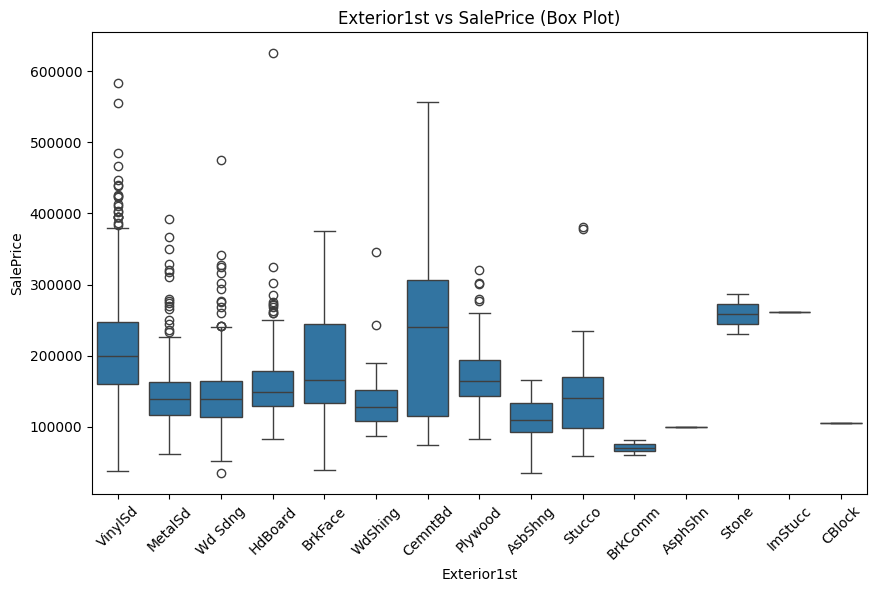

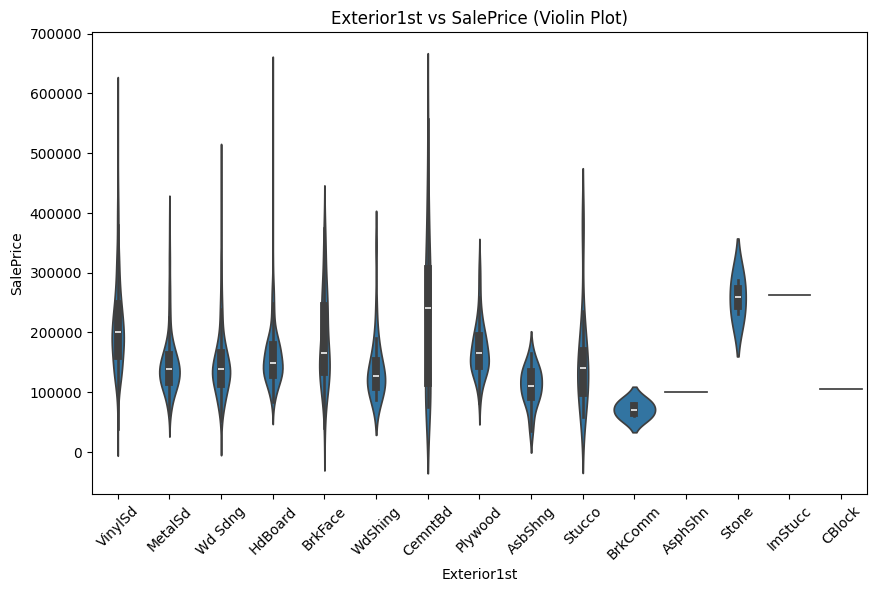


--- Exterior2nd ---
Value Counts:
Exterior2nd
VinylSd    486
MetalSd    205
HdBoard    203
Wd Sdng    189
Plywood    135
CmentBd     56
Wd Shng     37
BrkFace     23
Stucco      22
AsbShng     19
ImStucc      9
Brk Cmn      7
Stone        4
AsphShn      3
Other        1
CBlock       1
Name: count, dtype: int64

Mean/Median SalePrice by category:
                      mean    median  count     max     min
Exterior2nd                                                
Other        319000.000000  319000.0      1  319000  319000
CmentBd      231034.464286  245500.0     56  556581   75000
VinylSd      212867.057613  200070.5    486  582933   37900
ImStucc      197300.000000  179200.0      9  341000   88000
BrkFace      187454.347826  160000.0     23  375000   40000
Plywood      166362.881481  158000.0    135  320000   80000
HdBoard      164492.334975  153500.0    203  625000   83000
Wd Shng      155283.783784  137450.0     37  538000   55000
Stucco       148752.500000  138000.0     22  381000

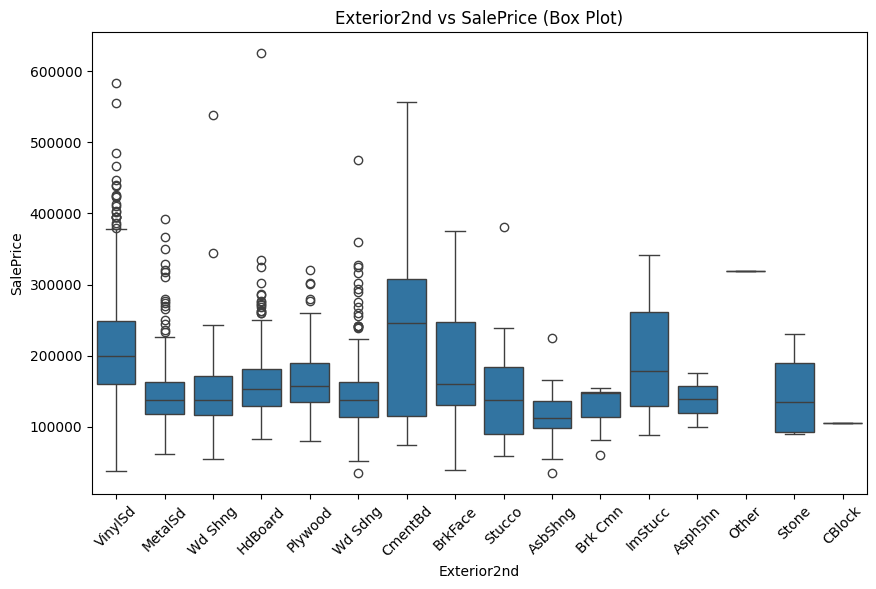

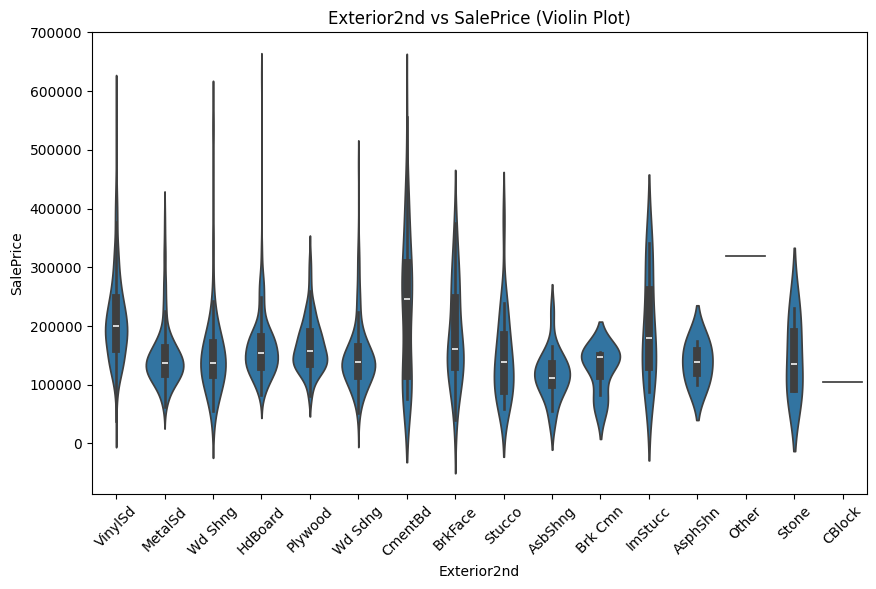


--- MasVnrType ---
Value Counts:
MasVnrType
NA         834
BrkFace    429
Stone      122
BrkCmn      15
Name: count, dtype: int64

Mean/Median SalePrice by category:
                     mean    median  count     max     min
MasVnrType                                                
Stone       262221.590164  246839.0    122  582933  119000
BrkFace     203329.680653  180500.0    429  625000   75000
NA          154562.907674  142500.0    834  475000   34900
BrkCmn      146318.066667  139000.0     15  277000   89471


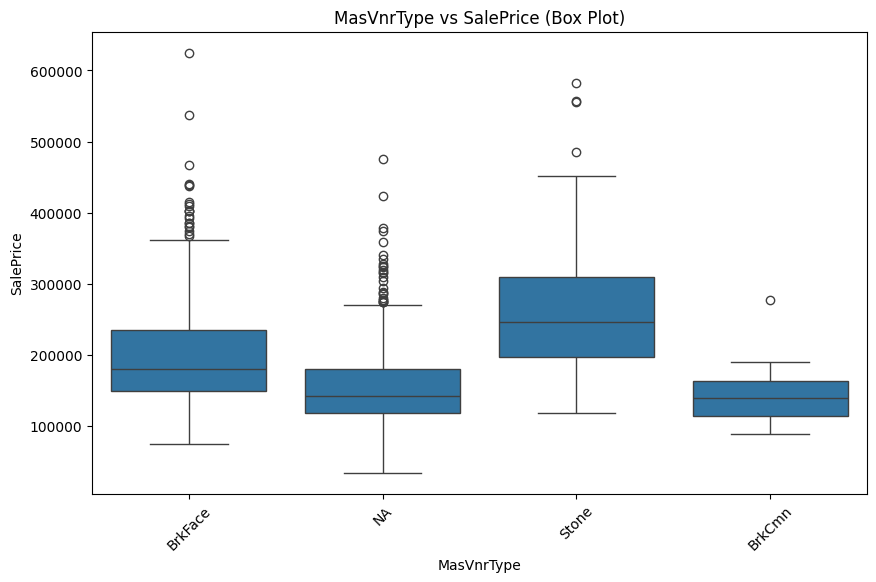

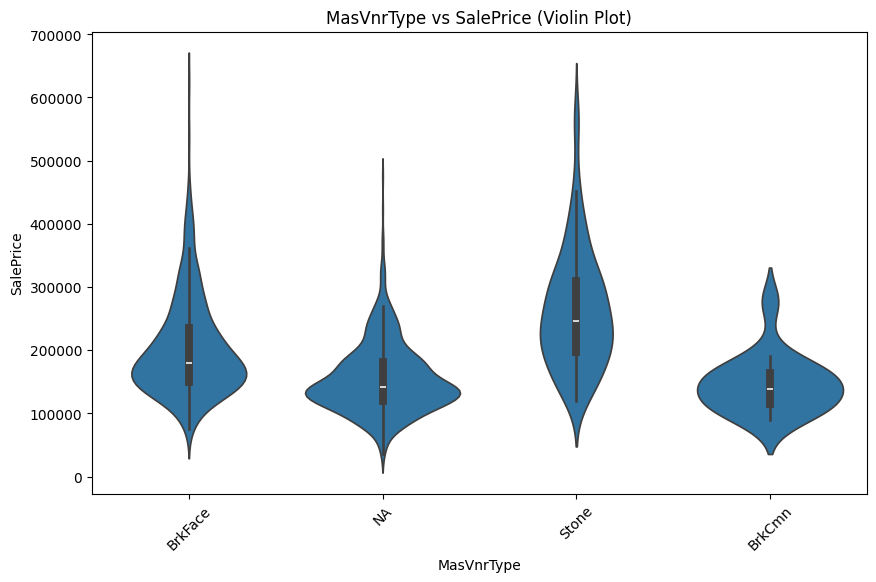


--- ExterQual ---
Value Counts:
ExterQual
TA    879
Gd    464
Ex     46
Fa     11
Name: count, dtype: int64

Mean/Median SalePrice by category:
                    mean    median  count     max     min
ExterQual                                                
Ex         357054.913043  353459.5     46  582933  176500
Gd         229235.245690  220000.0    464  625000   52000
TA         143866.359499  139000.0    879  381000   34900
Fa          97408.454545   85000.0     11  200000   55000


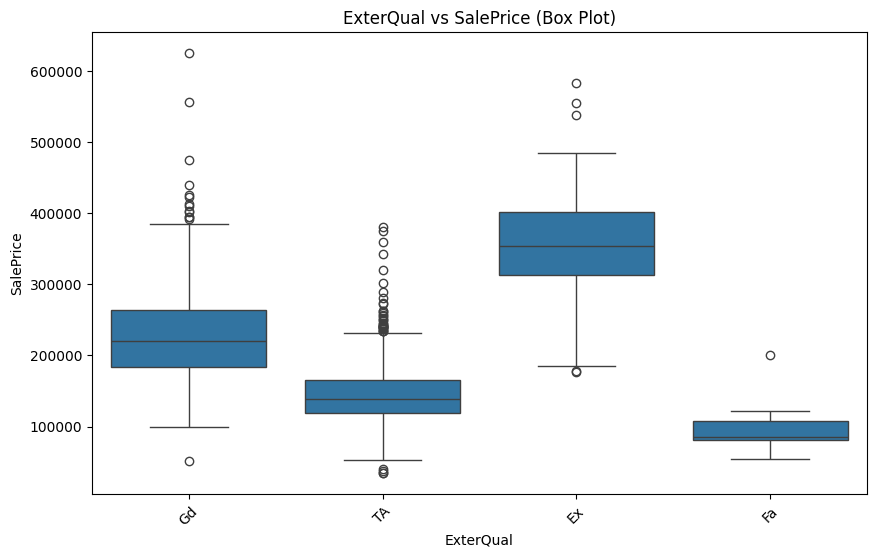

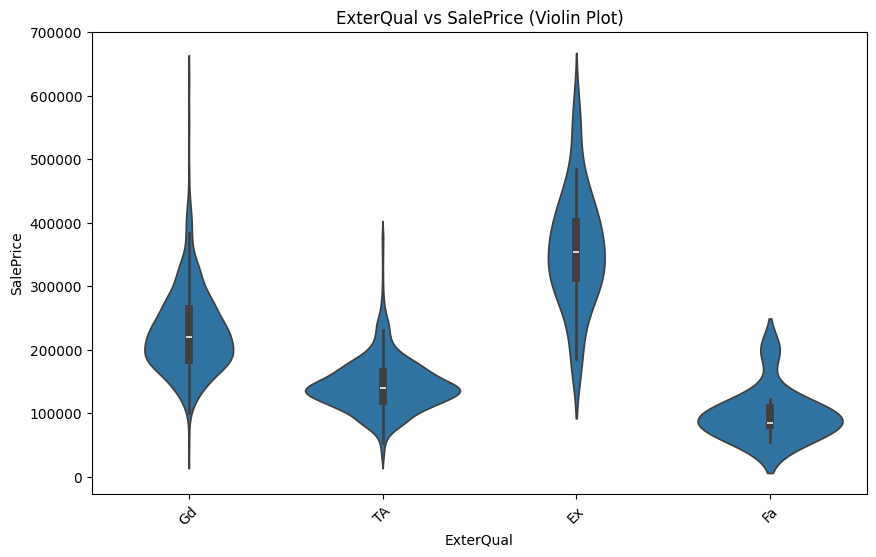


--- ExterCond ---
Value Counts:
ExterCond
TA    1235
Gd     137
Fa      25
Ex       3
Name: count, dtype: int64

Mean/Median SalePrice by category:
                    mean    median  count     max     min
ExterCond                                                
Ex         201333.333333  161000.0      3  325000  118000
TA         181325.072065  165000.0   1235  582933   34900
Gd         168371.350365  148000.0    137  625000   68400
Fa         108494.560000  115000.0     25  169500   40000


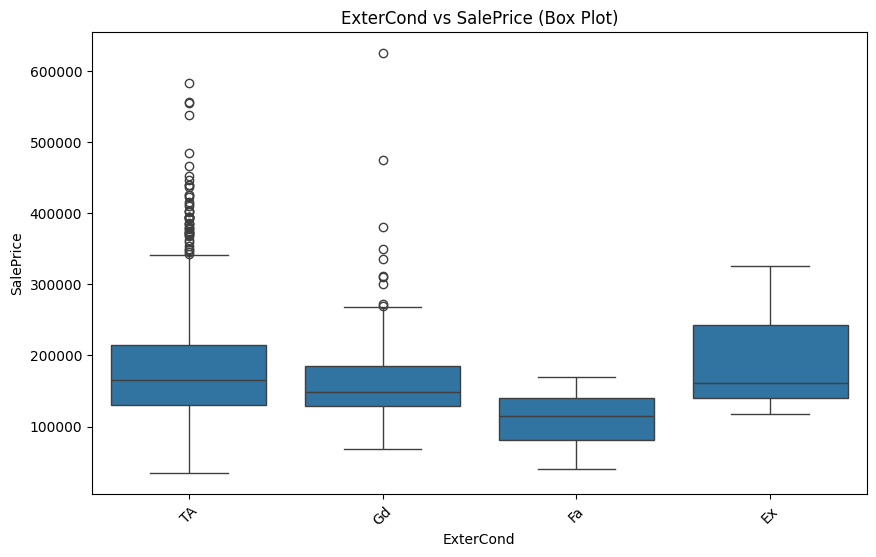

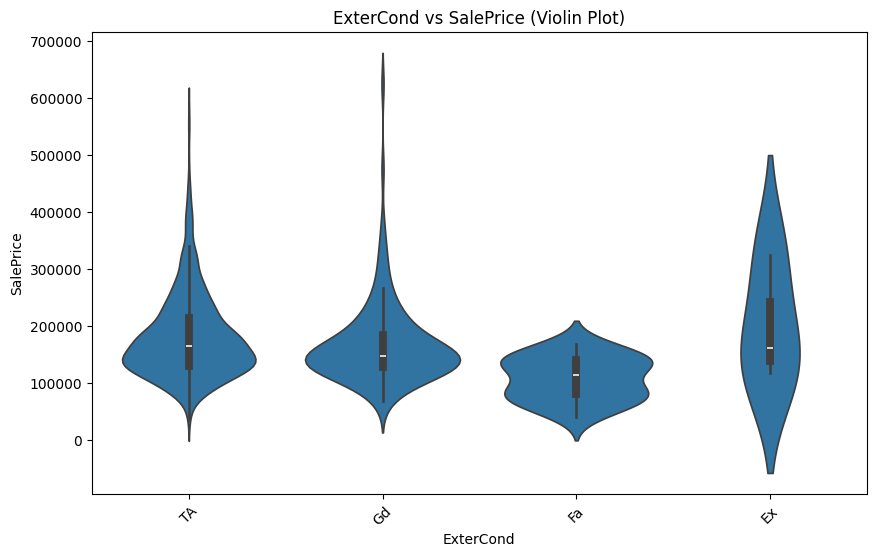


--- Foundation ---
Value Counts:
Foundation
PConc     619
CBlock    614
BrkTil    136
Slab       23
Stone       5
Wood        3
Name: count, dtype: int64

Mean/Median SalePrice by category:
                     mean    median  count     max     min
Foundation                                                
PConc       221913.735057  204900.0    619  625000   78000
Wood        185666.666667  164000.0      3  250000  143000
CBlock      148455.786645  140000.0    614  402861   34900
Stone       145955.200000  116000.0      5  266500  102776
BrkTil      132198.507353  126500.0    136  475000   37900
Slab        110325.000000  106500.0     23  198500   55000


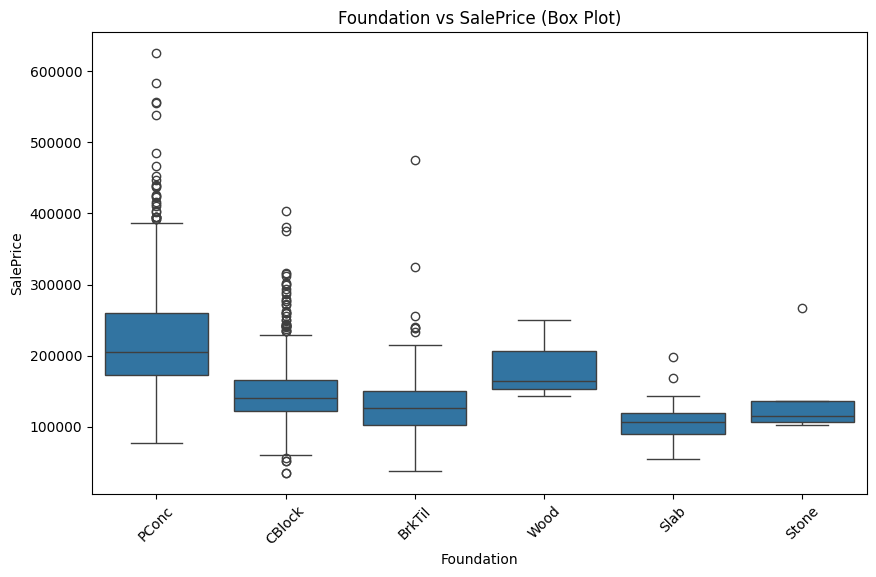

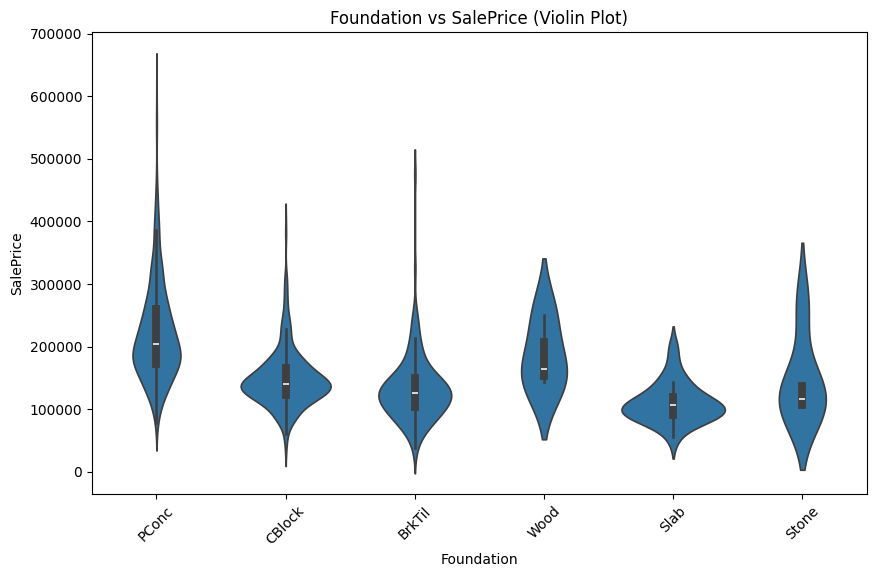


--- BsmtQual ---
Value Counts:
BsmtQual
TA    626
Gd    595
Ex    111
NA     36
Fa     32
Name: count, dtype: int64

Mean/Median SalePrice by category:
                   mean    median  count     max     min
BsmtQual                                                
Ex        315552.216216  315000.0    111  625000  123500
Gd        201550.773109  192000.0    595  538000   75500
TA        140122.234824  135250.0    626  475000   34900
Fa        118260.031250  112000.0     32  206900   67000
NA        107496.027778  104025.0     36  198500   55000


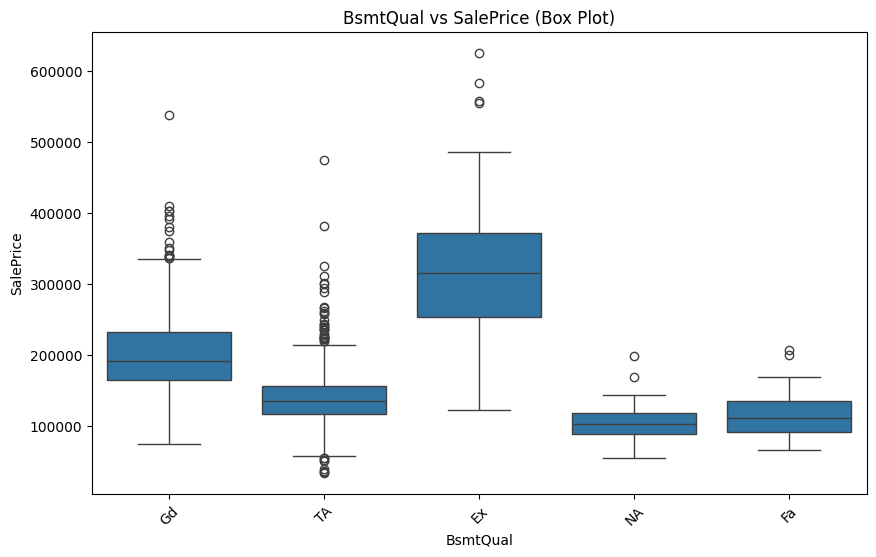

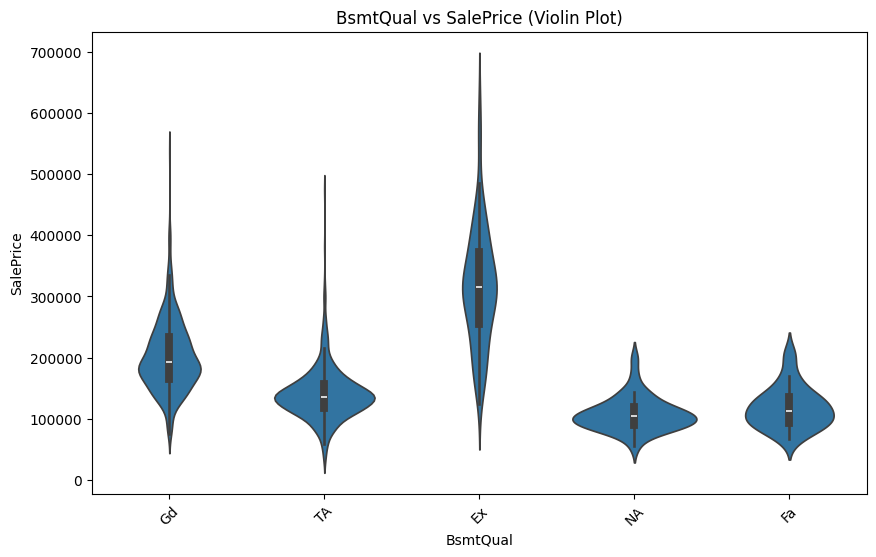


--- BsmtCond ---
Value Counts:
BsmtCond
TA    1261
Gd      61
Fa      41
NA      36
Po       1
Name: count, dtype: int64

Mean/Median SalePrice by category:
                   mean    median  count     max     min
BsmtCond                                                
Gd        210749.081967  193879.0     61  402000  119000
TA        181298.732752  164000.0   1261  625000   34900
Fa        119742.682927  117000.0     41  200000   55000
NA        107496.027778  104025.0     36  198500   55000
Po         67000.000000   67000.0      1   67000   67000


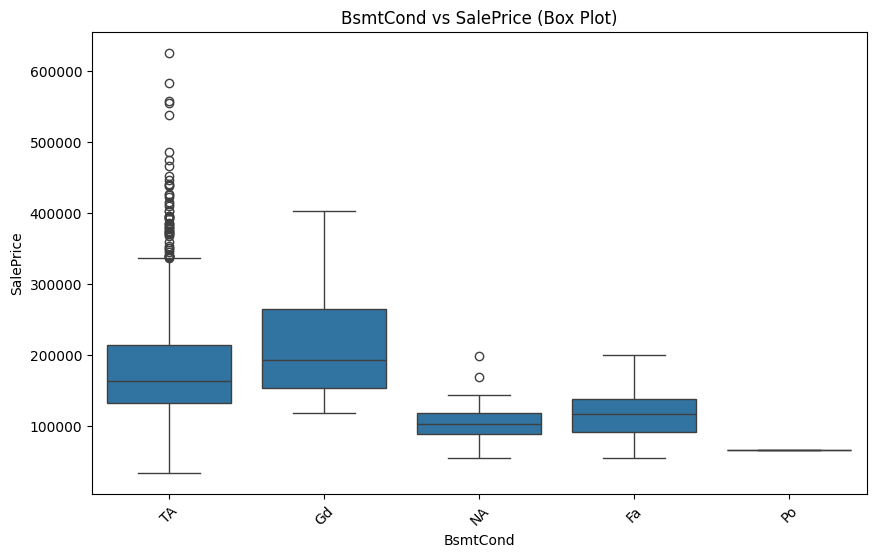

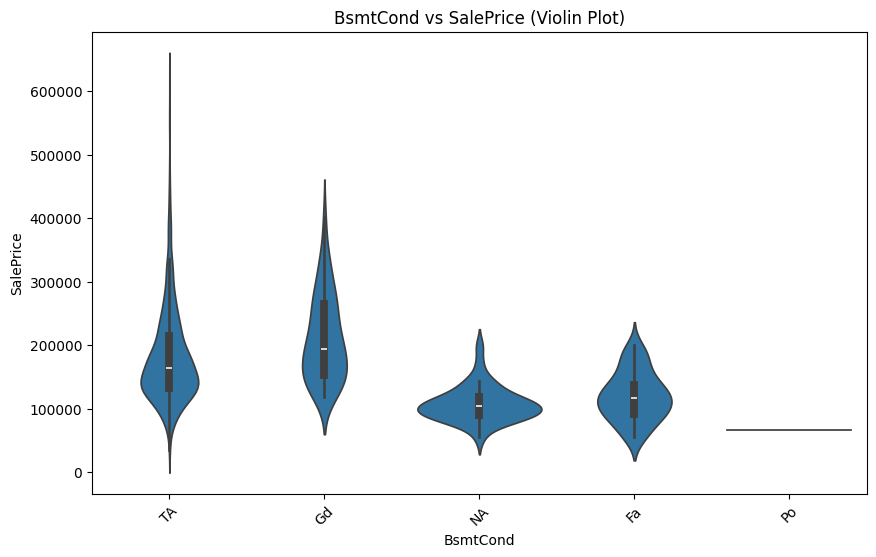


--- BsmtExposure ---
Value Counts:
BsmtExposure
No    916
Av    216
Gd    120
Mn    111
NA     37
Name: count, dtype: int64

Mean/Median SalePrice by category:
                       mean    median  count     max    min
BsmtExposure                                               
Gd            248844.175000  220750.0    120  625000  91000
Av            204334.379630  186675.0    216  556581  35311
Mn            194262.351351  185000.0    111  475000  78000
No            164516.045852  152000.0    916  485000  34900
NA            109793.432432  106250.0     37  198500  55000


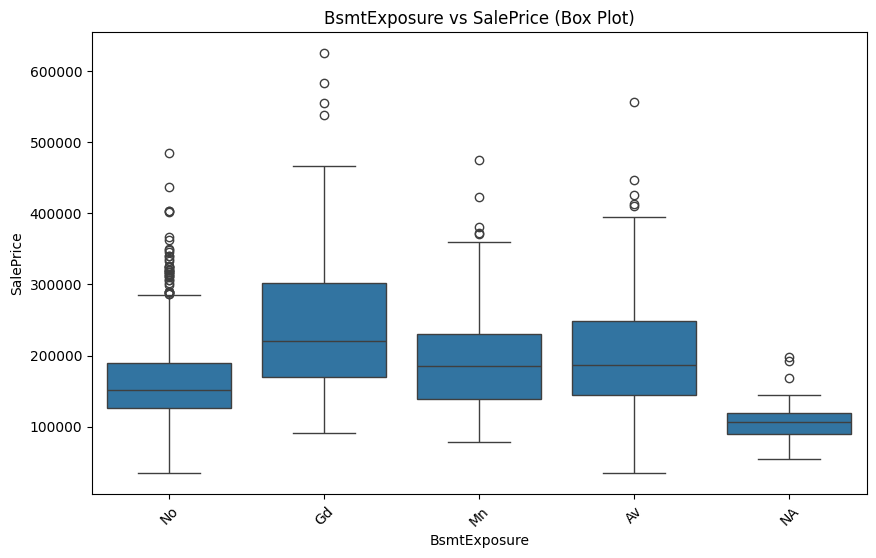

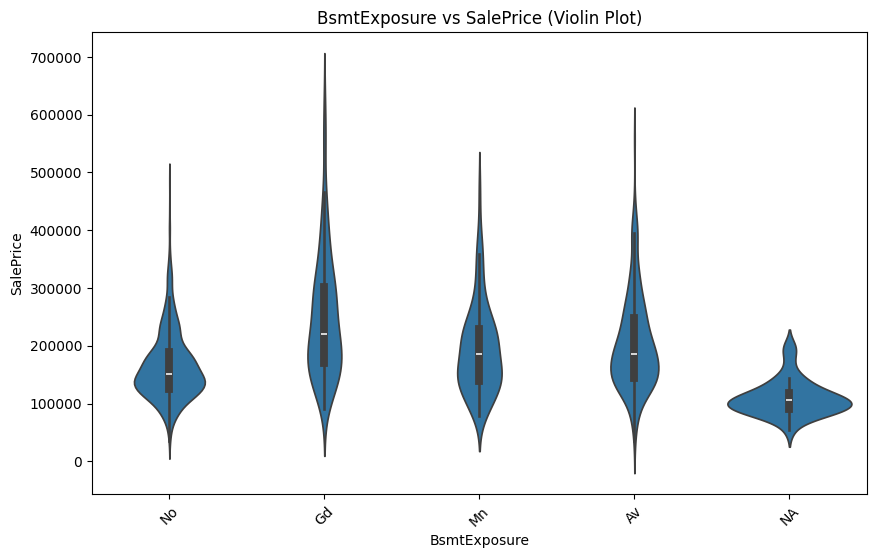


--- BsmtFinType1 ---
Value Counts:
BsmtFinType1
Unf    413
GLQ    394
ALQ    215
BLQ    143
Rec    130
LwQ     69
NA      36
Name: count, dtype: int64

Mean/Median SalePrice by category:
                       mean    median  count     max    min
BsmtFinType1                                               
GLQ           229304.352792  212450.0    394  625000  80000
Unf           171313.677966  162000.0    413  582933  37900
ALQ           160998.023256  148500.0    215  538000  81000
LwQ           150624.637681  139000.0     69  301000  75500
BLQ           148762.664336  138500.0    143  359100  35311
Rec           146697.276923  141500.0    130  381000  34900
NA            107496.027778  104025.0     36  198500  55000


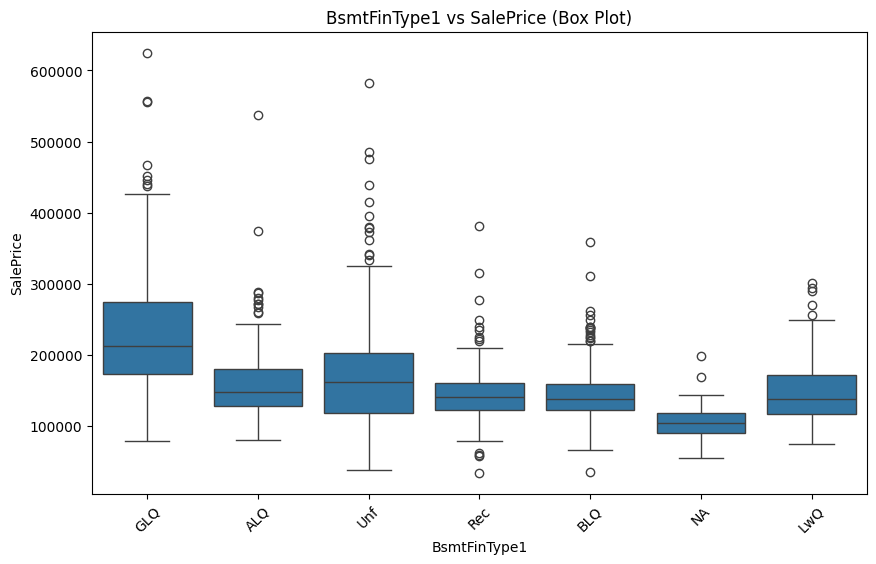

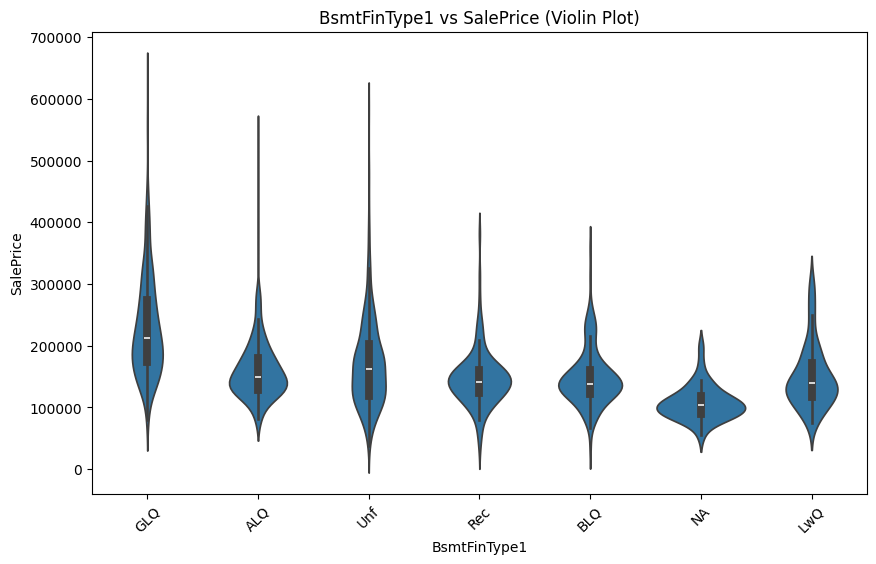


--- BsmtFinType2 ---
Value Counts:
BsmtFinType2
Unf    1203
Rec      53
LwQ      42
NA       37
BLQ      32
ALQ      19
GLQ      14
Name: count, dtype: int64

Mean/Median SalePrice by category:
                       mean    median  count     max     min
BsmtFinType2                                                
ALQ           209942.105263  174900.0     19  555000  123500
Unf           182392.425603  165000.0   1203  625000   34900
GLQ           180982.142857  203125.0     14  270000   75500
Rec           165123.113208  147000.0     53  402000   85000
LwQ           158982.142857  150950.0     42  287000   88000
BLQ           149885.406250  143000.0     32  271900   62383
NA            112266.405405  106250.0     37  284000   55000


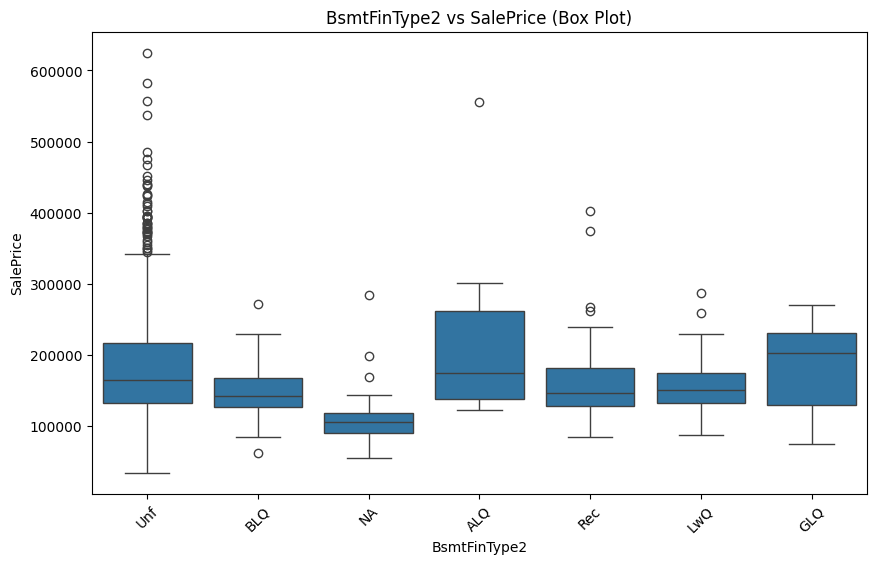

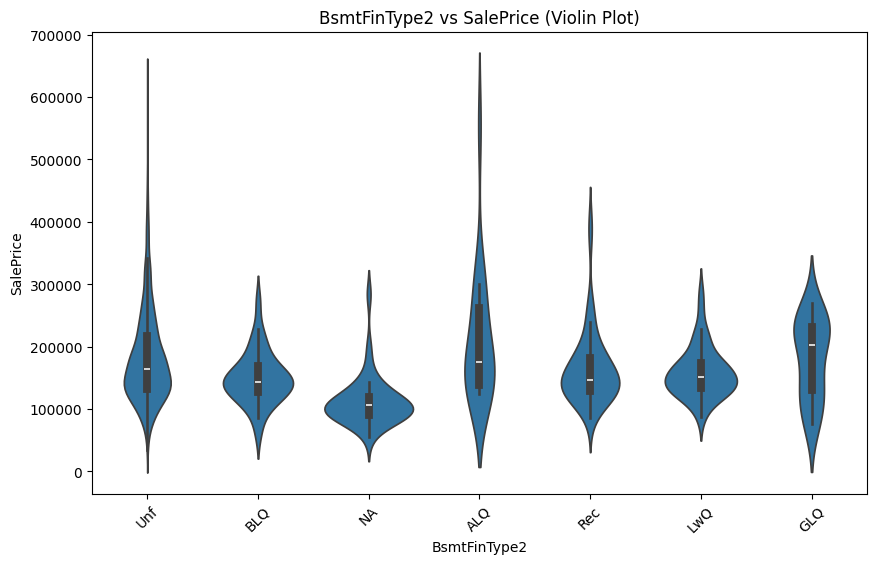


--- HeatingQC ---
Value Counts:
HeatingQC
Ex    706
TA    414
Gd    234
Fa     45
Po      1
Name: count, dtype: int64

Mean/Median SalePrice by category:
                    mean    median  count     max    min
HeatingQC                                               
Ex         211983.883853  194500.0    706  625000  66500
Gd         155705.504274  151700.0    234  395000  52000
TA         141225.212560  135000.0    414  375000  34900
Fa         125994.555556  126000.0     45  235000  37900
Po          87000.000000   87000.0      1   87000  87000


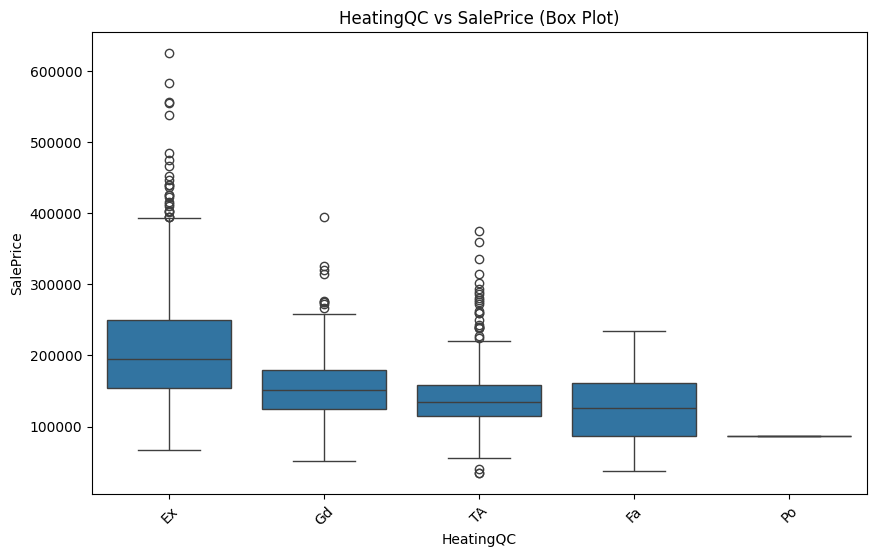

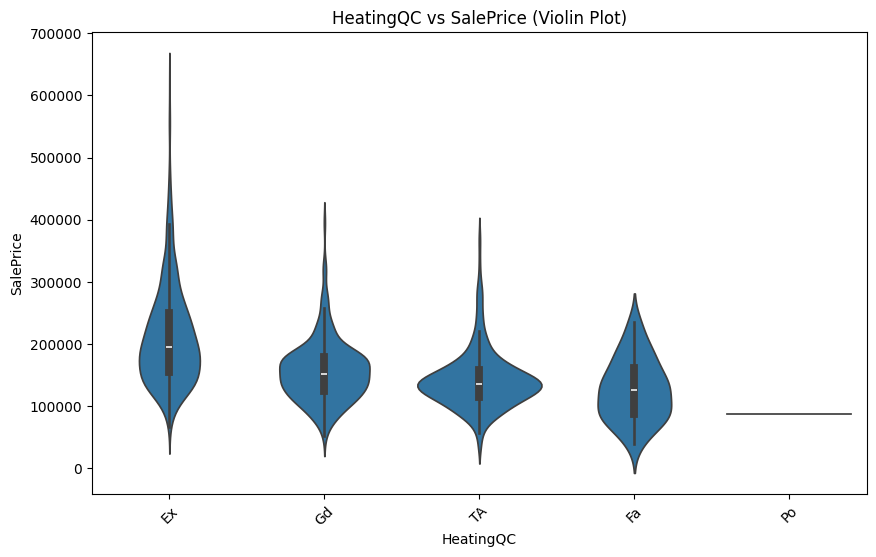


--- KitchenQual ---
Value Counts:
KitchenQual
TA    717
Gd    561
Ex     89
Fa     33
Name: count, dtype: int64

Mean/Median SalePrice by category:
                      mean    median  count     max    min
KitchenQual                                               
Ex           319384.528090  315000.0     89  582933  86000
Gd           210691.827094  201000.0    561  625000  79000
TA           139542.011158  136900.0    717  375000  34900
Fa           110446.757576  115000.0     33  200000  52500


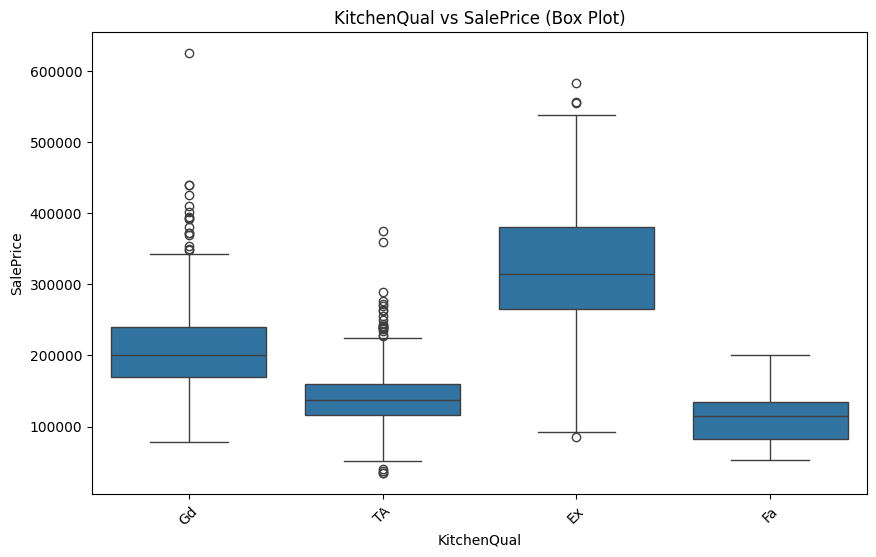

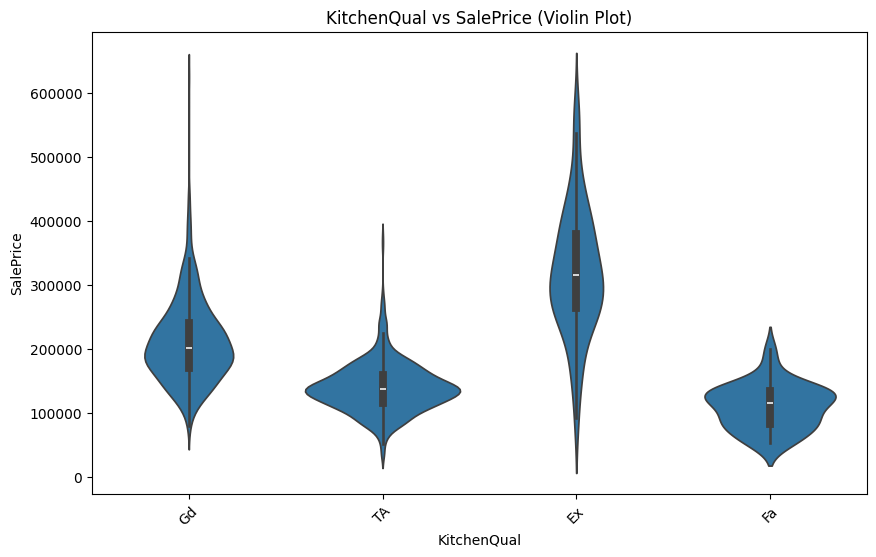


--- FireplaceQu ---
Value Counts:
FireplaceQu
NA    665
Gd    362
TA    304
Fa     31
Ex     20
Po     18
Name: count, dtype: int64

Mean/Median SalePrice by category:
                      mean    median  count     max     min
FireplaceQu                                                
Ex           323005.000000  314250.0     20  440000  130500
Gd           222737.345304  202582.5    362  582933   90350
TA           203138.414474  186600.0    304  625000   82500
Fa           165640.322581  157000.0     31  262000  117000
NA           141316.500752  135000.0    665  342643   34900
Po           131349.055556  131500.0     18  172000   62383


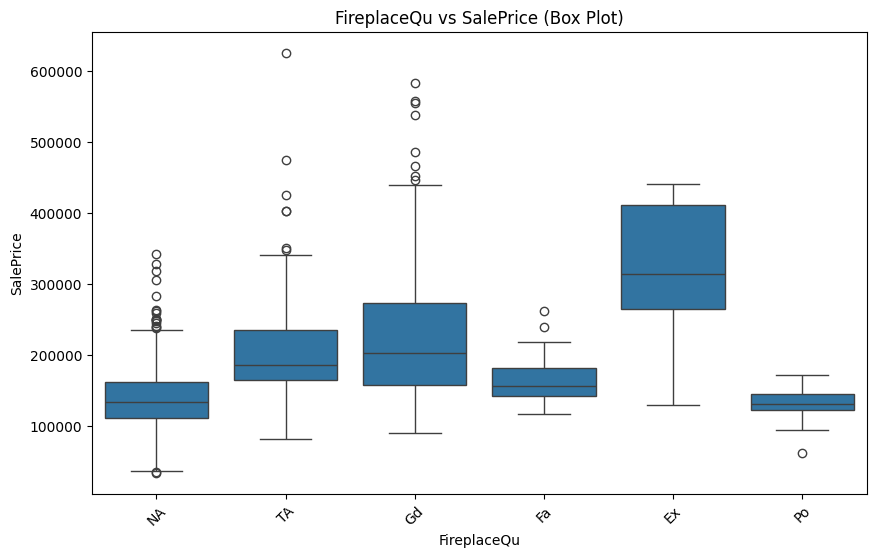

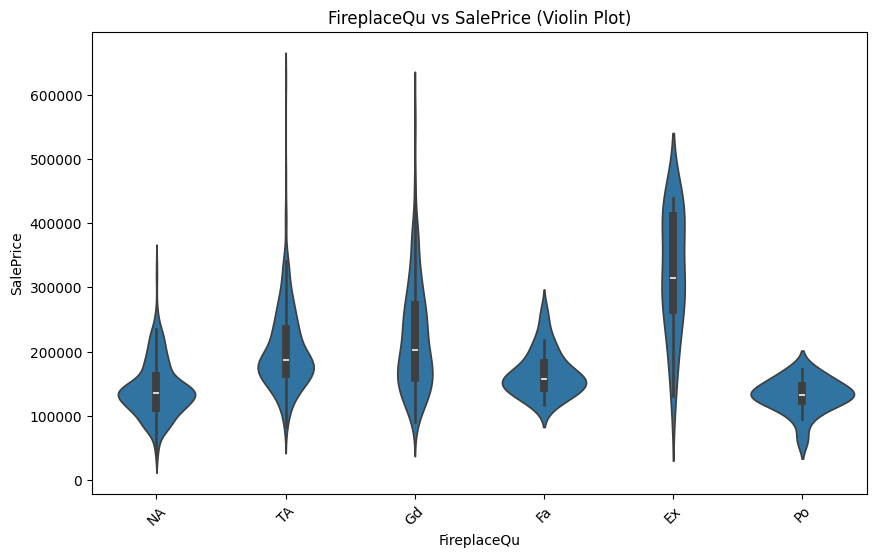


--- GarageType ---
Value Counts:
GarageType
Attchd     834
Detchd     376
BuiltIn     85
NA          72
Basment     19
CarPort      9
2Types       5
Name: count, dtype: int64

Mean/Median SalePrice by category:
                     mean    median  count     max    min
GarageType                                               
BuiltIn     256669.447059  233000.0     85  582933  91000
Attchd      199066.902878  183350.0    834  625000  60000
Basment     160570.684211  148000.0     19  359100  55993
2Types      147940.000000  150000.0      5  186700  87000
Detchd      133473.140957  129500.0    376  475000  35311
CarPort     109962.111111  108000.0      9  164900  82000
NA          104373.611111  100000.0     72  200500  34900


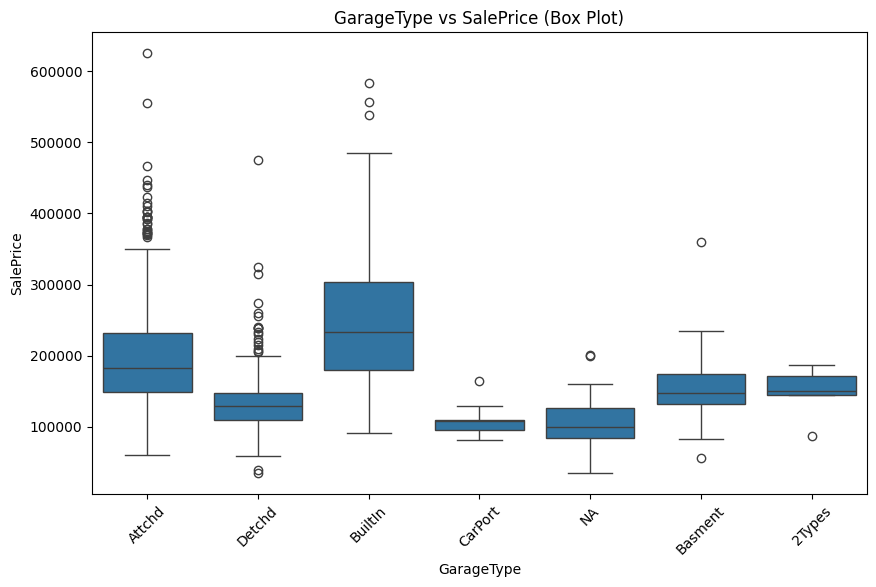

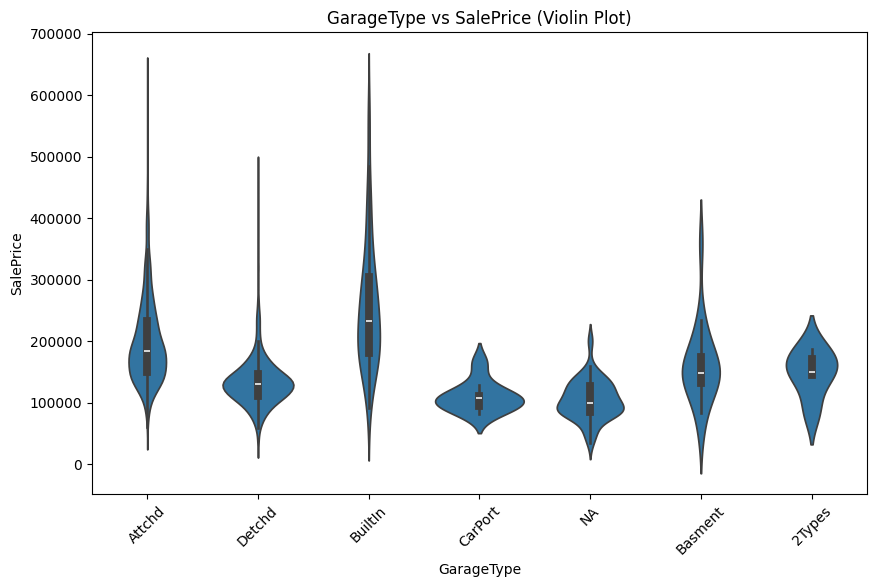


--- GarageFinish ---
Value Counts:
GarageFinish
Unf    588
RFn    411
Fin    329
NA      72
Name: count, dtype: int64

Mean/Median SalePrice by category:
                       mean    median  count     max    min
GarageFinish                                               
Fin           234236.860182  215000.0    329  625000  82500
RFn           201227.710462  190000.0    411  582933  68400
Unf           141218.175170  135000.0    588  475000  35311
NA            104373.611111  100000.0     72  200500  34900


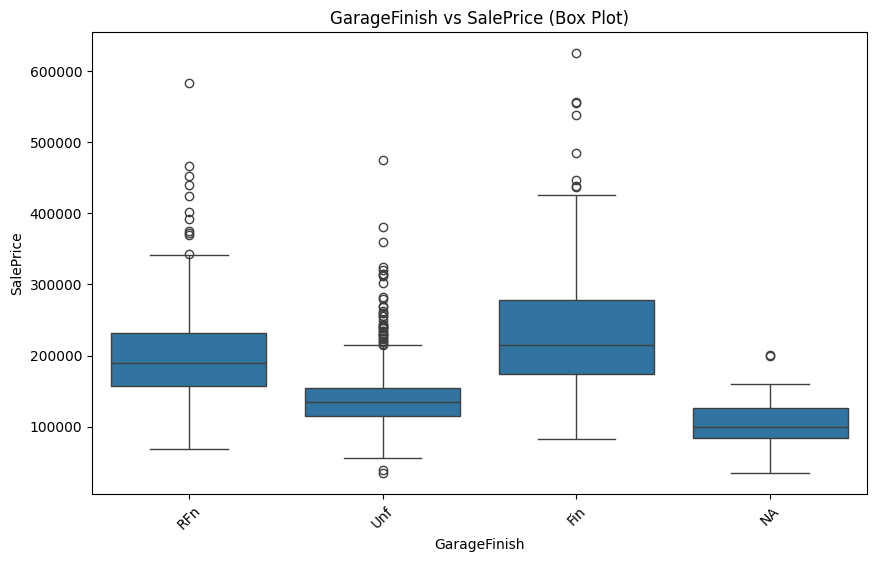

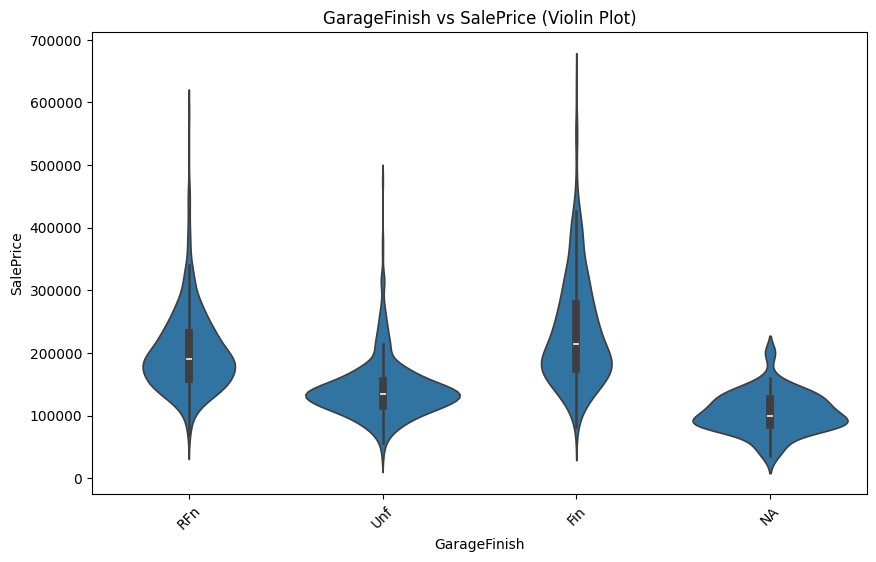


--- GarageQual ---
Value Counts:
GarageQual
TA    1264
NA      72
Fa      45
Gd      13
Ex       3
Po       3
Name: count, dtype: int64

Mean/Median SalePrice by category:
                     mean    median  count     max     min
GarageQual                                                
Ex          241000.000000  127500.0      3  475000  120500
Gd          211313.846154  185000.0     13  325000   90350
TA          184748.577532  167700.0   1264  625000   35311
Fa          122489.355556  112000.0     45  256000   64500
NA          104373.611111  100000.0     72  200500   34900
Po          100166.666667   96500.0      3  137000   67000


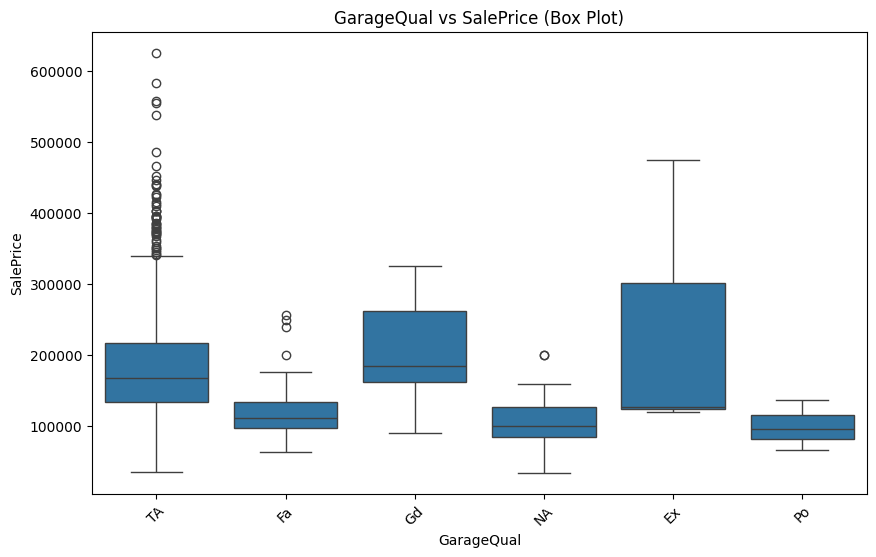

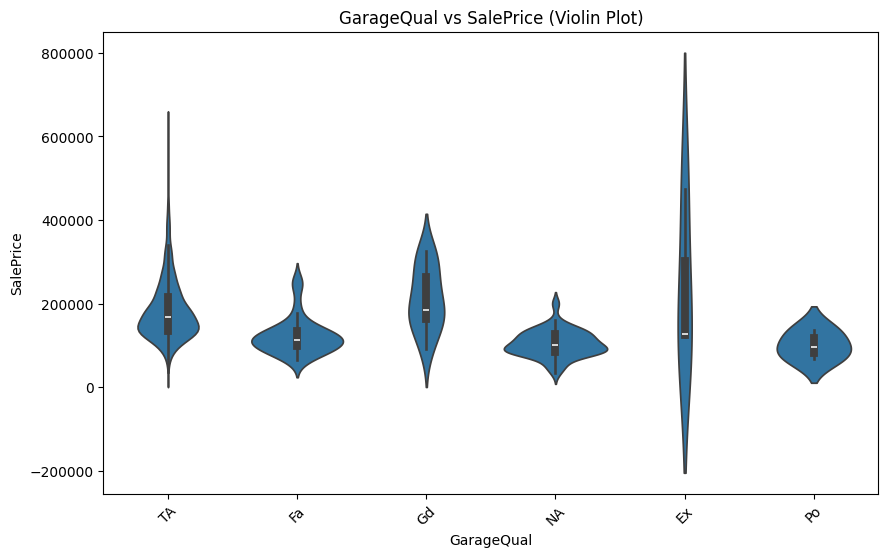


--- SaleType ---
Value Counts:
SaleType
WD       1216
New       115
COD        42
ConLD       9
ConLI       5
CWD         4
ConLw       4
Oth         3
Con         2
Name: count, dtype: int64

Mean/Median SalePrice by category:
                   mean    median  count     max     min
SaleType                                                
New       271636.495652  248328.0    115  582933  113000
Con       269600.000000  269600.0      2  324000  215200
CWD       210600.000000  188750.0      4  328900  136000
ConLI     200390.000000  125000.0      5  451950  110000
WD        171406.273026  156750.0   1216  625000   34900
ConLw     164625.000000  175750.0      4  212000   95000
COD       142877.380952  138250.0     42  287000   60000
ConLD     138780.888889  140000.0      9  235128   79900
Oth       119850.000000  116050.0      3  150000   93500


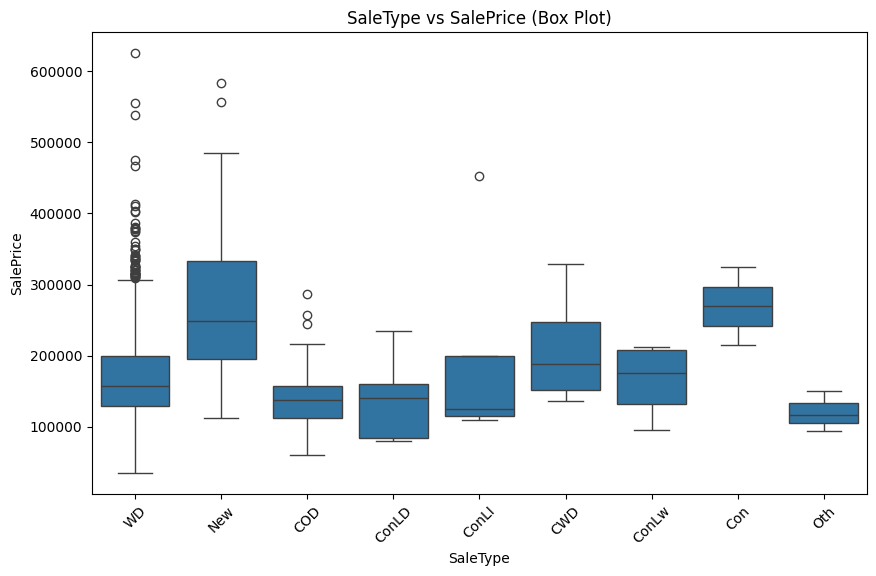

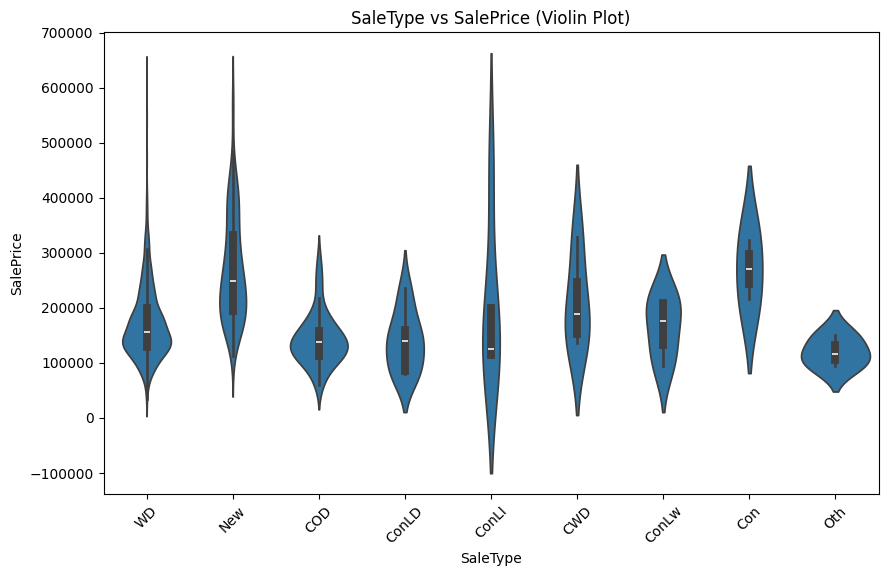


--- SaleCondition ---
Value Counts:
SaleCondition
Normal     1153
Partial     118
Abnorml      97
Family       20
Alloca        8
AdjLand       4
Name: count, dtype: int64

Mean/Median SalePrice by category:
                        mean    median  count     max     min
SaleCondition                                                
Partial        268909.533898  245589.0    118  582933  113000
Normal         173843.065048  159000.0   1153  625000   40000
Family         149600.000000  140500.0     20  259000   82500
Alloca         143454.375000  118911.0      8  359100   55993
Abnorml        140115.350515  130000.0     97  328900   34900
AdjLand        104125.000000  104000.0      4  127500   81000


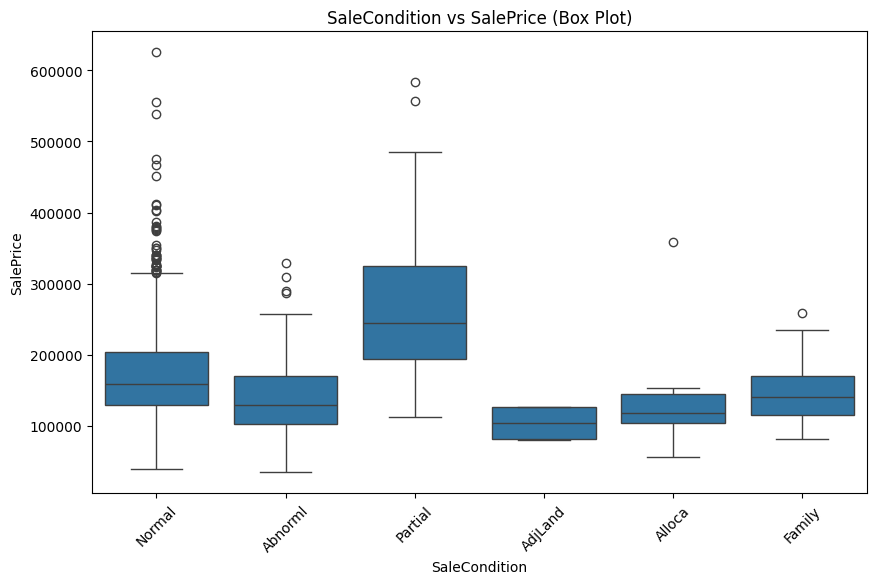

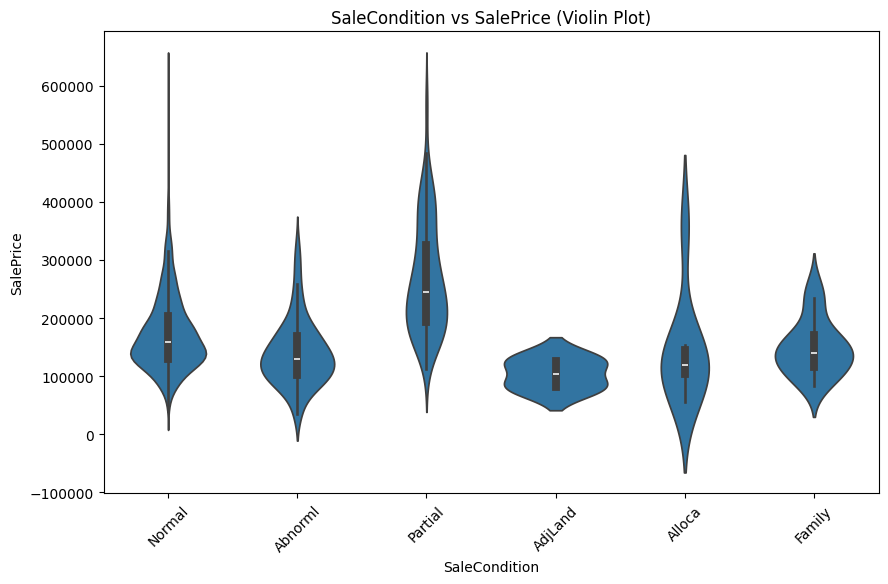

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt

cat_cols = df.select_dtypes(include='object').columns

for col in cat_cols:
    if df[col].nunique() > 20:  # Skip high-cardinality to avoid crowded plots
        print(f"\n{col}: Too many categories ({df[col].nunique()}) — check manually")
        continue
    
    print(f"\n--- {col} ---")
    
    # 1. Value counts
    print("Value Counts:")
    print(df[col].value_counts(dropna=False))
    
    # 2. Mean & median SalePrice by category
    summary = df.groupby(col)['SalePrice'].agg(['mean', 'median', 'count','max','min']).sort_values('mean', ascending=False)
    print("\nMean/Median SalePrice by category:")
    print(summary)
    
    # 3. Box plot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=col, y='SalePrice', data=df)
    plt.title(f'{col} vs SalePrice (Box Plot)')
    plt.xticks(rotation=45)
    plt.show()
    
    # 4. Violin plot (shows density + box)
    plt.figure(figsize=(10, 6))
    sns.violinplot(x=col, y='SalePrice', data=df)
    plt.title(f'{col} vs SalePrice (Violin Plot)')
    plt.xticks(rotation=45)
    plt.show()

In [102]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

def quantitative_categorical_analysis(col, target='SalePrice', df=df, min_count_threshold=0):
    print(f"\n=== Quantitative Analysis for '{col}' ===")

    if col in transformations['Binary']: print("Binary Feature")
    if col in transformations['Ordinal']: print("Ordinal Feature")
    
    overall_mean = df[target].mean()
    overall_median = df[target].median()
    print(f"overall, mean: {overall_mean}, median: {overall_median}")
    
    # 1. Value Counts (Dominance & Rare)
    vc = df[col].value_counts(dropna=False)
    vc_pct = df[col].value_counts(normalize=True, dropna=False) * 100
    
    dominant_cat = vc_pct.idxmax()
    dominant_pct = vc_pct.max()
    
    rare_cats = vc_pct[vc_pct < 2]
    
    print(f"Dominant category: '{dominant_cat}' ({dominant_pct:.1f}%)")
    print(f"Rare categories (<2%): {rare_cats}")
    
    # 2. Price Statistics
    stats_df = df.groupby(col)[target].agg(
        count=('count'),
        mean=('mean'),
        median=('median'),
        std=('std'),
    ).sort_values('mean', ascending=False)
    
    # Filter low-count categories to avoid noise
    stats_df = stats_df[stats_df['count'] >= min_count_threshold]
    
    print(f"\nPrice Statistics (categories with ≥{min_count_threshold} houses):")
    print(stats_df.round(0))
    
    # 3. Spread & Separation
    price_spread = stats_df['mean'].max() - stats_df['mean'].min()
    relative_spread = (price_spread / overall_mean) * 100
    
    median_spread = stats_df['median'].max() - stats_df['median'].min()
    
    print(f"\nSpread Analysis:")
    print(f"Mean spread (max - min): ${price_spread:,.0f} ({relative_spread:.1f}% of overall mean ${overall_mean:,.0f})")
    print(f"Median spread: ${median_spread:,.0f}")
    
    if relative_spread > 50:
        print(" → VERY STRONG predictor (large price differences)")
    elif relative_spread > 30:
        print(" → STRONG predictor")
    elif relative_spread > 15:
        print(" → Moderate — worth keeping")
    else:
        print(" → Weak — consider dropping")
    
    # 4. Outliers (using IQR method)
    q1 = df.groupby(col)[target].quantile(0.25)
    q3 = df.groupby(col)[target].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    
    outlier_counts = df.groupby(col).apply(
        lambda x: ((x[target] < lower[x.name]) | (x[target] > upper[x.name])).sum()
        ,include_groups=False
    )
    
    total_outliers = outlier_counts.sum()
    print(f"Total outliers: {total_outliers} ({total_outliers/len(df)*100:.1f}% of data)")
    
    # 5. Statistical Significance (ANOVA)
    groups = [group[target].dropna() for name, group in df.groupby(col) if len(group) >= min_count_threshold]
    if len(groups) >= 2:
        f_stat, p_val = stats.f_oneway(*groups)
        # Approximate eta-squared
        n = len(df)
        k = len(groups)
        eta_sq = f_stat / (f_stat + (n - k))
        print(f"\nANOVA Test: F = {f_stat:.2f}, p = {p_val:.2e}, η² = {eta_sq:.4f}")
        if p_val < 0.001 and eta_sq > 0.05:
            print(" → Statistically VERY significant — powerful feature")
        elif p_val < 0.05 and eta_sq > 0.02:
            print(" → Statistically significant — good feature")
        else:
            print(" → Not significant — weak feature")
    else:
        print("\nANOVA skipped: too few groups")

    # 6. Overlap Analysis
    ranges = df.groupby(col)[target].agg(['min', 'max'])
    
    def compute_overlap(range_a, range_b):
        min_a, max_a = range_a
        min_b, max_b = range_b
        overlap = max(0, min(max_a, max_b) - max(min_a, min_b))
        length_a = max_a - min_a
        return (overlap / length_a) * 100 if length_a > 0 else 0
    
    overlap_avg = []
    for cat in ranges.index:
        cat_range = ranges.loc[cat]
        overlaps = [compute_overlap(cat_range, ranges.loc[other]) for other in ranges.index if other != cat]
        avg_overlap = np.mean(overlaps)
        overlap_avg.append(avg_overlap)
    
    col_avg_overlap = np.mean(overlap_avg)
    print(f"\nOverlap Analysis (average % overlap with other categories): {col_avg_overlap:.1f}%")
    if col_avg_overlap < 30:
        print(" → Low overlap — strong separation — powerful feature")
    elif col_avg_overlap < 60:
        print(" → Moderate overlap — good feature")
    else:
        print(" → High overlap — weak separation")

    # 8. Plot Box and Violin
    unique = df[col].nunique()
    fig, axes = plt.subplots(1, 2, figsize=(max(10, unique * 0.6), 6))
    
    sns.boxplot(x=col, y=target, data=df, ax=axes[0])
    axes[0].set_title(f'{col} vs {target} — Box Plot')
    axes[0].tick_params(axis='x', rotation=45)

    sns.violinplot(x=col, y=target, data=df, ax=axes[1])
    axes[1].set_title(f'{col} vs {target} — Violin Plot')
    axes[1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

In [103]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition',
       'SalePrice'],
      dtype

In [104]:
#example analysis MSZoning
#highly imbalanced
#highest count cat is far from mean or median -> good
#spread is misleading as exterme distance
#Rare Categories driving price on the extreme -> ideal
#no other category capsulates this aspect
#spread is almost as much as mean and median -> good
#less outliers
#good results on annova test
#56% overlap not bad
#not in transformation

In [105]:
transformations

{'Binary': ['BsmtFinType2',
  'BsmtExposure',
  'SaleType',
  'Condition1',
  'BsmtCond',
  'BldgType',
  'ExterCond',
  'GarageQual',
  'SaleCondition',
  'RoofStyle'],
 'Skew': ['LotFrontage',
  'LotArea',
  'MasVnrArea',
  'BsmtFinSF1',
  'TotalBsmtSF',
  'WoodDeckSF',
  'OpenPorchSF',
  'BsmtFinSF2',
  'BsmtUnfSF',
  'EnclosedPorch',
  '3SsnPorch',
  'ScreenPorch',
  'PoolArea',
  'eng_totalBsmtArea',
  'eng_totalporchsf'],
 'Ordinal': ['OverallQual',
  'MasVnrType',
  'ExterQual',
  'BsmtQual',
  'FullBath',
  'KitchenQual',
  'Fireplaces',
  'FireplaceQu',
  'GarageFinish',
  'GarageCars']}


=== Quantitative Analysis for 'MSZoning' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'RL' (79.1%)
Rare categories (<2%): MSZoning
RH         1.071429
C (all)    0.714286
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
          count      mean    median      std
MSZoning                                    
FV           61  215558.0  208300.0  53617.0
RL         1107  188491.0  173000.0  74787.0
RH           15  130662.0  133000.0  36781.0
RM          207  124668.0  120000.0  46491.0
C (all)      10   74528.0   74700.0  33791.0

Spread Analysis:
Mean spread (max - min): $141,030 (78.9% of overall mean $178,800)
Median spread: $133,600
 → VERY STRONG predictor (large price differences)
Total outliers: 51 (3.6% of data)

ANOVA Test: F = 47.79, p = 1.06e-37, η² = 0.0331
 → Statistically significant — good feature

Overlap Analysis (average % overlap with other categories): 55.1%
 → Moderate overlap — good feature


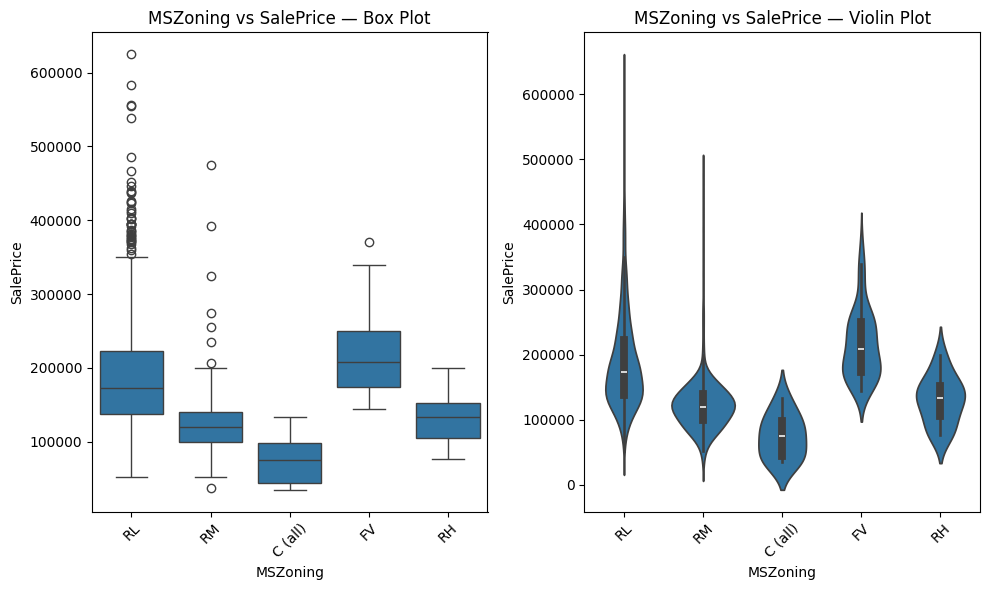


=== Quantitative Analysis for 'LotShape' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Reg' (63.7%)
Rare categories (<2%): LotShape
IR3    0.642857
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
          count      mean    median      std
LotShape                                    
IR2          41  239833.0  221000.0  99669.0
IR3           9  222263.0  215000.0  85020.0
IR1         458  200921.0  187500.0  73498.0
Reg         892  164198.0  145000.0  69158.0

Spread Analysis:
Mean spread (max - min): $75,636 (42.3% of overall mean $178,800)
Median spread: $76,000
 → STRONG predictor
Total outliers: 75 (5.4% of data)

ANOVA Test: F = 37.82, p = 1.68e-23, η² = 0.0264
 → Statistically significant — good feature

Overlap Analysis (average % overlap with other categories): 83.3%
 → High overlap — weak separation


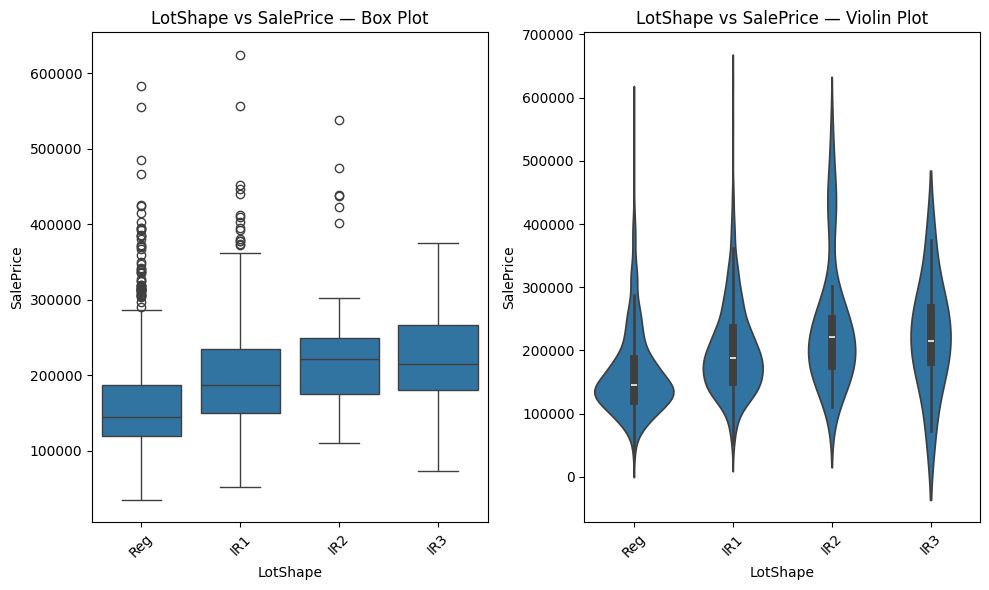


=== Quantitative Analysis for 'LandContour' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Lvl' (90.0%)
Rare categories (<2%): Series([], Name: proportion, dtype: float64)

Price Statistics (categories with ≥0 houses):
             count      mean    median       std
LandContour                                     
HLS             48  230297.0  222250.0  100938.0
Low             32  208703.0  202500.0   72789.0
Lvl           1260  177884.0  160100.0   73166.0
Bnk             60  140888.0  136200.0   49269.0

Spread Analysis:
Mean spread (max - min): $89,409 (50.0% of overall mean $178,800)
Median spread: $86,050
 → VERY STRONG predictor (large price differences)
Total outliers: 53 (3.8% of data)

ANOVA Test: F = 15.04, p = 1.23e-09, η² = 0.0107
 → Not significant — weak feature

Overlap Analysis (average % overlap with other categories): 78.6%
 → High overlap — weak separation


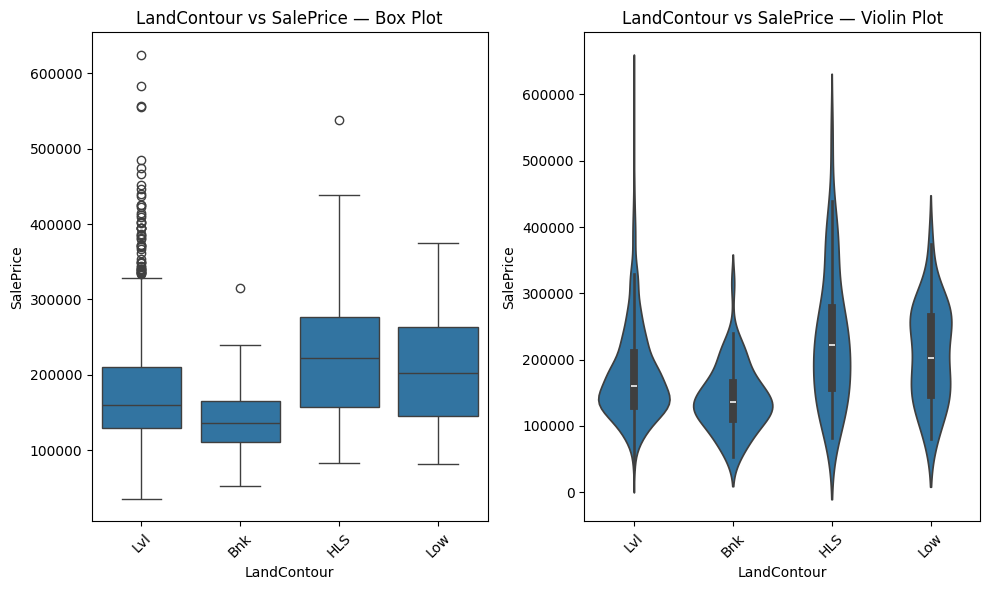


=== Quantitative Analysis for 'LotConfig' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Inside' (71.9%)
Rare categories (<2%): LotConfig
FR3    0.285714
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
           count      mean    median      std
LotConfig                                    
CulDSac       90  221021.0  197900.0  90110.0
FR3            4  208475.0  195450.0  78379.0
FR2           47  177935.0  165000.0  62789.0
Corner       252  176391.0  159500.0  67910.0
Inside      1007  175552.0  158000.0  74030.0

Spread Analysis:
Mean spread (max - min): $45,470 (25.4% of overall mean $178,800)
Median spread: $39,900
 → Moderate — worth keeping
Total outliers: 57 (4.1% of data)

ANOVA Test: F = 8.09, p = 1.91e-06, η² = 0.0058
 → Not significant — weak feature

Overlap Analysis (average % overlap with other categories): 79.2%
 → High overlap — weak separation


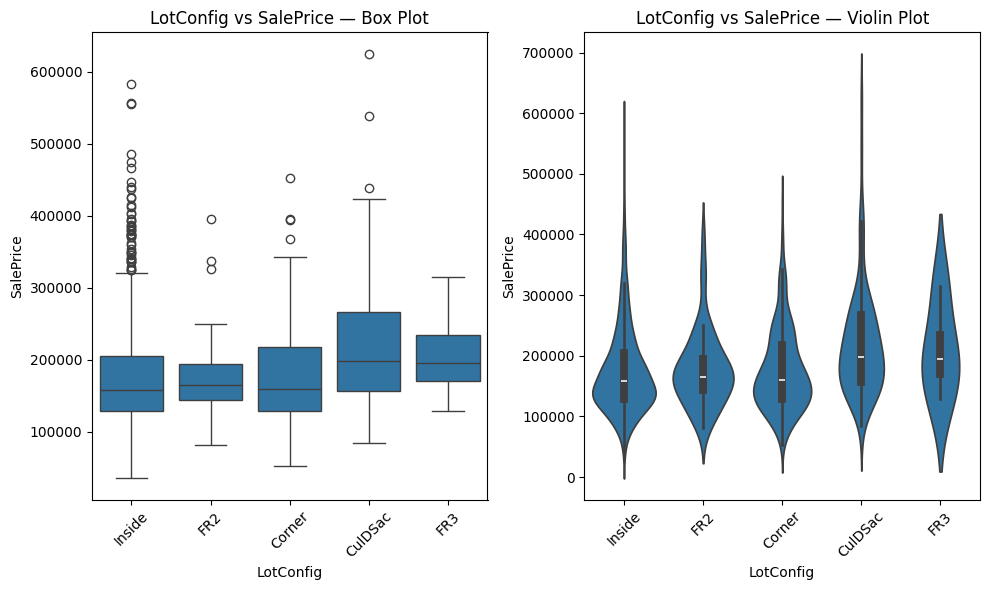


=== Quantitative Analysis for 'Neighborhood' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'NAmes' (15.6%)
Rare categories (<2%): Neighborhood
ClearCr    1.928571
SWISU      1.785714
StoneBr    1.642857
Blmngtn    1.214286
MeadowV    1.214286
BrDale     1.142857
Veenker    0.714286
NPkVill    0.642857
Blueste    0.142857
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
              count      mean    median       std
Neighborhood                                     
NoRidge          37  310848.0  290000.0   77130.0
NridgHt          73  310441.0  314813.0   90409.0
StoneBr          23  299270.0  275000.0  109192.0
Timber           37  239741.0  228000.0   63846.0
Somerst          82  227083.0  226850.0   56924.0
Veenker          10  224150.0  206000.0   56620.0
ClearCr          27  213401.0  200500.0   50990.0
Crawfor          48  212057.0  208550.0   70345.0
CollgCr         147  197741.0  196500.0   51824.0
Blmngtn          

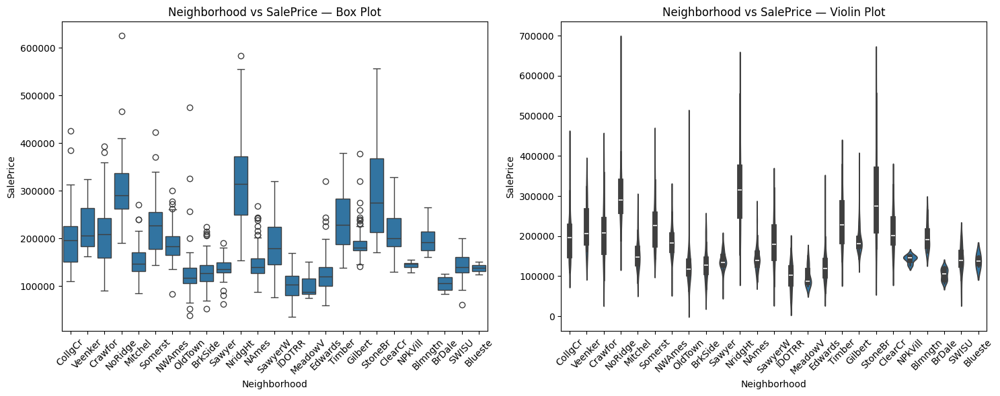


=== Quantitative Analysis for 'HouseStyle' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: '1Story' (49.9%)
Rare categories (<2%): HouseStyle
1.5Unf    1.000000
2.5Unf    0.785714
2.5Fin    0.428571
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
            count      mean    median       std
HouseStyle                                     
2.5Fin          6  226833.0  194000.0  125266.0
2Story        420  208273.0  190000.0   80546.0
1Story        699  173966.0  153500.0   72328.0
SLvl           61  161832.0  160000.0   28545.0
2.5Unf         11  157355.0  133900.0   63934.0
1.5Fin        153  143438.0  132500.0   54309.0
SFoyer         36  133096.0  135480.0   28402.0
1.5Unf         14  110150.0  111250.0   19036.0

Spread Analysis:
Mean spread (max - min): $116,683 (65.3% of overall mean $178,800)
Median spread: $82,750
 → VERY STRONG predictor (large price differences)
Total outliers: 69 (4.9% of data)

ANOVA Test: F = 21.

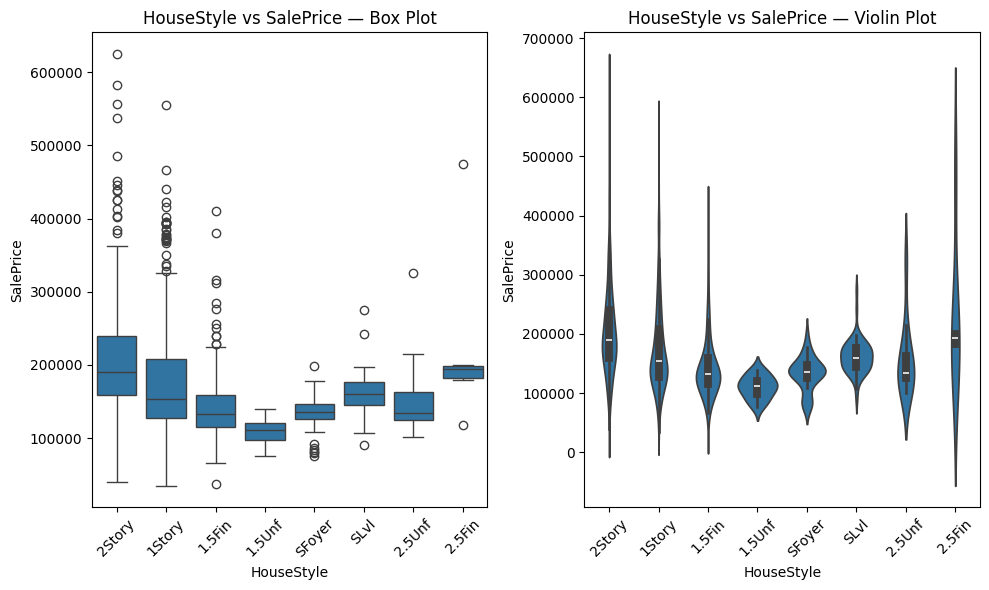


=== Quantitative Analysis for 'Exterior1st' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'VinylSd' (35.5%)
Rare categories (<2%): Exterior1st
WdShing    1.785714
Stucco     1.500000
AsbShng    1.357143
BrkComm    0.142857
Stone      0.142857
AsphShn    0.071429
ImStucc    0.071429
CBlock     0.071429
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
             count      mean    median       std
Exterior1st                                     
ImStucc          1  262000.0  262000.0       NaN
Stone            2  258500.0  258500.0   40305.0
CemntBd         57  232727.0  241000.0  124133.0
VinylSd        497  212177.0  200000.0   76638.0
BrkFace         48  190514.0  165750.0   76965.0
Plywood        101  171488.0  165000.0   45813.0
HdBoard        218  160042.0  149425.0   53325.0
Stucco          21  156846.0  140000.0   86058.0
MetalSd        211  148208.0  138500.0   53524.0
Wd Sdng        196  147637.0  138944.0   58033.0

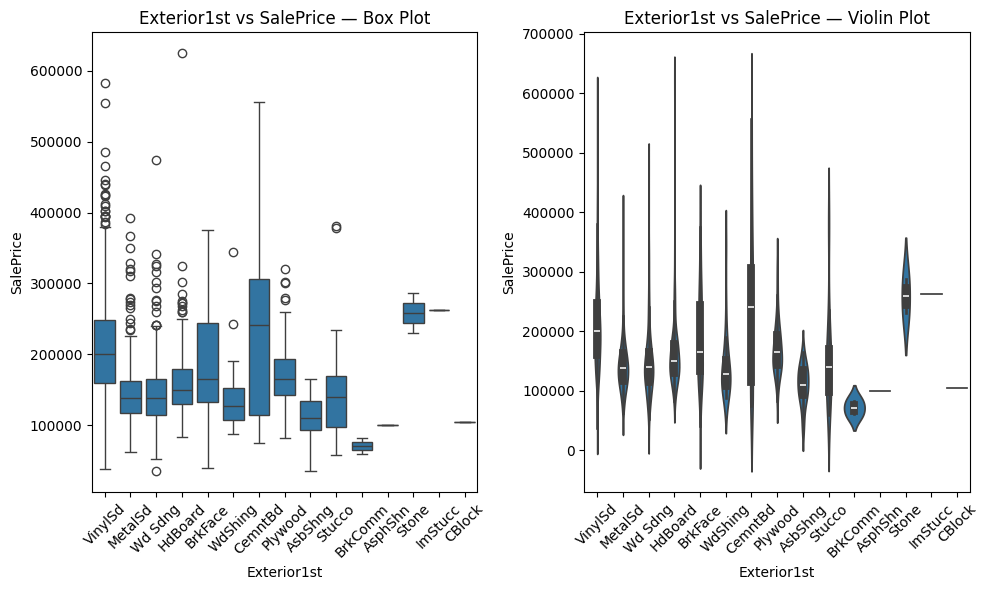


=== Quantitative Analysis for 'Exterior2nd' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'VinylSd' (34.7%)
Rare categories (<2%): Exterior2nd
BrkFace    1.642857
Stucco     1.571429
AsbShng    1.357143
ImStucc    0.642857
Brk Cmn    0.500000
Stone      0.285714
AsphShn    0.214286
Other      0.071429
CBlock     0.071429
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
             count      mean    median       std
Exterior2nd                                     
Other            1  319000.0  319000.0       NaN
CmentBd         56  231034.0  245500.0  119591.0
VinylSd        486  212867.0  200070.0   76626.0
ImStucc          9  197300.0  179200.0   90745.0
BrkFace         23  187454.0  160000.0   84972.0
Plywood        135  166363.0  158000.0   45353.0
HdBoard        203  164492.0  153500.0   57271.0
Wd Shng         37  155284.0  137450.0   81909.0
Stucco          22  148752.0  138000.0   75374.0
MetalSd        205  148571.0

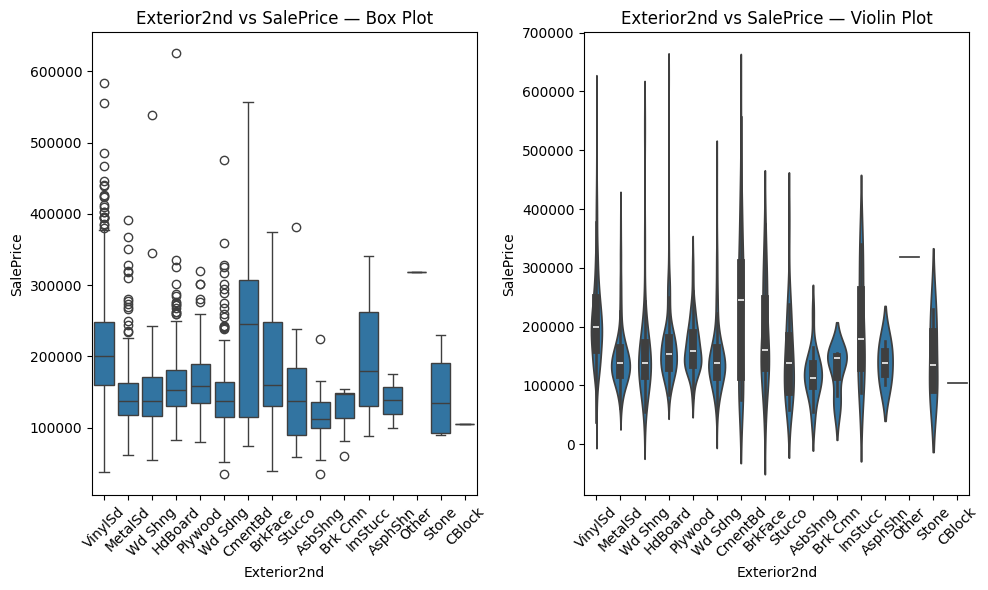


=== Quantitative Analysis for 'MasVnrType' ===
Ordinal Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'NA' (59.6%)
Rare categories (<2%): MasVnrType
BrkCmn    1.071429
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
            count      mean    median      std
MasVnrType                                    
Stone         122  262222.0  246839.0  93234.0
BrkFace       429  203330.0  180500.0  77347.0
NA            834  154563.0  142500.0  54939.0
BrkCmn         15  146318.0  139000.0  46188.0

Spread Analysis:
Mean spread (max - min): $115,904 (64.8% of overall mean $178,800)
Median spread: $107,839
 → VERY STRONG predictor (large price differences)
Total outliers: 51 (3.6% of data)

ANOVA Test: F = 121.91, p = 3.97e-70, η² = 0.0803
 → Statistically VERY significant — powerful feature

Overlap Analysis (average % overlap with other categories): 75.1%
 → High overlap — weak separation


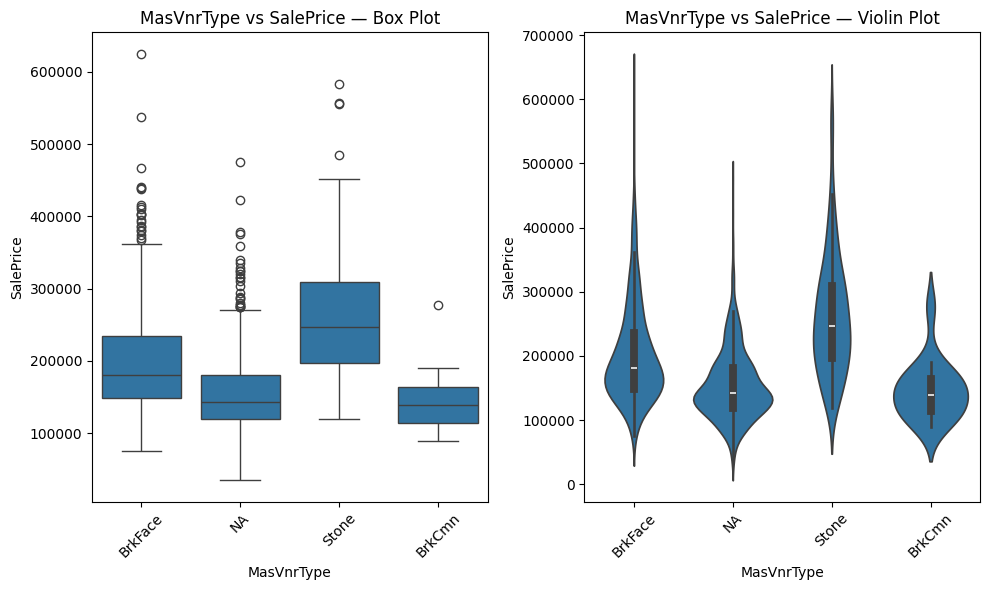


=== Quantitative Analysis for 'ExterQual' ===
Ordinal Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'TA' (62.8%)
Rare categories (<2%): ExterQual
Fa    0.785714
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
           count      mean    median      std
ExterQual                                    
Ex            46  357055.0  353460.0  90948.0
Gd           464  229235.0  220000.0  66503.0
TA           879  143866.0  139000.0  41965.0
Fa            11   97408.0   85000.0  39701.0

Spread Analysis:
Mean spread (max - min): $259,646 (145.2% of overall mean $178,800)
Median spread: $268,460
 → VERY STRONG predictor (large price differences)
Total outliers: 56 (4.0% of data)

ANOVA Test: F = 442.62, p = 4.91e-202, η² = 0.2407
 → Statistically VERY significant — powerful feature

Overlap Analysis (average % overlap with other categories): 60.2%
 → High overlap — weak separation


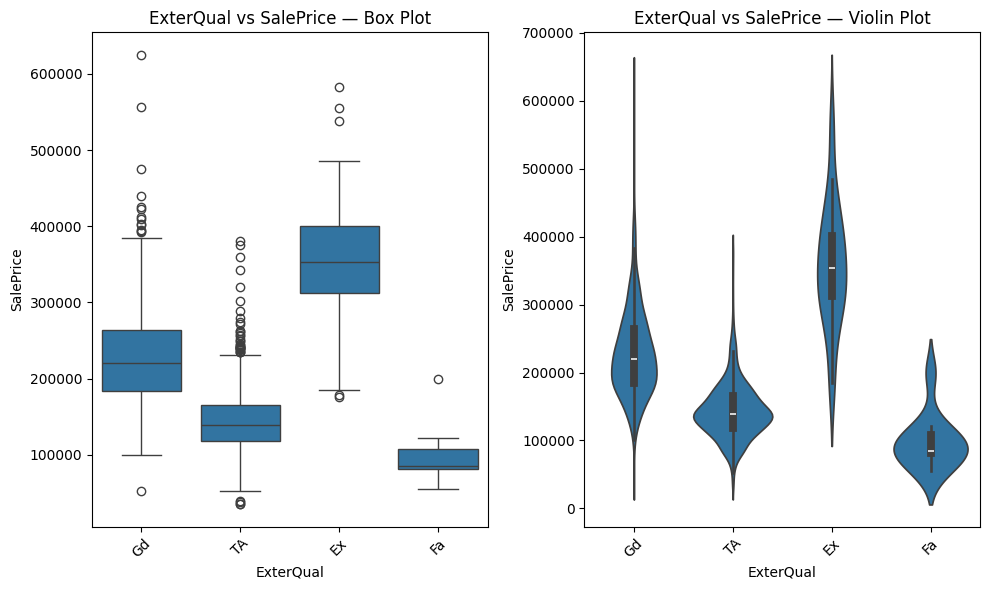


=== Quantitative Analysis for 'Foundation' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'PConc' (44.2%)
Rare categories (<2%): Foundation
Slab     1.642857
Stone    0.357143
Wood     0.214286
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
            count      mean    median      std
Foundation                                    
PConc         619  221914.0  204900.0  79308.0
Wood            3  185667.0  164000.0  56695.0
CBlock        614  148456.0  140000.0  46414.0
Stone           5  145955.0  116000.0  68651.0
BrkTil        136  132199.0  126500.0  53725.0
Slab           23  110325.0  106500.0  31687.0

Spread Analysis:
Mean spread (max - min): $111,589 (62.4% of overall mean $178,800)
Median spread: $98,400
 → VERY STRONG predictor (large price differences)
Total outliers: 77 (5.5% of data)

ANOVA Test: F = 104.94, p = 3.93e-94, η² = 0.0700
 → Statistically VERY significant — powerful feature

Overlap Analysis (avera

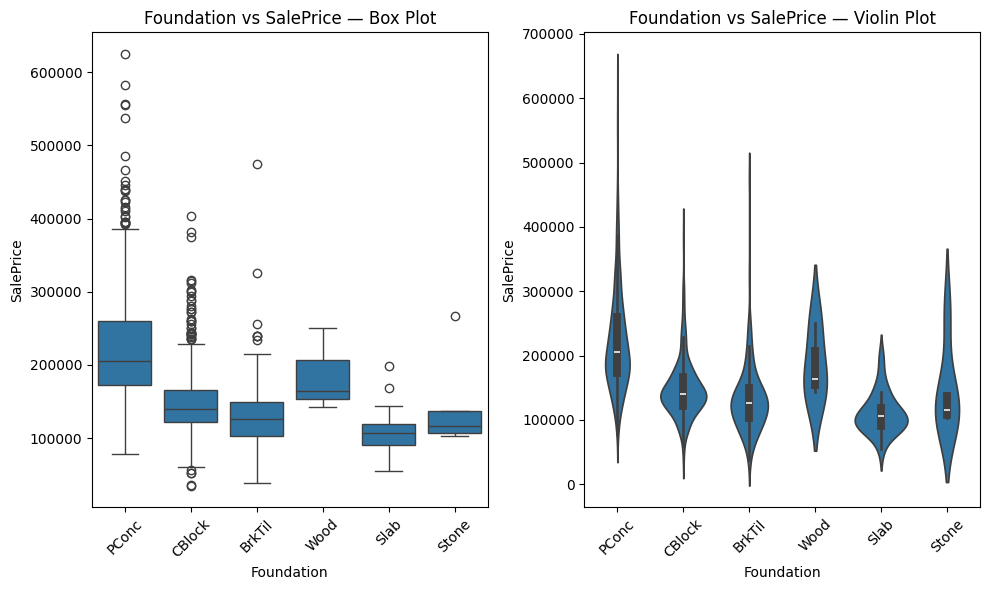


=== Quantitative Analysis for 'BsmtQual' ===
Ordinal Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'TA' (44.7%)
Rare categories (<2%): Series([], Name: proportion, dtype: float64)

Price Statistics (categories with ≥0 houses):
          count      mean    median      std
BsmtQual                                    
Ex          111  315552.0  315000.0  94838.0
Gd          595  201551.0  192000.0  57424.0
TA          626  140122.0  135250.0  42680.0
Fa           32  118260.0  112000.0  34004.0
NA           36  107496.0  104025.0  27431.0

Spread Analysis:
Mean spread (max - min): $208,056 (116.4% of overall mean $178,800)
Median spread: $210,975
 → VERY STRONG predictor (large price differences)
Total outliers: 64 (4.6% of data)

ANOVA Test: F = 304.35, p = 2.94e-188, η² = 0.1791
 → Statistically VERY significant — powerful feature

Overlap Analysis (average % overlap with other categories): 66.4%
 → High overlap — weak separation


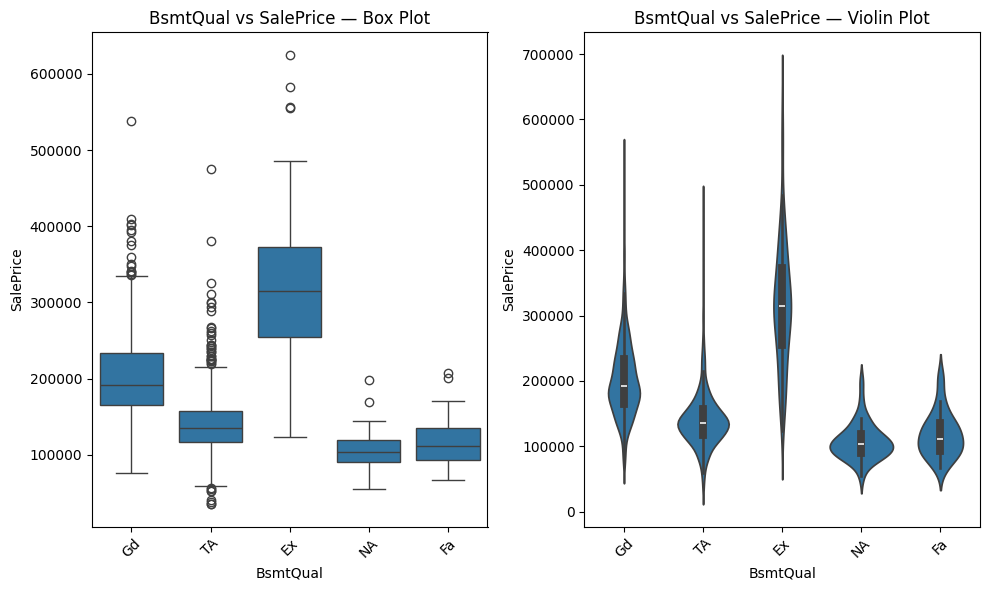


=== Quantitative Analysis for 'BsmtFinType1' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Unf' (29.5%)
Rare categories (<2%): Series([], Name: proportion, dtype: float64)

Price Statistics (categories with ≥0 houses):
              count      mean    median      std
BsmtFinType1                                    
GLQ             394  229304.0  212450.0  82387.0
Unf             413  171314.0  162000.0  72555.0
ALQ             215  160998.0  148500.0  50847.0
LwQ              69  150625.0  139000.0  51863.0
BLQ             143  148763.0  138500.0  46534.0
Rec             130  146697.0  141500.0  45405.0
NA               36  107496.0  104025.0  27431.0

Spread Analysis:
Mean spread (max - min): $121,808 (68.1% of overall mean $178,800)
Median spread: $108,425
 → VERY STRONG predictor (large price differences)
Total outliers: 69 (4.9% of data)

ANOVA Test: F = 60.07, p = 2.57e-66, η² = 0.0413
 → Statistically significant — good feature

Overlap Analysis (av

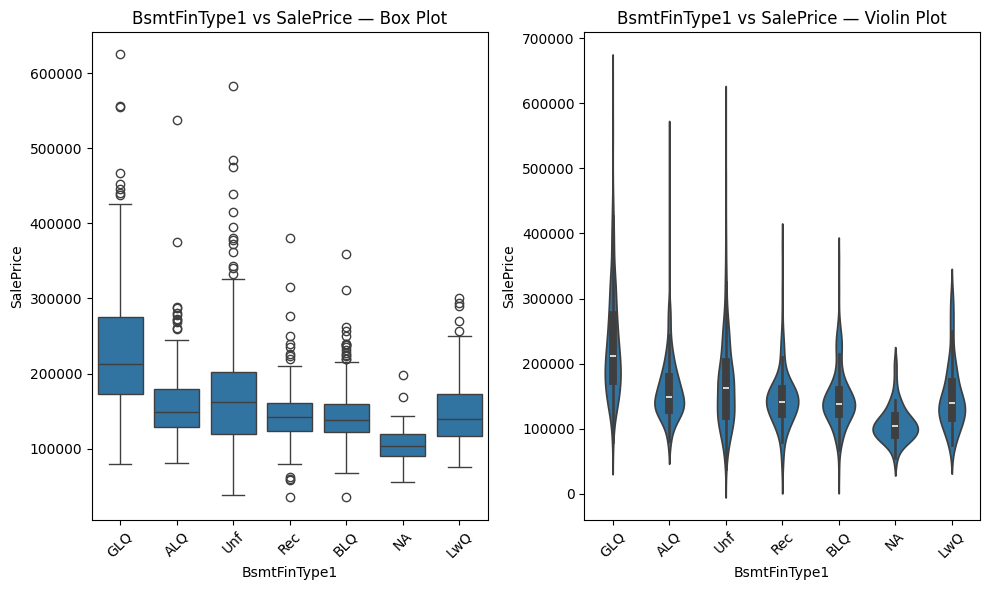


=== Quantitative Analysis for 'HeatingQC' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Ex' (50.4%)
Rare categories (<2%): HeatingQC
Po    0.071429
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
           count      mean    median      std
HeatingQC                                    
Ex           706  211984.0  194500.0  80714.0
Gd           234  155706.0  151700.0  48989.0
TA           414  141225.0  135000.0  46419.0
Fa            45  125995.0  126000.0  49261.0
Po             1   87000.0   87000.0      NaN

Spread Analysis:
Mean spread (max - min): $124,984 (69.9% of overall mean $178,800)
Median spread: $107,500
 → VERY STRONG predictor (large price differences)
Total outliers: 60 (4.3% of data)

ANOVA Test: F = 91.92, p = 1.99e-69, η² = 0.0618
 → Statistically VERY significant — powerful feature

Overlap Analysis (average % overlap with other categories): 45.5%
 → Moderate overlap — good feature


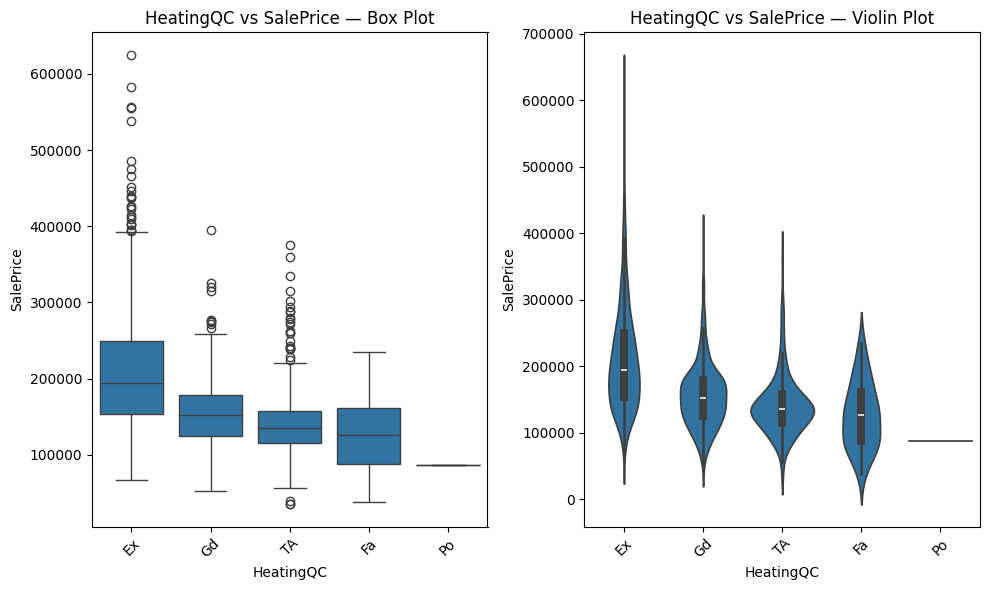


=== Quantitative Analysis for 'KitchenQual' ===
Ordinal Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'TA' (51.2%)
Rare categories (<2%): Series([], Name: proportion, dtype: float64)

Price Statistics (categories with ≥0 houses):
             count      mean    median      std
KitchenQual                                    
Ex              89  319385.0  315000.0  97687.0
Gd             561  210692.0  201000.0  63191.0
TA             717  139542.0  136900.0  38581.0
Fa              33  110447.0  115000.0  34856.0

Spread Analysis:
Mean spread (max - min): $208,938 (116.9% of overall mean $178,800)
Median spread: $200,000
 → VERY STRONG predictor (large price differences)
Total outliers: 45 (3.2% of data)

ANOVA Test: F = 399.46, p = 2.76e-187, η² = 0.2225
 → Statistically VERY significant — powerful feature

Overlap Analysis (average % overlap with other categories): 68.6%
 → High overlap — weak separation


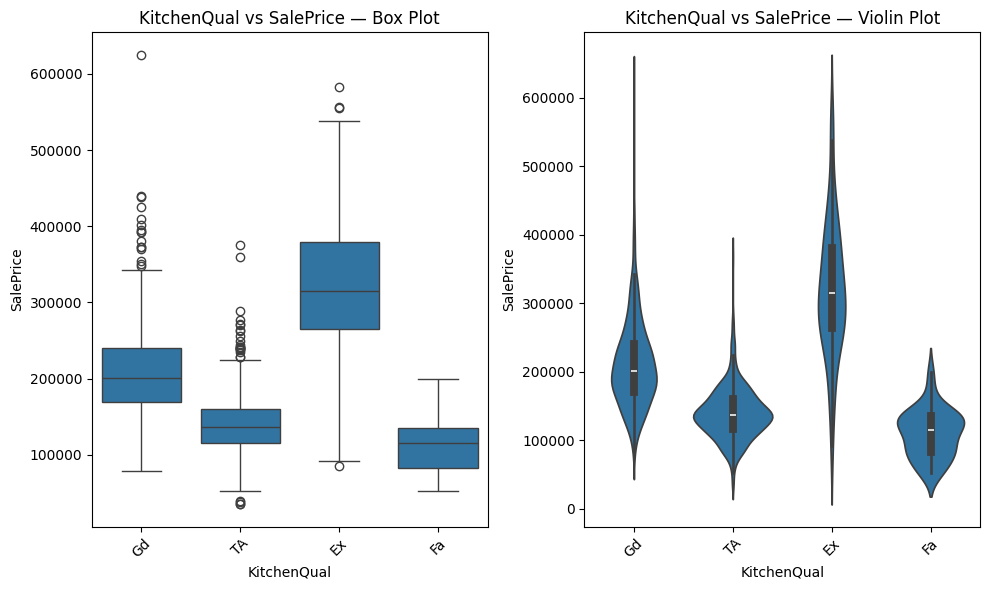


=== Quantitative Analysis for 'FireplaceQu' ===
Ordinal Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'NA' (47.5%)
Rare categories (<2%): FireplaceQu
Ex    1.428571
Po    1.285714
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
             count      mean    median      std
FireplaceQu                                    
Ex              20  323005.0  314250.0  91798.0
Gd             362  222737.0  202582.0  86963.0
TA             304  203138.0  186600.0  64495.0
Fa              31  165640.0  157000.0  34606.0
NA             665  141317.0  135000.0  44181.0
Po              18  131349.0  131500.0  26281.0

Spread Analysis:
Mean spread (max - min): $191,656 (107.2% of overall mean $178,800)
Median spread: $182,750
 → VERY STRONG predictor (large price differences)
Total outliers: 37 (2.6% of data)

ANOVA Test: F = 115.44, p = 2.92e-102, η² = 0.0765
 → Statistically VERY significant — powerful feature

Overlap Analysis (ave

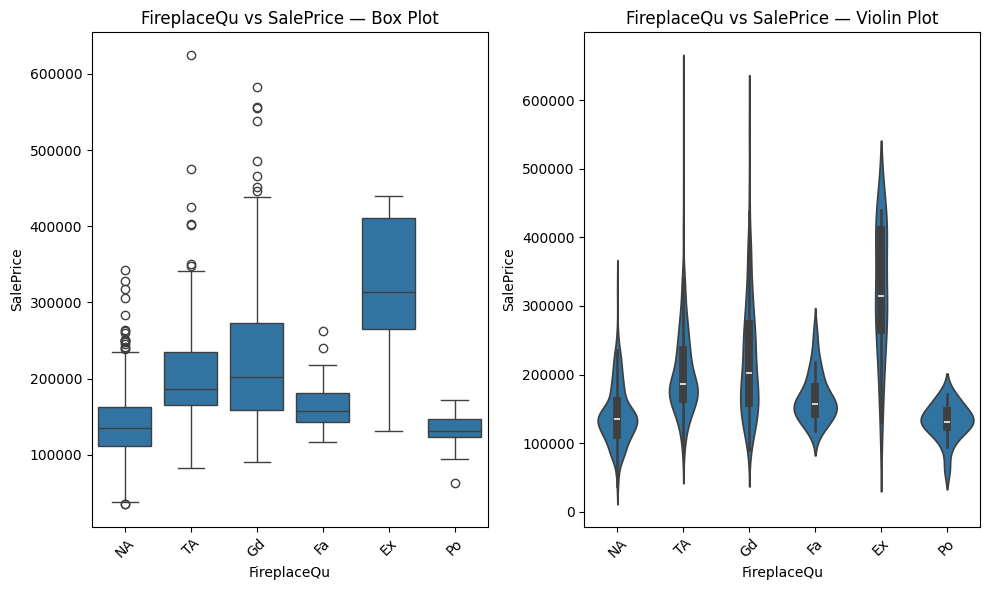


=== Quantitative Analysis for 'GarageType' ===
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Attchd' (59.6%)
Rare categories (<2%): GarageType
Basment    1.357143
CarPort    0.642857
2Types     0.357143
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
            count      mean    median       std
GarageType                                     
BuiltIn        85  256669.0  233000.0  103485.0
Attchd        834  199067.0  183350.0   69392.0
Basment        19  160571.0  148000.0   63967.0
2Types          5  147940.0  150000.0   37950.0
Detchd        376  133473.0  129500.0   40666.0
CarPort         9  109962.0  108000.0   24638.0
NA             72  104374.0  100000.0   31668.0

Spread Analysis:
Mean spread (max - min): $152,296 (85.2% of overall mean $178,800)
Median spread: $133,000
 → VERY STRONG predictor (large price differences)
Total outliers: 58 (4.1% of data)

ANOVA Test: F = 85.05, p = 6.83e-91, η² = 0.0575
 → Statistical

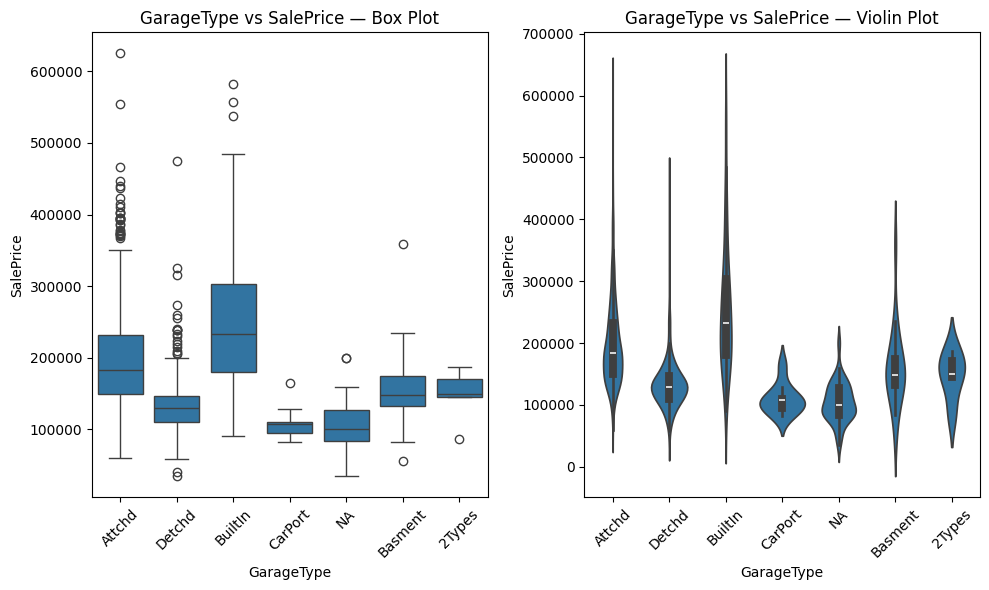


=== Quantitative Analysis for 'GarageFinish' ===
Ordinal Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Unf' (42.0%)
Rare categories (<2%): Series([], Name: proportion, dtype: float64)

Price Statistics (categories with ≥0 houses):
              count      mean    median      std
GarageFinish                                    
Fin             329  234237.0  215000.0  85670.0
RFn             411  201228.0  190000.0  62914.0
Unf             588  141218.0  135000.0  45605.0
NA               72  104374.0  100000.0  31668.0

Spread Analysis:
Mean spread (max - min): $129,863 (72.6% of overall mean $178,800)
Median spread: $115,000
 → VERY STRONG predictor (large price differences)
Total outliers: 60 (4.3% of data)

ANOVA Test: F = 213.96, p = 3.53e-114, η² = 0.1329
 → Statistically VERY significant — powerful feature

Overlap Analysis (average % overlap with other categories): 71.5%
 → High overlap — weak separation


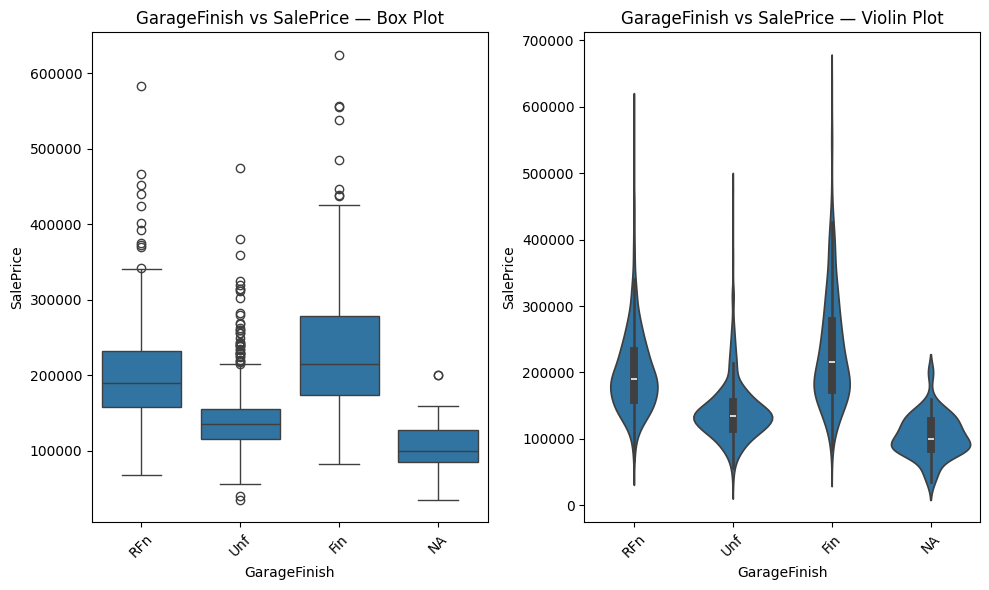




Binary Features




=== Quantitative Analysis for 'BsmtFinType2' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Unf' (85.9%)
Rare categories (<2%): BsmtFinType2
ALQ    1.357143
GLQ    1.000000
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
              count      mean    median       std
BsmtFinType2                                     
ALQ              19  209942.0  174900.0  104765.0
Unf            1203  182392.0  165000.0   75782.0
GLQ              14  180982.0  203125.0   64573.0
Rec              53  165123.0  147000.0   59730.0
LwQ              42  158982.0  150950.0   40592.0
BLQ              32  149885.0  143000.0   41678.0
NA               37  112266.0  106250.0   39668.0

Spread Analysis:
Mean spread (max - min): $97,676 (54.6% of overall mean $178,800)
Median spread: $96,875
 → VERY STRONG predictor (large price differences)
Total outliers: 58 (4.1% of data)

ANOVA Test: F = 7.75, p = 3.24e-08, η

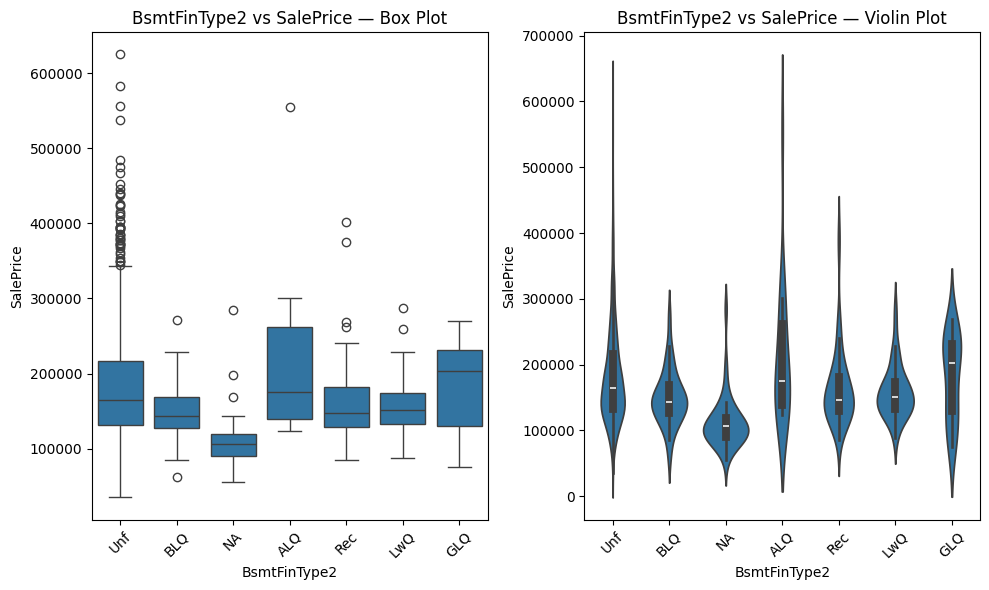


=== Quantitative Analysis for 'BsmtExposure' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'No' (65.4%)
Rare categories (<2%): Series([], Name: proportion, dtype: float64)

Price Statistics (categories with ≥0 houses):
              count      mean    median       std
BsmtExposure                                     
Gd              120  248844.0  220750.0  106069.0
Av              216  204334.0  186675.0   81544.0
Mn              111  194262.0  185000.0   77258.0
No              916  164516.0  152000.0   59062.0
NA               37  109793.0  106250.0   30444.0

Spread Analysis:
Mean spread (max - min): $139,051 (77.8% of overall mean $178,800)
Median spread: $114,500
 → VERY STRONG predictor (large price differences)
Total outliers: 56 (4.0% of data)

ANOVA Test: F = 58.69, p = 7.73e-46, η² = 0.0404
 → Statistically significant — good feature

Overlap Analysis (average % overlap with other categories): 76.3%
 → High overlap — weak separati

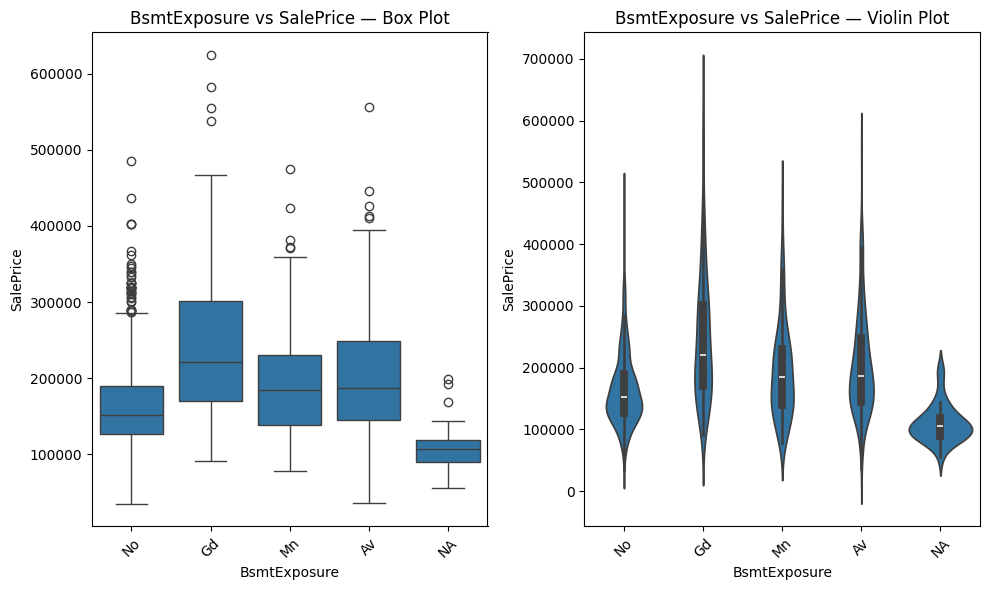


=== Quantitative Analysis for 'SaleType' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'WD' (86.9%)
Rare categories (<2%): SaleType
ConLD    0.642857
ConLI    0.357143
CWD      0.285714
ConLw    0.285714
Oth      0.214286
Con      0.142857
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
          count      mean    median       std
SaleType                                     
New         115  271636.0  248328.0   96054.0
Con           2  269600.0  269600.0   76933.0
CWD           4  210600.0  188750.0   86421.0
ConLI         5  200390.0  125000.0  145283.0
WD         1216  171406.0  156750.0   66167.0
ConLw         4  164625.0  175750.0   55844.0
COD          42  142877.0  138250.0   47111.0
ConLD         9  138781.0  140000.0   53877.0
Oth           3  119850.0  116050.0   28441.0

Spread Analysis:
Mean spread (max - min): $151,786 (84.9% of overall mean $178,800)
Median spread: $153,550
 → VERY STRONG predi

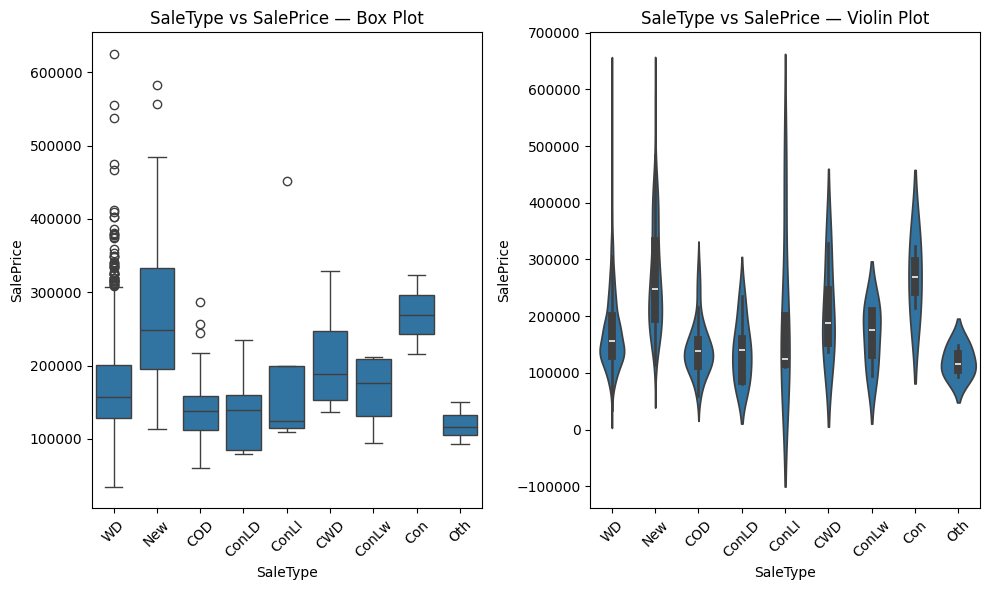


=== Quantitative Analysis for 'Condition1' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Norm' (86.4%)
Rare categories (<2%): Condition1
RRAn    1.714286
PosN    1.285714
RRAe    0.785714
PosA    0.571429
RRNn    0.357143
RRNe    0.142857
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
            count      mean    median      std
Condition1                                    
PosA            8  225875.0  212500.0  52349.0
PosN           18  216875.0  206000.0  66719.0
RRNn            5  212400.0  214000.0  93823.0
RRNe            2  190750.0  190750.0   5303.0
Norm         1209  182162.0  165000.0  75655.0
RRAn           24  181888.0  168745.0  67568.0
Feedr          79  142867.0  140000.0  42292.0
RRAe           11  138400.0  142500.0  24031.0
Artery         44  130850.0  116500.0  66464.0

Spread Analysis:
Mean spread (max - min): $95,025 (53.1% of overall mean $178,800)
Median spread: $97,500
 → VERY STR

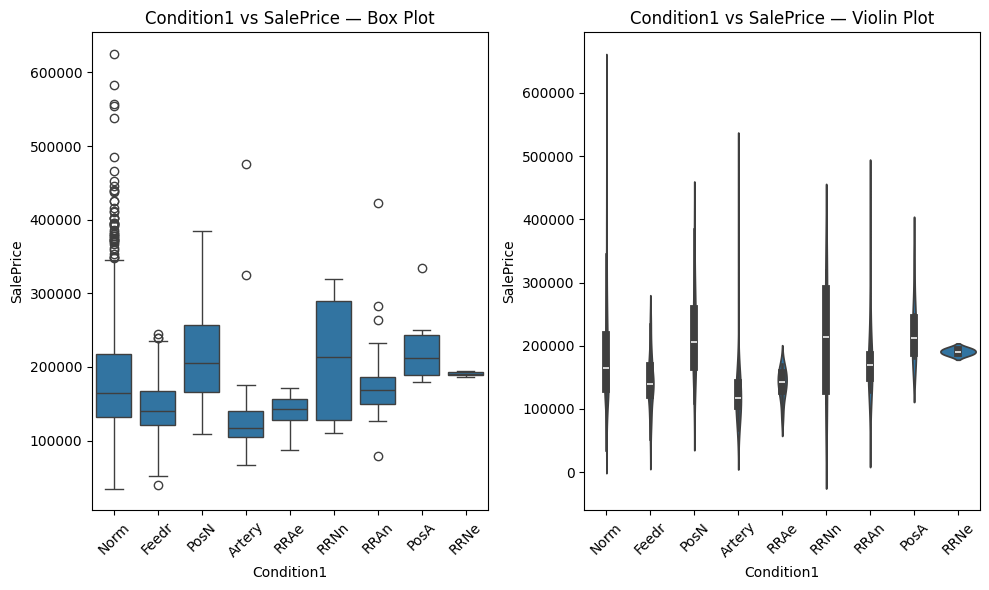


=== Quantitative Analysis for 'BsmtCond' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'TA' (90.1%)
Rare categories (<2%): BsmtCond
Po    0.071429
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
          count      mean    median      std
BsmtCond                                    
Gd           61  210749.0  193879.0  67293.0
TA         1261  181299.0  164000.0  74559.0
Fa           41  119743.0  117000.0  38194.0
NA           36  107496.0  104025.0  27431.0
Po            1   67000.0   67000.0      NaN

Spread Analysis:
Mean spread (max - min): $143,749 (80.4% of overall mean $178,800)
Median spread: $126,879
 → VERY STRONG predictor (large price differences)
Total outliers: 55 (3.9% of data)

ANOVA Test: F = 19.36, p = 1.62e-15, η² = 0.0137
 → Not significant — weak feature

Overlap Analysis (average % overlap with other categories): 38.2%
 → Moderate overlap — good feature


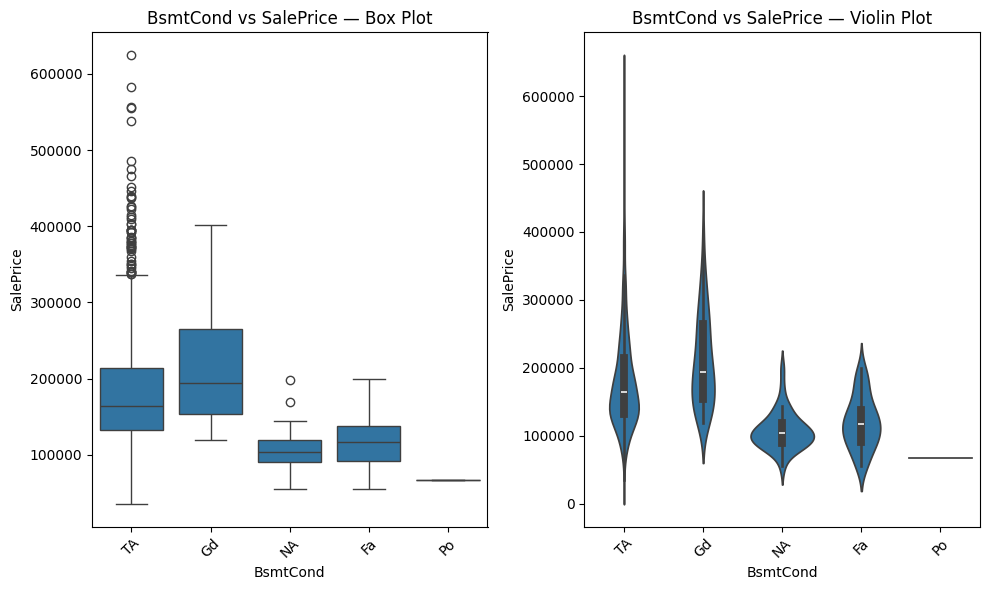


=== Quantitative Analysis for 'BldgType' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: '1Fam' (83.6%)
Rare categories (<2%): Series([], Name: proportion, dtype: float64)

Price Statistics (categories with ≥0 houses):
          count      mean    median      std
BldgType                                    
1Fam       1170  183368.0  165550.0  77031.0
TwnhsE      112  181156.0  171825.0  60757.0
Twnhs        42  135005.0  133750.0  41072.0
Duplex       47  129699.0  135000.0  24077.0
2fmCon       29  128393.0  127500.0  35192.0

Spread Analysis:
Mean spread (max - min): $54,975 (30.7% of overall mean $178,800)
Median spread: $44,325
 → STRONG predictor
Total outliers: 54 (3.9% of data)

ANOVA Test: F = 13.65, p = 6.42e-11, η² = 0.0097
 → Not significant — weak feature

Overlap Analysis (average % overlap with other categories): 73.3%
 → High overlap — weak separation


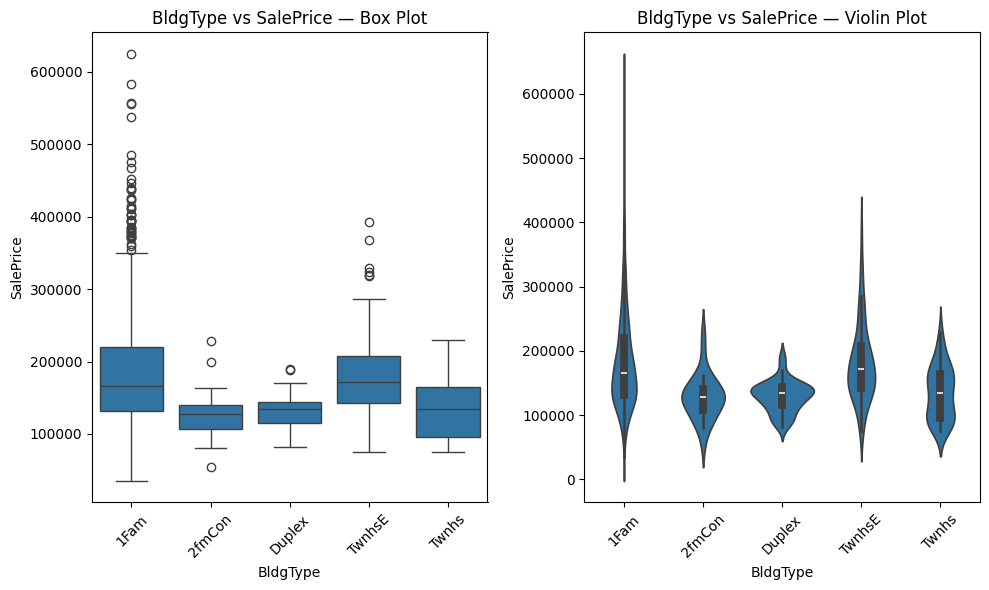


=== Quantitative Analysis for 'ExterCond' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'TA' (88.2%)
Rare categories (<2%): ExterCond
Fa    1.785714
Ex    0.214286
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
           count      mean    median       std
ExterCond                                     
Ex             3  201333.0  161000.0  109235.0
TA          1235  181325.0  165000.0   74433.0
Gd           137  168371.0  148000.0   73064.0
Fa            25  108495.0  115000.0   38179.0

Spread Analysis:
Mean spread (max - min): $92,839 (51.9% of overall mean $178,800)
Median spread: $50,000
 → VERY STRONG predictor (large price differences)
Total outliers: 56 (4.0% of data)

ANOVA Test: F = 9.03, p = 6.38e-06, η² = 0.0064
 → Not significant — weak feature

Overlap Analysis (average % overlap with other categories): 62.2%
 → High overlap — weak separation


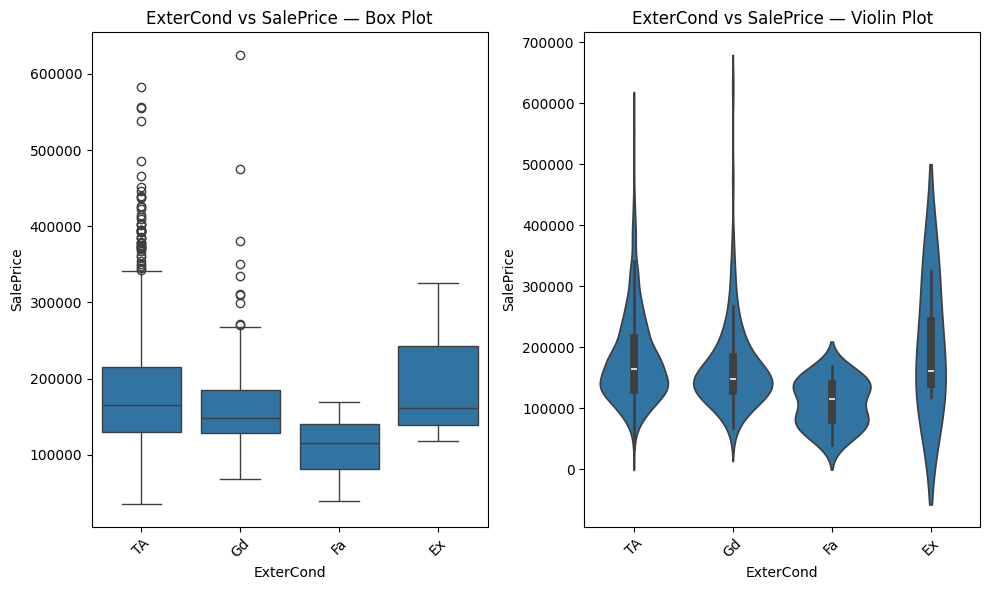


=== Quantitative Analysis for 'GarageQual' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'TA' (90.3%)
Rare categories (<2%): GarageQual
Gd    0.928571
Ex    0.214286
Po    0.214286
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
            count      mean    median       std
GarageQual                                     
Ex              3  241000.0  127500.0  202680.0
Gd             13  211314.0  185000.0   75094.0
TA           1264  184749.0  167700.0   73548.0
Fa             45  122489.0  112000.0   43624.0
NA             72  104374.0  100000.0   31668.0
Po              3  100167.0   96500.0   35144.0

Spread Analysis:
Mean spread (max - min): $140,833 (78.8% of overall mean $178,800)
Median spread: $88,500
 → VERY STRONG predictor (large price differences)
Total outliers: 56 (4.0% of data)

ANOVA Test: F = 24.61, p = 8.17e-24, η² = 0.0173
 → Not significant — weak feature

Overlap Analysis (average % over

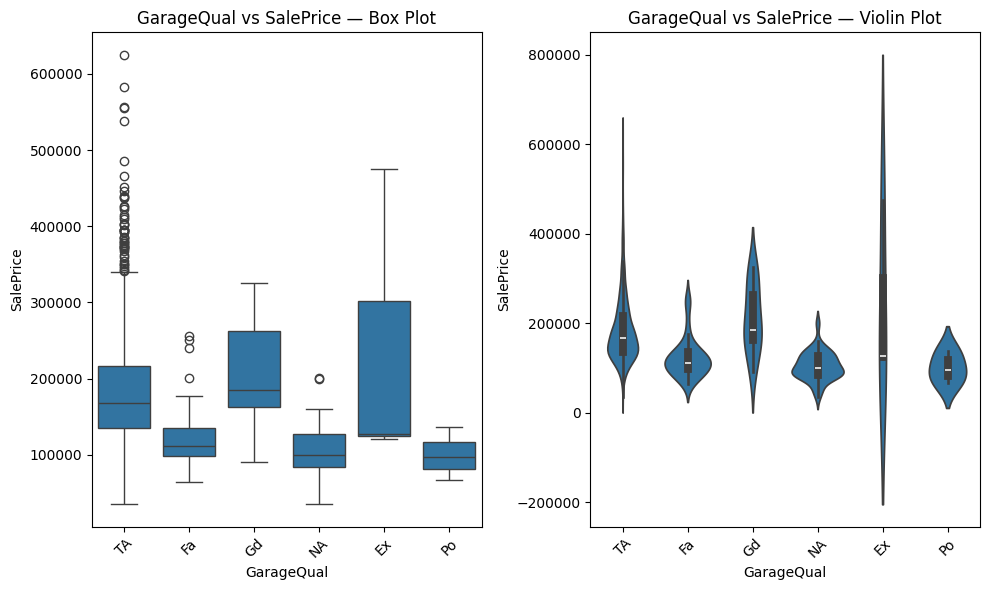


=== Quantitative Analysis for 'SaleCondition' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Normal' (82.4%)
Rare categories (<2%): SaleCondition
Family     1.428571
Alloca     0.571429
AdjLand    0.285714
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
               count      mean    median      std
SaleCondition                                    
Partial          118  268910.0  245589.0  96669.0
Normal          1153  173843.0  159000.0  66385.0
Family            20  149600.0  140500.0  47820.0
Alloca             8  143454.0  118911.0  92241.0
Abnorml           97  140115.0  130000.0  57120.0
AdjLand            4  104125.0  104000.0  26135.0

Spread Analysis:
Mean spread (max - min): $164,785 (92.2% of overall mean $178,800)
Median spread: $141,589
 → VERY STRONG predictor (large price differences)
Total outliers: 52 (3.7% of data)

ANOVA Test: F = 49.98, p = 1.03e-47, η² = 0.0346
 → Statistically signific

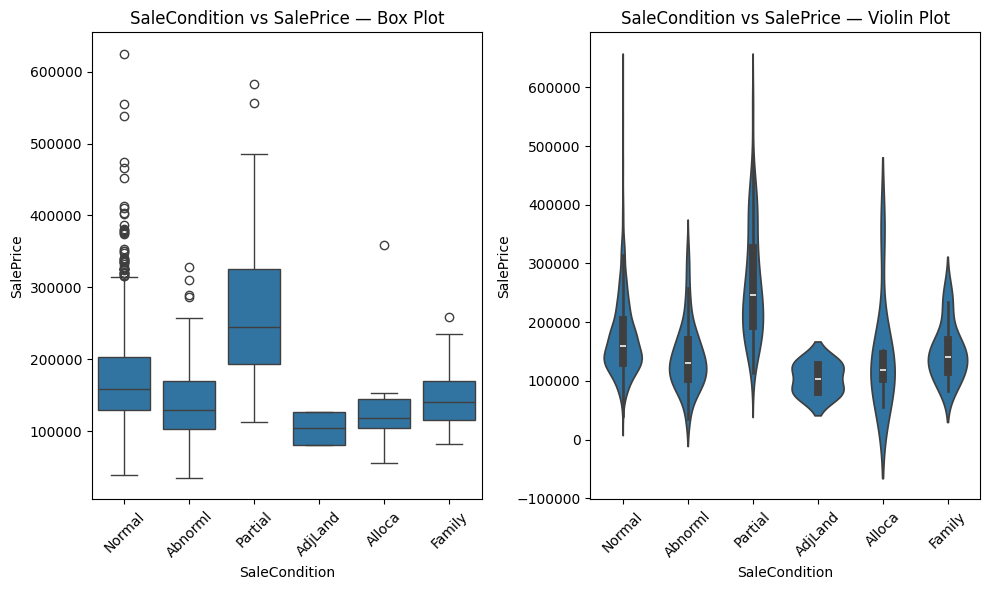


=== Quantitative Analysis for 'RoofStyle' ===
Binary Feature
overall, mean: 178799.78785714286, median: 161000.0
Dominant category: 'Gable' (78.4%)
Rare categories (<2%): RoofStyle
Flat       0.857143
Gambrel    0.785714
Mansard    0.428571
Shed       0.142857
Name: proportion, dtype: float64

Price Statistics (categories with ≥0 houses):
           count      mean    median       std
RoofStyle                                     
Shed           2  225000.0  225000.0   49497.0
Hip          272  213800.0  174000.0  103847.0
Flat          12  188000.0  182500.0   60248.0
Gable       1097  170305.0  159000.0   62778.0
Mansard        6  166333.0  163500.0   48401.0
Gambrel       11  148909.0  139000.0   67014.0

Spread Analysis:
Mean spread (max - min): $76,091 (42.6% of overall mean $178,800)
Median spread: $86,000
 → STRONG predictor
Total outliers: 43 (3.1% of data)

ANOVA Test: F = 16.27, p = 1.26e-15, η² = 0.0115
 → Not significant — weak feature

Overlap Analysis (average % overlap 

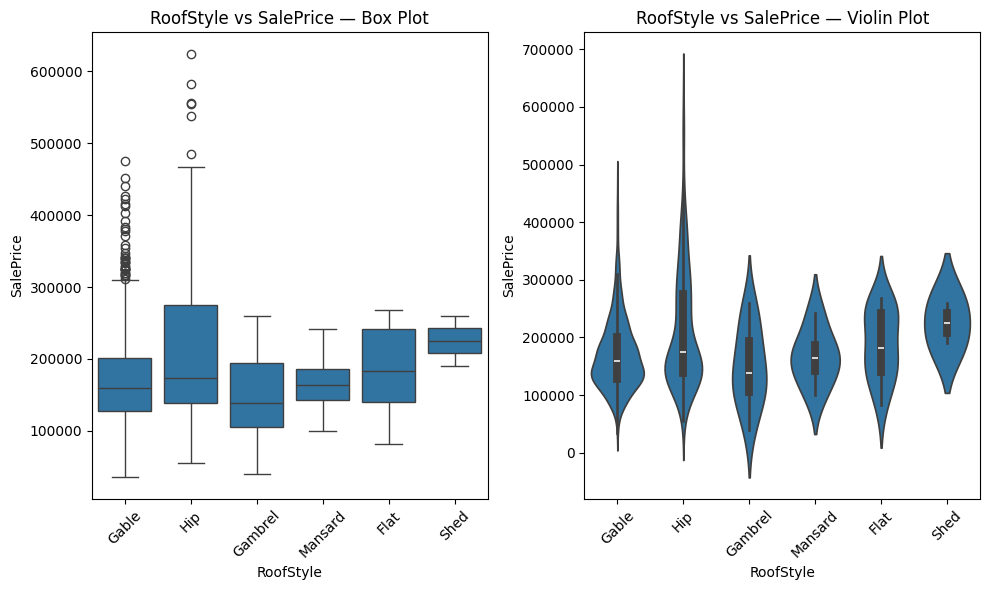

In [106]:
for col in cat_cols:
    if col not in transformations['Binary']:
       quantitative_categorical_analysis(col)
print('''


Binary Features


''')
for col in transformations['Binary']:
    quantitative_categorical_analysis(col)

In [107]:
transformations['cat_grouping']={} #-> drop LotConfig, BsmtFinType2, Condition1, RoofStyle

In [108]:
transformations['cat_grouping']['LotShape']={'IR2':'IR1'}
transformations['cat_grouping']['Neighborhood']={'Veenker': 'Somerst', 'Crawfor':'ClearCr','Blmngtn':'CollgCr',
'Gilbert':'CollgCr','NWAmes':'CollgCr','NPkVill':'NAmes','SWISU':'NAmes','Blueste':'Sawyer','BrkSide':'OldTown','Edwards':'OldTown'}
transformations['cat_grouping']['SaleType']={'Con':'New','CWD':'WD','ConLI':'WD','ConLw':'WD','ConLD':'COD','Oth':'COD'}
transformations['cat_grouping']['RoofStyle']={'Shed':'Hip','Mansard':'Flat'}
transformations['cat_grouping']['Condition1']={'RRAn':'Norm','RRNe':'Norm','RRNn':'PosN','PosA':'PosN','RRAe':'Feedr'}
transformations['cat_grouping']['BldgType']={'Twnhs':'Duplex','2fmCon':'Duplex'}
transformations['cat_grouping']['GarageQual']={'Po':'Fa'}

In [109]:
cols_to_drop.extend(['LotConfig', 'BsmtFinType2', 'Condition1', 'RoofStyle'])

In [110]:
df_cat_eng= df[cat_cols].copy()

In [111]:
for key in transformations['cat_grouping']:
    df_cat_eng[key]=df_cat_eng[key].replace(transformations['cat_grouping'][key]).astype('object')

In [112]:
cols_to_drop=list(set(cols_to_drop))
df_final = pd.concat([
    df_corr_check.drop(columns=cols_to_drop, errors='ignore'),
    df_cat_eng.drop(columns=cols_to_drop, errors='ignore')
], axis=1)

In [113]:
print(df_final.shape)
df_final.columns

(1400, 47)


Index(['LotFrontage', 'MasVnrArea', 'GarageArea', 'SalePrice', 'OverallQual',
       'OverallCond', 'BedroomAbvGr', 'Fireplaces', 'eng_houseage',
       'eng_houseremodelage', 'eng_totalsf', 'eng_totalBsmtArea',
       'eng_totalFlrsf', 'eng_totalarea', 'eng_totalbaths', 'skew_LotArea',
       'skew_WoodDeckSF', 'skew_OpenPorchSF', 'hasBsmtFinSF1', 'has2ndFlrSF',
       'hasWoodDeckSF', 'hasOpenPorchSF', 'hasMasVnrArea', 'MSZoning',
       'LotShape', 'LandContour', 'Neighborhood', 'BldgType', 'HouseStyle',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageFinish',
       'GarageQual', 'SaleType', 'SaleCondition'],
      dtype='object')

#data-preprocessing and encoding

In [114]:
df_final.dtypes

LotFrontage            float64
MasVnrArea             float64
GarageArea               int64
SalePrice                int64
OverallQual              int64
OverallCond              int64
BedroomAbvGr             int64
Fireplaces               int64
eng_houseage             int64
eng_houseremodelage      int64
eng_totalsf              int64
eng_totalBsmtArea        int64
eng_totalFlrsf           int64
eng_totalarea            int64
eng_totalbaths         float64
skew_LotArea           float64
skew_WoodDeckSF        float64
skew_OpenPorchSF       float64
hasBsmtFinSF1            int64
has2ndFlrSF              int64
hasWoodDeckSF            int64
hasOpenPorchSF           int64
hasMasVnrArea            int64
MSZoning                object
LotShape                object
LandContour             object
Neighborhood            object
BldgType                object
HouseStyle              object
Exterior1st             object
Exterior2nd             object
MasVnrType              object
ExterQua

In [115]:
cat_cols=[]
num_cols=[]
for col in df_final.columns:
    if df_final[col].dtype=='object':
        cat_cols.append(col)
    else:
        num_cols.append(col)
num_cols.remove('SalePrice')

In [116]:
df_proc=df_final.copy()

In [117]:
for col in df_proc.columns:
    if col in cat_cols or col in categorized_cols['discrete_num_cols']:
        df_proc[col] = df_proc[col].fillna('NA')
    elif col!='SalePrice':
        meanval=df_proc[col].mean()
        df_proc[col] = df_proc[col].fillna(meanval)

In [118]:
transformations['Ordinal']

['OverallQual',
 'MasVnrType',
 'ExterQual',
 'BsmtQual',
 'FullBath',
 'KitchenQual',
 'Fireplaces',
 'FireplaceQu',
 'GarageFinish',
 'GarageCars']

In [119]:
ordinal_mapping = {
    'ExterQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'ExterCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtQual':  {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtCond':  {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtExposure': {'NA': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4},
    'BsmtFinType1': {'NA': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'BsmtFinType2': {'NA': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'HeatingQC': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'FireplaceQu': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'GarageFinish': {'NA': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3},
    'GarageQual': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'GarageCond': {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'PoolQC': {'NA': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
    'Fence': {'NA': 0, 'MnWw': 1, 'GdWo': 2, 'MnPrv': 3, 'GdPrv': 4},
    'PavedDrive': {'N': 0, 'P': 1, 'Y': 2},
    'Functional': {'Sal': 0, 'Sev': 1, 'Maj2': 2, 'Maj1': 3, 'Mod': 4, 'Min2': 5, 'Min1': 6, 'Typ': 7},
    'LandSlope': {'Gtl': 2, 'Mod': 1, 'Sev': 0}
}

In [120]:
for col, mapping in ordinal_mapping.items():
    if col in df_proc and mapping is not None:
        df_proc[col] = df_proc[col].map(mapping)

In [121]:
df_proc = pd.get_dummies(df_proc, columns=[col for col in cat_cols if col not in ordinal_mapping], drop_first=True, dtype=int) 

#LinearReg

In [122]:
from sklearn.preprocessing import StandardScaler
Y=df_proc['SalePrice']
X=df_proc.drop('SalePrice',axis=1)
scaler = StandardScaler()

In [140]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error, r2_score,mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [124]:
LR = LinearRegression()

In [125]:
def apply_lr(LR,X,Y):
    x_train,x_test,y_train,y_test= train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=None
    )
    LR.fit(x_train,y_train)
    pred_train=LR.predict(x_train)
    pred_test=LR.predict(x_test)
    return [mean_absolute_percentage_error(y_train, pred_train),mean_absolute_percentage_error(y_test, pred_test)]

In [127]:
X_lr=X.copy()
X_lr[num_cols] = scaler.fit_transform(X_lr[num_cols])
print(apply_lr(LR,X_lr,Y))

[0.09185255052337113, 0.10927055539749116]


In [128]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5)

In [146]:
def apply_kf_lr(LR,X,y):
    i=0
    for train, val in kf.split(X):
        i+=1
        print(f"test {i} out of {kf.n_splits}")
        X_cv_train = X.values[train]
        X_cv_val = X.values[val]

        y_cv_train = y.values[train]
        y_cv_val = y.values[val] 


        # Model fit and prediction
        model = LR.fit(X_cv_train,y_cv_train)
        if i==4:
            pred_lr=model
        y_pred_val = model.predict(X_cv_val)
        y_pred_train = model.predict(X_cv_train)
        # Computing errors
        mse_val = mean_squared_error(y_cv_val, y_pred_val)**0.5
        mse_train = mean_squared_error(y_cv_train, y_pred_train)**0.5

        r2_val = r2_score(y_cv_val, y_pred_val)
        r2_train = r2_score(y_cv_train, y_pred_train)

        print("Mean squared error: %.2f" % mse_train)
        print("Coefficient of determination: %.2f" % r2_train)
        
        print("Mean squared error: %.2f" % mse_val)
        print("Coefficient of determination: %.2f" % r2_val)
    return pred_lr

In [147]:
pred_lr=apply_kf_lr(LR,X,Y)

test 1 out of 5
Mean squared error: 21658.44
Coefficient of determination: 0.92
Mean squared error: 23451.83
Coefficient of determination: 0.89
test 2 out of 5
Mean squared error: 21430.73
Coefficient of determination: 0.92
Mean squared error: 23575.39
Coefficient of determination: 0.91
test 3 out of 5
Mean squared error: 20598.54
Coefficient of determination: 0.92
Mean squared error: 27493.67
Coefficient of determination: 0.88
test 4 out of 5
Mean squared error: 21875.88
Coefficient of determination: 0.92
Mean squared error: 22034.91
Coefficient of determination: 0.89
test 5 out of 5
Mean squared error: 20850.49
Coefficient of determination: 0.92
Mean squared error: 26467.73
Coefficient of determination: 0.87


In [148]:
pred_lr

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [131]:
from sklearn.linear_model import Lasso
lasso_lr=Lasso(alpha=1)
apply_lr(lasso_lr,X,Y)

C:\Users\capra\AppData\Roaming\Python\Python313\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.980e+10, tolerance: 6.468e+08
  model = cd_fast.enet_coordinate_descent(


[0.09183833088068423, 0.10937756533593351]

In [ ]:
#

In [150]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.model_selection import train_test_split

X_train_fe, X_test_fe, y_train_fe, y_test_fe = train_test_split(X, Y, test_size=0.2, random_state=42)

# Define the models
models = {
    'LinearRegression': LinearRegression(),
    'RandomForest': RandomForestRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42)
}

# Define the hyperparameter grids for each model
param_grids = {
    'LinearRegression': {},
    'RandomForest': {
        'n_estimators': [100, 200, 500],
        'max_depth': [None, 10, 30],
        'min_samples_split': [2, 5, 10],
    },
    'XGBoost': {
        'n_estimators': [100, 200, 500],
        'learning_rate': [0.01, 0.1, 0.3],
        'max_depth': [3, 6, 10],
    }
}

# 3-fold cross-validation
cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Train and tune the models
grids_fe = {}
pred_models=[]
for model_name, model in models.items():
    #print(f'Training and tuning {model_name}...')
    grids_fe[model_name] = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=cv, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grids_fe[model_name].fit(X_train_fe, y_train_fe) 
    best_params = grids_fe[model_name].best_params_
    best_score = np.sqrt(-1 * grids_fe[model_name].best_score_)
    pred_models.append(grids_fe[model_name].best_params_)
    
    print(f'Best parameters for {model_name}: {best_params}')
    print(f'Best RMSE for {model_name}: {best_score}\n')

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for LinearRegression: {}
Best RMSE for LinearRegression: 27294.80101815718

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Best RMSE for RandomForest: 25888.819858471416

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Best RMSE for XGBoost: 24642.038443819267



In [151]:
pred_models[0]=pred_lr

In [153]:
feat_eng

{'weak_cols': ['PoolArea',
  'MoSold',
  'BsmtFinSF2',
  'BsmtHalfBath',
  'BedroomAbvGr',
  'LowQualFinSF',
  'HalfBath',
  'ScreenPorch',
  'BsmtFullBath',
  '3SsnPorch',
  'LotFrontage',
  'BsmtUnfSF',
  'YrSold',
  'LotArea',
  'MiscVal',
  'EnclosedPorch',
  'OverallCond'],
 'check_and_eng': {'GrLivArea': ['TotRmsAbvGrd'],
  'TotalBsmtSF': ['1stFlrSF'],
  'GarageArea': ['GarageCars'],
  'YearBuilt': ['GarageYrBlt']},
 'compare_corr': {'eng_houseage': ['YrSold', 'YearBuilt'],
  'eng_houseremodelage': ['YrSold', 'YearRemodAdd'],
  'eng_totalsf': ['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtFinSF2'],
  'eng_totalBsmts1and2': ['BsmtFinSF1', 'BsmtFinSF2', 'TotalBsmtSF'],
  'eng_totalBsmtArea': ['BsmtFinSF1',
   'BsmtFinSF2',
   'BsmtUnfSF',
   'TotalBsmtSF'],
  'eng_totalFlrsf': ['1stFlrSF', '2ndFlrSF'],
  'eng_totalarea': ['GrLivArea', 'TotalBsmtSF'],
  'eng_totalbaths': ['BsmtFullBath', 'FullBath', 'BsmtHalfBath', 'HalfBath'],
  'eng_totalporchsf': ['OpenPorchSF',
   '3SsnPorch',
   '

In [152]:
transformations

{'Binary': ['BsmtFinType2',
  'BsmtExposure',
  'SaleType',
  'Condition1',
  'BsmtCond',
  'BldgType',
  'ExterCond',
  'GarageQual',
  'SaleCondition',
  'RoofStyle'],
 'Skew': ['LotFrontage',
  'LotArea',
  'MasVnrArea',
  'BsmtFinSF1',
  'TotalBsmtSF',
  'WoodDeckSF',
  'OpenPorchSF',
  'BsmtFinSF2',
  'BsmtUnfSF',
  'EnclosedPorch',
  '3SsnPorch',
  'ScreenPorch',
  'PoolArea',
  'eng_totalBsmtArea',
  'eng_totalporchsf'],
 'Ordinal': ['OverallQual',
  'MasVnrType',
  'ExterQual',
  'BsmtQual',
  'FullBath',
  'KitchenQual',
  'Fireplaces',
  'FireplaceQu',
  'GarageFinish',
  'GarageCars'],
 'cat_grouping': {'LotShape': {'IR2': 'IR1'},
  'Neighborhood': {'Veenker': 'Somerst',
   'Crawfor': 'ClearCr',
   'Blmngtn': 'CollgCr',
   'Gilbert': 'CollgCr',
   'NWAmes': 'CollgCr',
   'NPkVill': 'NAmes',
   'SWISU': 'NAmes',
   'Blueste': 'Sawyer',
   'BrkSide': 'OldTown',
   'Edwards': 'OldTown'},
  'SaleType': {'Con': 'New',
   'CWD': 'WD',
   'ConLI': 'WD',
   'ConLw': 'WD',
   'ConLD'

In [176]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer

# Assume:
# - train_df: original raw training data (with SalePrice)
# - test_df: original raw test data
# - df_final: your final processed training features (X — no SalePrice, after all engineering, grouping, ordinal, one-hot)
# - model: your trained model (e.g., XGBoost)
# - ordinal_mapping: your ordinal dictionaries
# - transformations['Skew']: list of columns to log
# - has_cols: list of columns for binary "has" flags
# - transformations['cat_grouping']: grouping dicts
# - test_ids: Id column from test
test_df=pd.read_csv("housepricesdata/train.csv")
train_df=pd.read_csv("housepricesdata/train.csv")

# Step 1: Apply the SAME feature engineering to test as you did to train
test_df['eng_houseage'] = test_df['YrSold'] - test_df['YearBuilt']
test_df['eng_houseremodelage'] = test_df['YrSold'] - test_df['YearRemodAdd']
test_df['eng_totalsf'] = test_df['1stFlrSF'] + test_df['2ndFlrSF'] + test_df['BsmtFinSF1'] + test_df['BsmtFinSF2']
test_df['eng_totalBsmtArea'] = test_df['BsmtFinSF1'] + test_df['BsmtFinSF2'] + test_df['BsmtUnfSF']
test_df['eng_totalFlrsf'] = test_df['1stFlrSF'] + test_df['2ndFlrSF']
test_df['eng_totalarea'] = test_df['GrLivArea'] + test_df['TotalBsmtSF']
test_df['eng_totalbaths'] = test_df['BsmtFullBath'] + test_df['FullBath'] + 0.5 * (test_df['BsmtHalfBath'] + test_df['HalfBath'])
test_df['eng_totalporchsf'] = test_df['OpenPorchSF'] + test_df['3SsnPorch'] + test_df['EnclosedPorch'] + test_df['ScreenPorch'] + test_df['WoodDeckSF']

# Log transforms
for col in transformations['Skew']:
    if col in test_df.columns:
        test_df[f'skew_{col}'] = np.log1p(test_df[col])

# Binary flags
for col in has_cols:
    if col in test_df.columns:
        test_df[f'has{col}'] = (test_df[col] > 0).astype(int)

# Grouping
for key in transformations['cat_grouping']:
    if key in test_df.columns:
        test_df[key] = test_df[key].replace(transformations['cat_grouping'][key])

# Ordinal encoding (same as train)
for col, mapping in ordinal_mapping.items():
    if col in test_df.columns and mapping is not None:
        test_df[col] = test_df[col].map(mapping)

# Step 2: Impute missing values using TRAIN statistics (no leakage)
# Numerical: median from processed train
num_cols = df_final.select_dtypes(include=['int64', 'float64']).columns
num_imputer = SimpleImputer(strategy='median')
num_imputer.fit(df_final[num_cols])  # Fit on processed train!

test_df[num_cols] = num_imputer.transform(test_df[num_cols])

# Categorical (object columns before one-hot): most frequent from train
cat_cols_before_onehot = test_df.select_dtypes(include='object').columns
if len(cat_cols_before_onehot) > 0:
    cat_imputer = SimpleImputer(strategy='most_frequent')
    # Fit on train's pre-one-hot categorical columns
    train_cat = train_df[cat_cols_before_onehot]  # or your processed train before one-hot
    cat_imputer.fit(train_cat)
    test_df[cat_cols_before_onehot] = cat_imputer.transform(test_df[cat_cols_before_onehot])

# Step 3: One-hot encode nominal categoricals (same as train)
nominal_cols = cat_cols_before_onehot.tolist()  # columns that are still object
test_encoded = pd.get_dummies(test_df, columns=nominal_cols, drop_first=True, dtype=int)

# Step 4: Align test columns EXACTLY to train processed columns (df_final)
# Add missing columns (from train one-hot) with 0
missing_cols = set(df_final.columns) - set(test_encoded.columns)
for c in missing_cols:
    test_encoded[c] = 0

# Remove any extra columns in test (shouldn't happen)
extra_cols = set(test_encoded.columns) - set(df_final.columns)
test_encoded = test_encoded.drop(columns=extra_cols, errors='ignore')

# Reorder to match train exactly
test_encoded = test_encoded[df_final.columns]

In [177]:
i=1
X_test=test_encoded.copy()
X_test_lr=X_test.copy()
X_test_lr[num_cols] = X_test_lr[num_cols]
submission = pd.DataFrame({'Id': test_ids, 'SalePrice': pred_models[0].predict(X_test_lr)})
submission.to_csv('submission0.csv', index=False)
for model in pred_models[1:]:
    submission = pd.DataFrame({'Id': test_ids, 'SalePrice': model.predict(X_test)})
    submission.to_csv(f'submission{i}.csv', index=False)
    i+=1

C:\Users\capra\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(


ValueError: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

#droping cols by intuition

In [81]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars',
       'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'MoSold', 'YrSold',
       'SaleType', 'SaleCondition', 'SalePrice'],
      dtype='object')

In [82]:
# df=df[[#'MSSubClass','HouseStyle', BldgType better
#        #'MSZoning', neighbourhood better
#        #'LotFrontage', instead LotArea is enough
#        'LotArea', 
#        #'LotShape', not important
#        #'LandContour', 'LotConfig' instead landSlope is used
#        'LandSlope', 'Neighborhood', 'Condition1',
#        'BldgType', 'OverallQual','OverallCond', 'YearBuilt',
#        'YearRemodAdd', 'RoofStyle', 
#        #'Exterior1st', 'Exterior2nd', OverallQual instead
#        #'MasVnrArea','ExterQual', 'ExterCond', 'Foundation', not imp
#        'BsmtQual', 'BsmtCond','BsmtExposure', 'BsmtFinType1', 
#        #'BsmtFinSF1', 'BsmtFinType2',not imp
#        #'BsmtFinSF2', 'BsmtUnfSF', not imp
#        'TotalBsmtSF', 'HeatingQC', 'CentralAir',
#        'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath',
#        'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual',
#        'TotRmsAbvGrd', 
#        #'Functional', other params cover it
#        'Fireplaces', 'GarageType',
#        #'GarageYrBlt','GarageFinish', 'GarageCars', other params cover it
#        'GarageArea', 'GarageQual', 'GarageCond','PavedDrive', 
#        #'WoodDeckSF', nnot imp
#        'OpenPorchSF', 'EnclosedPorch',
#        #'ScreenPorch', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition', not imp
#        'SalePrice']].copy()

In [83]:
df.shape

(1362, 62)

#duplicate rows

In [84]:
uniq_creteria=['BldgType','Neighborhood', 'GrLivArea','OverallQual','YearBuilt']

In [85]:
# df.duplicated(subset=uniq_creteria).sum()

In [86]:
# df.loc[df.duplicated(subset=uniq_creteria)][uniq_creteria]

In [87]:
# df=df.loc[~df.duplicated(subset=uniq_creteria)].reset_index(drop=True)

In [88]:
df.shape

(1362, 62)

In [89]:
df.dtypes

MSSubClass        object
MSZoning          object
LotFrontage      float64
LotArea            int64
LotShape          object
LandContour       object
LotConfig         object
Neighborhood      object
Condition1        object
BldgType          object
HouseStyle        object
OverallQual       object
OverallCond       object
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
Exterior1st       object
Exterior2nd       object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
HeatingQC         object
CentralAir        object
Electrical        object
1stFlrSF           int64
2ndFlrSF           int64
GrLivArea          int64
BsmtFullBath      object
FullBath          object
HalfBath          object
